<table align="center" width=100%>
    <tr>
        <td width="20%">
            <img src="GL-2.png">
            <img src="in_class.png">
        </td>
        <td>
            <div align="center">
                <font color="#21618C" size=8px>
                    <b> Order Delay prediction <br>
                    </b>
                </font>
            </div>
        </td>
    </tr>
</table>

* Lets import the required libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from scipy.stats import chi2_contingency
import statsmodels.formula.api as sfa
from statsmodels.stats.anova import anova_lm
plt.rcParams['figure.figsize']=[25,9]


* Lets read the data and gather some basic informations about data

In [2]:
data=pd.read_csv("DataCoSupplyChainDataset.csv",encoding='ISO-8859-1')



In [3]:
data.shape

(180519, 53)

* we can conclude that we have 52 independent features and around 180519 observations

In [4]:
data.isnull().sum().sort_values(ascending=False).head()

Product Description    180519
Order Zipcode          155679
Customer Lname              8
Customer Zipcode            3
Type                        0
dtype: int64

* we can conclude that Product description and order zipcode has huge amount of null values and customer  zipcode and 
customer lname has neglegible amount of nullvalues

<AxesSubplot:>

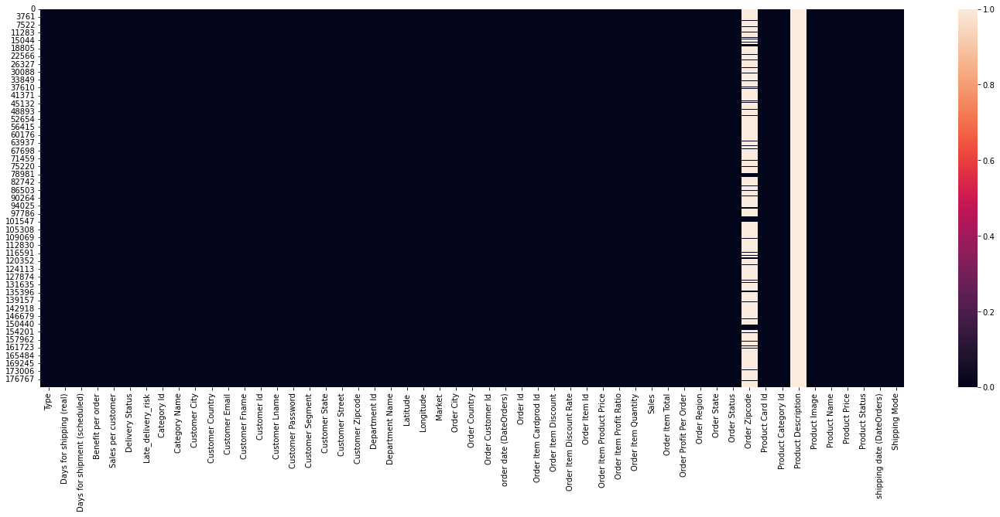

In [5]:
sns.heatmap(data.isnull())

In [6]:
((data.isnull().sum()/len(data))*100).sort_values(ascending=False).head()

Product Description    100.000000
Order Zipcode           86.239676
Customer Lname           0.004432
Customer Zipcode         0.001662
Type                     0.000000
dtype: float64

* product description has 100 percent values as null values

* lets load data dictionary

In [7]:
data_dictionary=pd.read_csv("DescriptionDataCoSupplyChain.csv")

In [8]:
pd.set_option('display.max_rows',None)

In [9]:
data_dictionary

,FIELDS,DESCRIPTION
0,Type,: Type of transaction made
1,Days for shipping (real),: Actual shipping days of the purchased product
2,Days for shipment (scheduled),: Days of scheduled delivery of the purchased...
3,Benefit per order,: Earnings per order placed
4,Sales per customer,: Total sales per customer made per customer
5,Delivery Status,: Delivery status of orders: Advance shipping...
6,Late_delivery_risk,: Categorical variable that indicates if send...
7,Category Id,: Product category code
8,Category Name,: Description of the product category
9,Customer City,: City where the customer made the purchase


# Feature Analysis

# Univarient Analysis 
* lets analise features one by one

# Target Feature ::Late Delivery risk

In [10]:
data_dictionary.iloc[6,:]

FIELDS                             Late_delivery_risk           
DESCRIPTION    :  Categorical variable that indicates if send...
Name: 6, dtype: object

* as explained by data dictionary this feature contain a bi class categories in yes or no for late delivery risk

In [11]:
data['Late_delivery_risk'].unique()

array([0, 1], dtype=int64)

In [12]:
data['Late_delivery_risk'].value_counts()

1    98977
0    81542
Name: Late_delivery_risk, dtype: int64

In [13]:
data['Late_delivery_risk'].value_counts([0])

1    0.548291
0    0.451709
Name: Late_delivery_risk, dtype: float64

* as we show both class are almost equally distributed that is banificial for us
as we have sufficient amount of examples for both class,but it is challenge for 
company as company had to face late delivery risk in almost 54 percent of orders

([<matplotlib.patches.Wedge at 0x209b3706f40>,
 [Text(-0.16624340273592472, 1.087365224313699, 'Yes'),
  Text(0.1662434027359248, -1.087365224313699, 'No')],
 [Text(-0.09067821967414075, 0.5931083041711086, '54.83'),
  Text(0.0906782196741408, -0.5931083041711086, '45.17')])

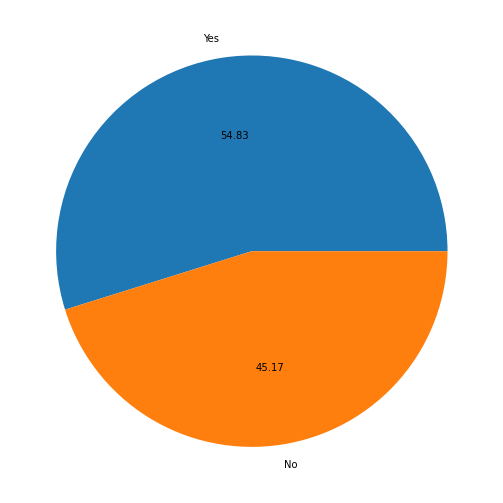

In [14]:
plt.pie(data['Late_delivery_risk'].value_counts(),labels=['Yes','No'],autopct='%0.2f')

In [15]:
significant_feature=pd.DataFrame(columns=['feature name','description','bivarient observation','statical test','business relevence'])

In [16]:
un_significant_feature=pd.DataFrame(columns=['feature name','description','bivarient observation','statical test','business relevence'])

# Feature 1 ::: Type

In [17]:
data.Type.describe()

count     180519
unique         4
top        DEBIT
freq       69295
Name: Type, dtype: object

* contain 4 unique categories ,debit is mode out of them which is repeated around 69295 times

In [18]:
data_dictionary.iloc[0,:]

FIELDS                                Type
DESCRIPTION    :  Type of transaction made
Name: 0, dtype: object

* as we seen from data dictionary type refer to types of transaction made by customer here,we will explore it more 

In [19]:
data.Type.value_counts()

DEBIT       69295
TRANSFER    49883
PAYMENT     41725
CASH        19616
Name: Type, dtype: int64

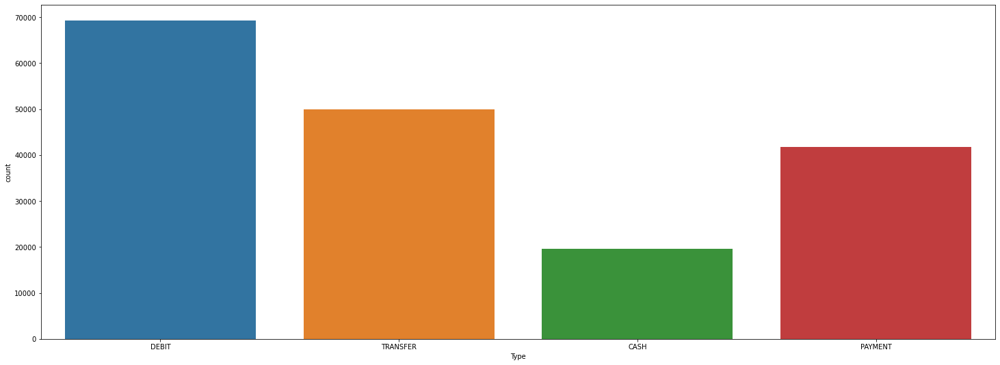

In [20]:
sns.countplot(data.Type)
plt.show()

* out of all four type of payment method the most used by customer is debit and least use by customer is cash

In [21]:
data.Type.value_counts([0])*100

DEBIT       38.386541
TRANSFER    27.633102
PAYMENT     23.113910
CASH        10.866446
Name: Type, dtype: float64

* 38 percent user use debit as transaction option,27 percent use transfer and only 10 percent use cash

# Bi varient Analysis

<AxesSubplot:xlabel='Type'>

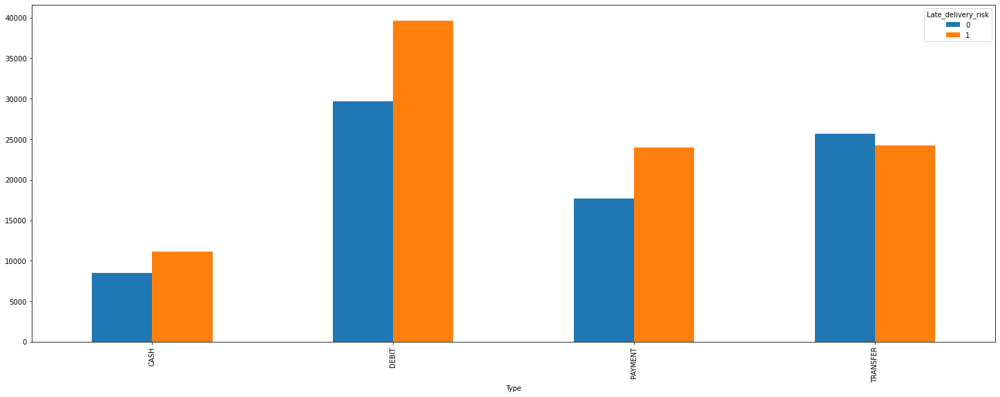

In [22]:
target=data['Late_delivery_risk']
table=pd.crosstab(data.Type,target)
table.plot(kind='bar')

* statistical test to check relation between 'Type and 'Target

In [23]:
# cat vs cat so we will go with chisquare


In [24]:
c, p, dof, expected = chi2_contingency(table)
p

5.128672571053333e-239

* p values is almost 0 so we can conclude that type has effect on target

In [25]:
significant_feature.loc[len(significant_feature.index)]=['Type','Type of transaction made','diffrent type of transaction have diffrent delay ratio','relevent according to chi_square','can not conclude']

# feature 2::: Days for shiping (real)

In [26]:
data['Days for shipping (real)'].head()

0    3
1    5
2    4
3    3
4    2
Name: Days for shipping (real), dtype: int64

In [27]:
data['Days for shipping (real)'].describe()

count    180519.000000
mean          3.497654
std           1.623722
min           0.000000
25%           2.000000
50%           3.000000
75%           5.000000
max           6.000000
Name: Days for shipping (real), dtype: float64

* we can see that minimuim value for this feautre is 0 and max is 6 and mean and median lies at 3 showing that 1 to 6 days
are taken in shiping

* lets see data defination to know what is there in data 

In [28]:
data_dictionary.iloc[1,:]

FIELDS                            Days for shipping (real)     
DESCRIPTION    :  Actual shipping days of the purchased product
Name: 1, dtype: object

* as mention in the data dictionary this feature contain detail of actual days taken in shiping of purchased product

In [29]:
data['Days for shipping (real)'].unique()

array([3, 5, 4, 2, 6, 0, 1], dtype=int64)

In [30]:
data['Days for shipping (real)'].value_counts().sort_values(ascending=False)

2    56618
3    28765
6    28723
4    28513
5    28163
0     5080
1     4657
Name: Days for shipping (real), dtype: int64

In [31]:
(data['Days for shipping (real)'].value_counts([0])*100).sort_values(ascending=False)

2    31.364012
3    15.934611
6    15.911345
4    15.795013
5    15.601128
0     2.814108
1     2.579784
Name: Days for shipping (real), dtype: float64

* we can conclude that max days taken on shiping is around 6 we can say that in 31 percent of order placed time taken to 
ship the product is 2 days, and in 2 percent cases item is shipped on same day of order place same for 1 day 2 percent 
item are shiped on 1 day after order and each of 3,4,5,6 days are taken by 15 percent of item each


([<matplotlib.patches.Wedge at 0x209b3914a60>,
 [Text(0.6078473830742207, 0.9167996285393127, 'Day 3'),
  Text(-0.8619762313989906, 0.683371770344074, 'Day 5'),
  Text(-1.040597708426081, -0.3565899735247606, 'Day 4'),
  Text(-0.26635799229789536, -1.0672644564207292, 'Day 2'),
  Text(0.7431486799809056, -0.8110055730034398, 'Day 6'),
  Text(1.0656673617626635, -0.2726776009755926, 'Day 0'),
  Text(1.096389305810112, -0.08905329923826967, 'Day 1')],
 [Text(0.331553118040484, 0.5000725246578068, '31.36'),
  Text(-0.4701688534903585, 0.3727482383694949, '15.93'),
  Text(-0.5675987500505895, -0.19450362192259665, '15.91'),
  Text(-0.14528617761703383, -0.5821442489567613, '15.80'),
  Text(0.4053538254441303, -0.44236667618369435, '15.60'),
  Text(0.5812731064159983, -0.14873323689577778, '2.81'),
  Text(0.5980305304418793, -0.048574526857238, '2.58')])

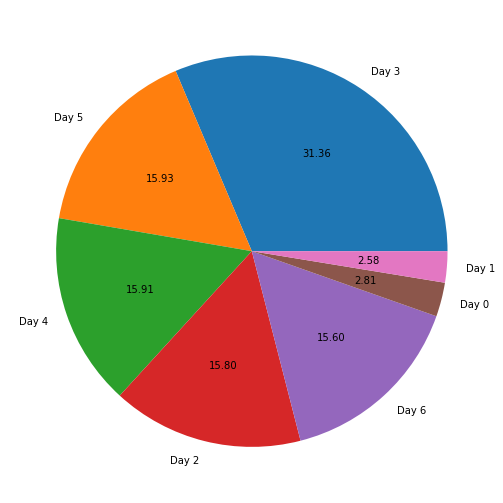

In [32]:
plt.pie(data['Days for shipping (real)'].value_counts(),labels=['Day 3','Day 5','Day 4','Day 2','Day 6','Day 0','Day 1'],autopct='%0.2f')

In [33]:
data['Days for shipping (real)'].value_counts()

2    56618
3    28765
6    28723
4    28513
5    28163
0     5080
1     4657
Name: Days for shipping (real), dtype: int64

<AxesSubplot:xlabel='Days for shipping (real)', ylabel='count'>

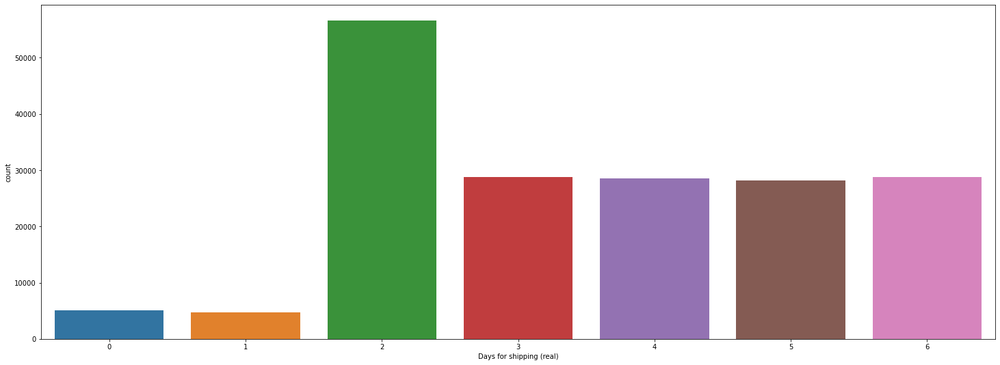

In [34]:
sns.countplot(data['Days for shipping (real)'])

# Bi - Varient Analysis

In [35]:
tbl=pd.crosstab( data['Days for shipping (real)'] ,target)

<AxesSubplot:xlabel='Days for shipping (real)'>

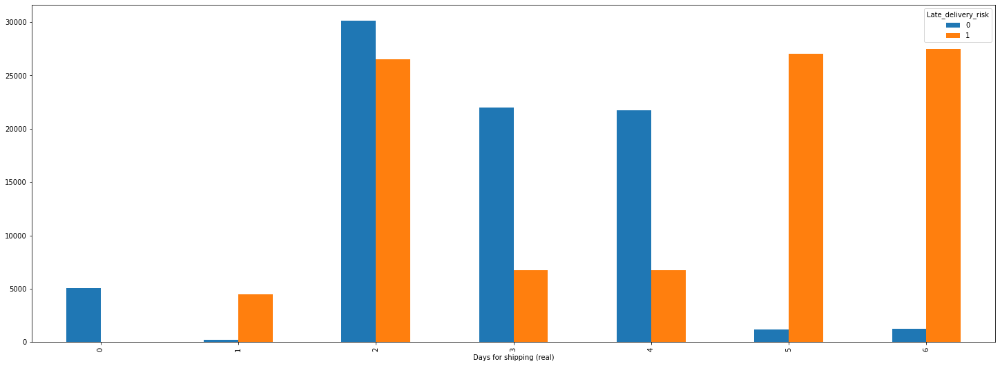

In [36]:
tbl.plot(kind='bar')

In [37]:
#Statistical test:we,ll be applying chi2 contingency test


c, p, dof, expected = chi2_contingency(tbl)
p



0.0

*Inference:It is statistically proven that data['Days for shipping (real)'] has effect on the target as p value is
    less than 0.05
    

In [38]:
significant_feature.loc[len(significant_feature.index)]=['Days for shipping (real)','Days of actual shipping of the purchased','orders having more shipping day are mostly delayed','relevent according to chi2 ','more shipping day effect delay']

# Feature 3 :: Days for shipment (scheduled)

In [39]:
data['Days for shipment (scheduled)'].head()

0    4
1    4
2    4
3    4
4    4
Name: Days for shipment (scheduled), dtype: int64

In [40]:
data['Days for shipment (scheduled)'].describe()

count    180519.000000
mean          2.931847
std           1.374449
min           0.000000
25%           2.000000
50%           4.000000
75%           4.000000
max           4.000000
Name: Days for shipment (scheduled), dtype: float64

* we can see that minimuim value for this feautre is 0 and max is 4 and mean is 3 and median lies at 4 and showing 
that 1 to 4 days are pridicted for shiping where as we see in last feature that actual time is more

* lets refer to data dictionary

In [41]:
data_dictionary.iloc[2,:]

FIELDS                             Days for shipment (scheduled)
DESCRIPTION    :  Days of scheduled delivery of the purchased...
Name: 2, dtype: object

* as mention in the data dictionary this feature contain detail of pridicted days taken in shiping of purchased product

In [42]:
data['Days for shipment (scheduled)'].unique()

array([4, 1, 2, 0], dtype=int64)

In [43]:
data['Days for shipment (scheduled)'].value_counts().sort_values(ascending=False)

4    107752
2     35216
1     27814
0      9737
Name: Days for shipment (scheduled), dtype: int64

In [44]:
(data['Days for shipment (scheduled)'].value_counts([0])*100).sort_values(ascending=False)

4    59.690116
2    19.508196
1    15.407796
0     5.393892
Name: Days for shipment (scheduled), dtype: float64

* we can conclude that max days pridicted on shiping is around 4 we can say that in 59.69 percent of order placed predicted time
taken to ship the product is 4 days, and in 5 percent cases item is predicted toshipped on same day of order place
1 and 2 day are predicted around 15 se 20 percent 


<AxesSubplot:xlabel='Days for shipment (scheduled)', ylabel='count'>

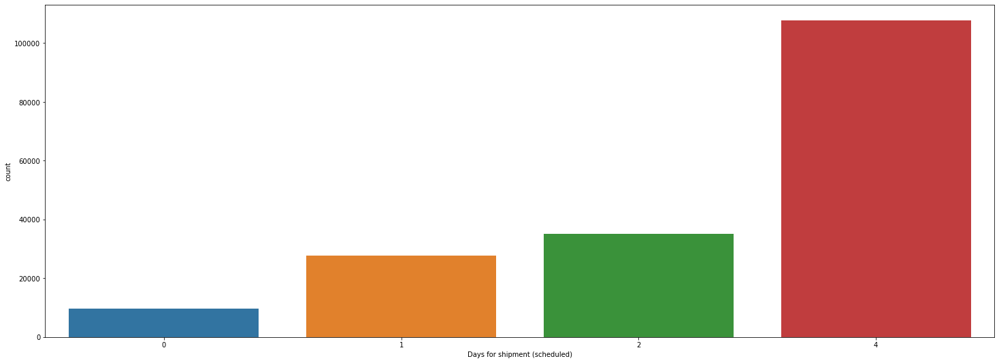

In [45]:
sns.countplot(data['Days for shipment (scheduled)'])

* in most of cases pridicted shiping days are 4 and company only pridict 0,1,2 and 4 days

# Bi-Varient Analysis

In [46]:
tbl=pd.crosstab( data['Days for shipment (scheduled)'] ,target)

<AxesSubplot:xlabel='Days for shipment (scheduled)'>

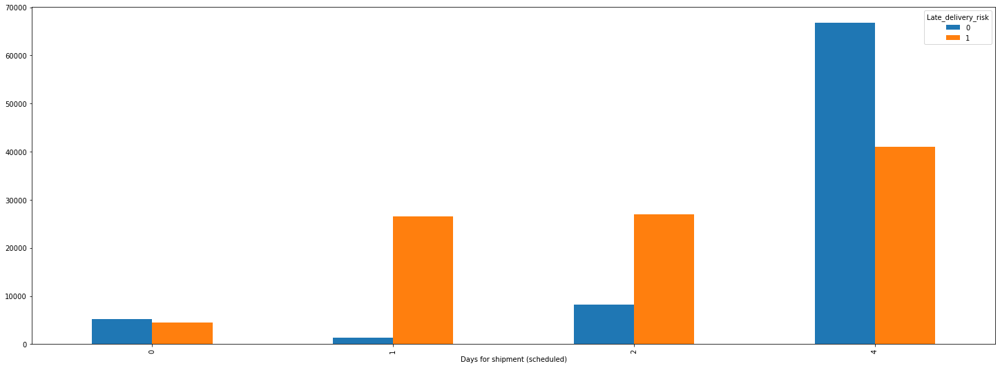

In [47]:
tbl.plot.bar()

In [48]:
#Statistical test:we,ll be applying chi2 contingency


c, p, dof, expected = chi2_contingency(tbl)
p

0.0

*Inference:It is statistically proven that "data['Days for shipment (scheduled)']" has effect on the target as p value is
    less than 0.05

In [49]:
significant_feature.loc[len(significant_feature.index)]=['Days for shipment (scheduled)','Days of scheduled shipping of the purchased','sheduled shipping day 1 or 2 are prone to delay','relevent according to chi2','shipping day sheduled  impact business']

In [50]:
significant_feature

,feature name,description,bivarient observation,statical test,business relevence
0,Type,Type of transaction made,diffrent type of transaction have diffrent del...,relevent according to chi_square,can not conclude
1,Days for shipping (real),Days of actual shipping of the purchased,orders having more shipping day are mostly del...,relevent according to chi2,more shipping day effect delay
2,Days for shipment (scheduled),Days of scheduled shipping of the purchased,sheduled shipping day 1 or 2 are prone to delay,relevent according to chi2,shipping day sheduled impact business


# feature 4:: 'Benefit per order'

In [51]:
data['Benefit per order'].head()

0     91.250000
1   -249.089996
2   -247.779999
3     22.860001
4    134.210007
Name: Benefit per order, dtype: float64

In [52]:
data['Benefit per order'].describe()

count    180519.000000
mean         21.974989
std         104.433526
min       -4274.979980
25%           7.000000
50%          31.520000
75%          64.800003
max         911.799988
Name: Benefit per order, dtype: float64

<AxesSubplot:xlabel='Benefit per order', ylabel='Density'>

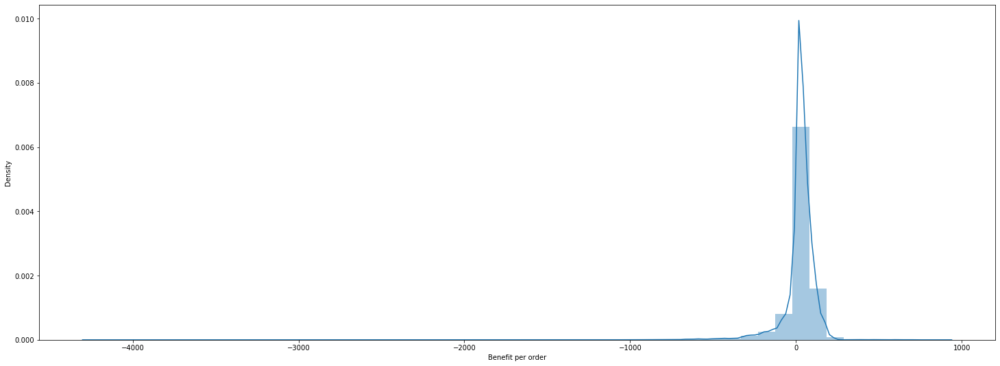

In [53]:
sns.distplot(data['Benefit per order']) # left skewed outliers are present

* lets refer to the data defination

In [54]:
data_dictionary.iloc[3,:]

FIELDS                    Benefit per order
DESCRIPTION    :  Earnings per order placed
Name: 3, dtype: object

* as we see from data defination this feature contain earning of each order placed by customers

* consist of positive and negetive entries may be profit and loss

In [55]:
data['Benefit per order'][data['Benefit per order']<0]

1         -249.089996
2         -247.779999
15        -259.579987
16        -246.360001
28         -17.139999
33         -97.339996
34        -425.579987
48         -30.750000
49        -122.730003
53         -21.750000
59        -184.779999
61          -3.650000
75        -285.070007
79         -26.690001
80        -117.330002
96         -23.629999
109       -140.000000
110        -32.599998
112        -11.810000
117        -79.190002
121        -18.809999
125       -783.669983
127       -269.970001
128        -22.500000
135       -239.860001
136       -155.899994
145        -50.580002
158       -277.670013
179        -13.580000
188       -284.529999
192        -24.820000
195        -76.370003
199        -12.990000
202         -2.190000
205       -266.790008
212       -145.130005
216       -459.000000
217       -248.000000
221       -261.440002
224        -76.669998
226        -82.010002
240         -6.170000
247       -184.259995
254        -29.379999
256       -105.779999
262       

*  we can conclude that 33784 obervation are negetive and rest are positive 

In [56]:
data['Benefit per order'][data['Benefit per order']<0].sum()

-3883547.345768667

In [57]:
data['Benefit per order'][data['Benefit per order']>0].sum()

7850450.319819024

* we have analyse that company suffer a suffcient amount of loss in many orders

In [58]:
data['Benefit per order'].min() # height loss suffered by factory on any order is of amount 4274 

-4274.97998

In [59]:
data['Benefit per order'].dtypes

dtype('float64')

<AxesSubplot:xlabel='Benefit per order'>

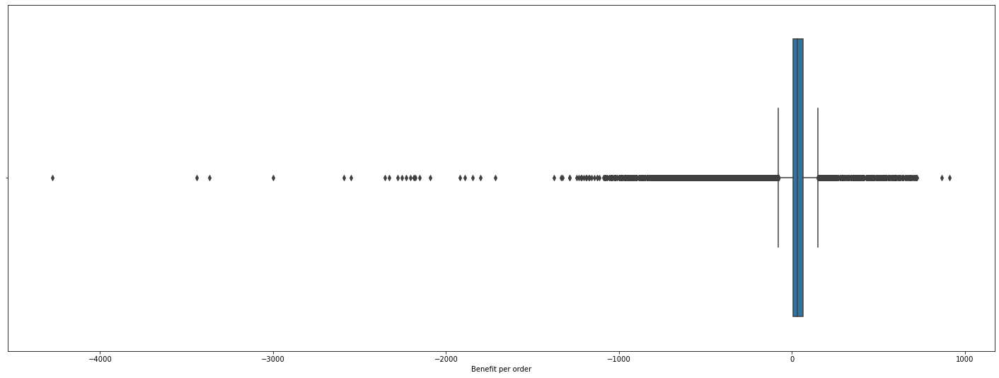

In [60]:
sns.boxplot(data['Benefit per order'])# huge amount of outliers on both side of central tendancy

# Bi Varient Analysis

<AxesSubplot:xlabel='Late_delivery_risk', ylabel='Benefit per order'>

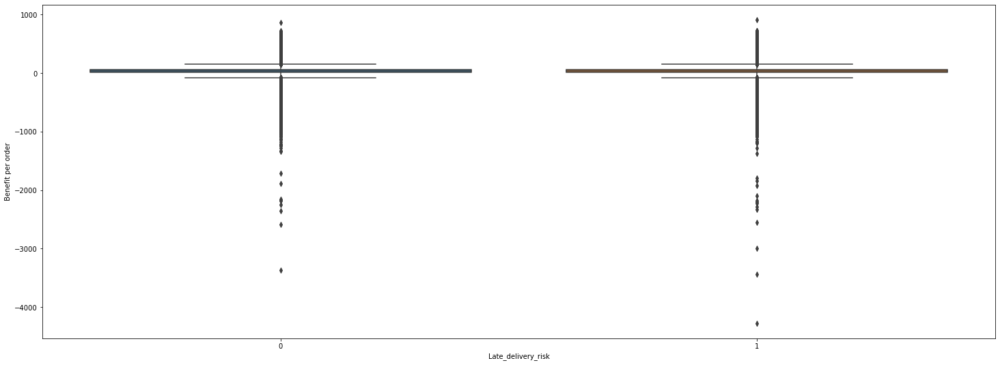

In [61]:
sns.boxplot(x=target,y =data['Benefit per order'] )

In [62]:
#Statistical test:we,ll be applying annova lm


model = sfa.ols("data['Benefit per order']~target",data=data).fit()
#annova table
print(anova_lm(model))

                df        sum_sq       mean_sq         F    PR(>F)
target         1.0  2.734754e+04  27347.540691  2.507506  0.113307
Residual  180517.0  1.968767e+09  10906.270222       NaN       NaN


* p values of benifit per order is almost 11 percent showing that benifit per order has insignificant
impact on target

In [63]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Benefit per order','Earnings per order placed','it displays positive and negative values','unrelevant according to anova_lm','no relevance on delay']

# feature 5:Sales per customer

In [64]:
data['Sales per customer'].head()

0    314.640015
1    311.359985
2    309.720001
3    304.809998
4    298.250000
Name: Sales per customer, dtype: float64

In [65]:
data['Sales per customer'].describe()

count    180519.000000
mean        183.107609
std         120.043670
min           7.490000
25%         104.379997
50%         163.990005
75%         247.399994
max        1939.989990
Name: Sales per customer, dtype: float64

In [66]:
data["Sales per customer"].describe()

count    180519.000000
mean        183.107609
std         120.043670
min           7.490000
25%         104.379997
50%         163.990005
75%         247.399994
max        1939.989990
Name: Sales per customer, dtype: float64

<AxesSubplot:xlabel='Sales per customer', ylabel='Density'>

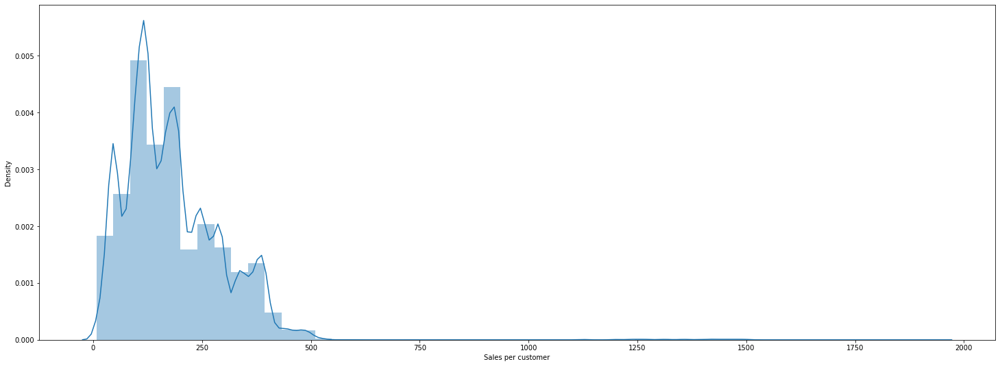

In [67]:
sns.distplot(data['Sales per customer'])# right skewed outliers are present

* lets refer to data dictionary

In [68]:
data_dictionary.iloc[4,:]

FIELDS                                    Sales per customer
DESCRIPTION    :  Total sales per customer made per customer
Name: 4, dtype: object

* as we see from data defination this feature contain total sale  of all order placed by per customers

In [69]:
data["Sales per customer"].min()

7.489999771

In [70]:
data["Sales per customer"].max()

1939.98999

<AxesSubplot:xlabel='Sales per customer'>

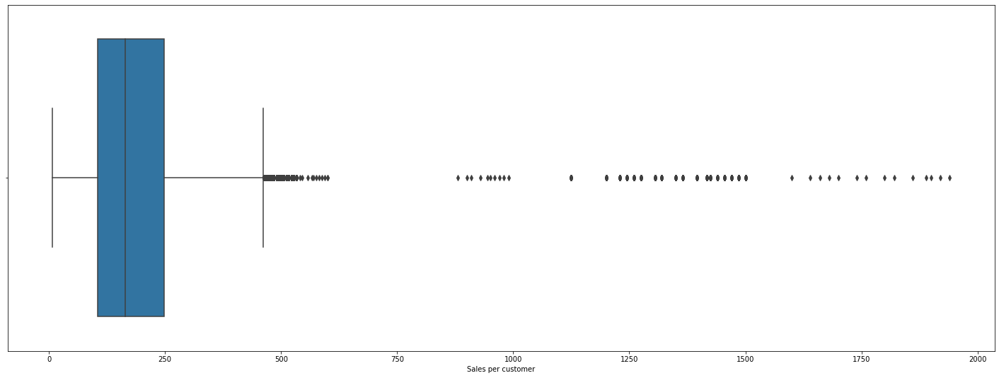

In [71]:
sns.boxplot(data['Sales per customer'])# huge amount of outliers are also present

# Bi_Varient Analysis

<AxesSubplot:xlabel='Late_delivery_risk', ylabel='Sales per customer'>

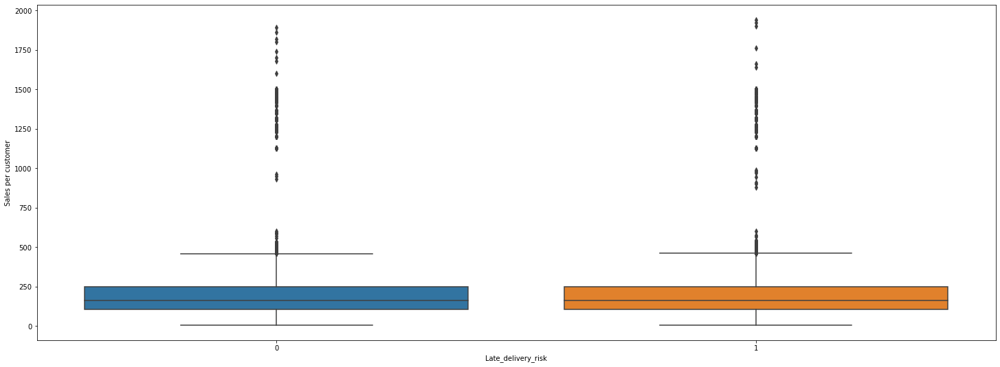

In [72]:
sns.boxplot(x=target,y =data['Sales per customer'] )

In [73]:
#Statistical test:we,ll be applying annova lm


model = sfa.ols("target~data['Sales per customer']",data=data).fit()
#annova table
print(anova_lm(model))

                                  df        sum_sq   mean_sq         F  \
data['Sales per customer']       1.0      0.642629  0.642629  2.594728   
Residual                    180517.0  44708.127827  0.247667       NaN   

                              PR(>F)  
data['Sales per customer']  0.107222  
Residual                         NaN  


* p values of sales per customer is almost 11 percent showing that benifit per order has insignificant
impact on target

In [74]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Sales per customer','Total sales per customer ','it displays uniform distribution','unrelevant according to anova_lm','no relevance on delay']

In [75]:
un_significant_feature

,feature name,description,bivarient observation,statical test,business relevence
0,Benefit per order,Earnings per order placed,it displays positive and negative values,unrelevant according to anova_lm,no relevance on delay
1,Sales per customer,Total sales per customer,it displays uniform distribution,unrelevant according to anova_lm,no relevance on delay


# feature 6 :: Delivery status

In [76]:
data_dictionary.iloc[5,:]

FIELDS                                           Delivery Status
DESCRIPTION    :  Delivery status of orders: Advance shipping...
Name: 5, dtype: object

* this feature consist of different delivery status of orders placed by customers

In [77]:
data['Delivery Status'].head()

0    Advance shipping
1       Late delivery
2    Shipping on time
3    Advance shipping
4    Advance shipping
Name: Delivery Status, dtype: object

In [78]:
data['Delivery Status'].describe()

count            180519
unique                4
top       Late delivery
freq              98977
Name: Delivery Status, dtype: object

* 4 unique delivery status with model of late delivery

In [79]:
data['Delivery Status'].value_counts().sort_values(ascending=False)

Late delivery        98977
Advance shipping     41592
Shipping on time     32196
Shipping canceled     7754
Name: Delivery Status, dtype: int64

In [80]:
data['Delivery Status'].value_counts([0]).sort_values(ascending=False)

Late delivery        0.548291
Advance shipping     0.230402
Shipping on time     0.178352
Shipping canceled    0.042954
Name: Delivery Status, dtype: float64

* almost 54 percent delivery are late from estimated time of delivery where as 23 percent delivery are advanced shiping

<AxesSubplot:xlabel='Delivery Status', ylabel='count'>

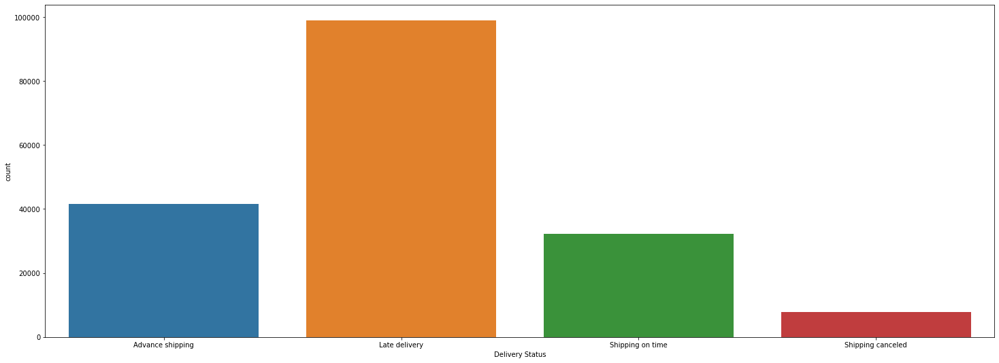

In [81]:
sns.countplot(data['Delivery Status'])

# Bi-Varient Analysis

<AxesSubplot:xlabel='Delivery Status'>

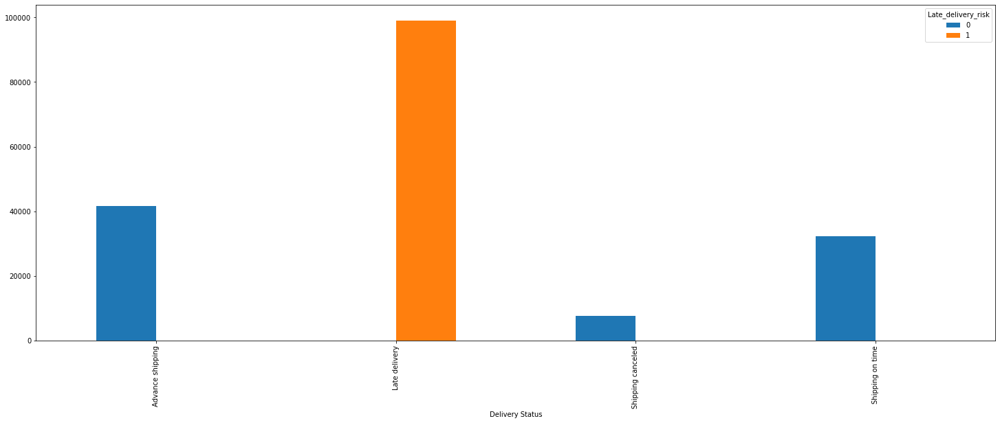

In [82]:
table=pd.crosstab(data['Delivery Status'],target)
table.plot(kind='bar')

In [83]:
# cat vs cat so we will go with chisquare
c, p, dof, expected = chi2_contingency(table)
p

0.0

* p value is 0 show that delivey status has good impact on late delivery

In [84]:
significant_feature.loc[len(significant_feature.index)]=['Delivery Status','Delivery status of orders','late delivery in Delivery Status have more late delivery risk','relevent according to chi2','Delivery Status have impact on business']

In [85]:
significant_feature

,feature name,description,bivarient observation,statical test,business relevence
0,Type,Type of transaction made,diffrent type of transaction have diffrent del...,relevent according to chi_square,can not conclude
1,Days for shipping (real),Days of actual shipping of the purchased,orders having more shipping day are mostly del...,relevent according to chi2,more shipping day effect delay
2,Days for shipment (scheduled),Days of scheduled shipping of the purchased,sheduled shipping day 1 or 2 are prone to delay,relevent according to chi2,shipping day sheduled impact business
3,Delivery Status,Delivery status of orders,late delivery in Delivery Status have more lat...,relevent according to chi2,Delivery Status have impact on business


# feature 7 :: Category Id

In [86]:
data_dictionary.iloc[7,:]

FIELDS                      Category Id
DESCRIPTION    :  Product category code
Name: 7, dtype: object

* as we seen from data dictionary it contain product category code 

In [87]:
data['Category Id'].unique()

array([73, 17, 29, 24, 13, 12,  9, 41, 37, 38, 44,  3, 18, 43, 65, 62, 64,
        4,  2, 26, 40, 76, 66, 70,  6, 11, 16, 36, 10, 63,  5, 60, 45, 59,
       67, 61, 68,  7, 72, 69, 71, 75, 35, 34, 33, 32, 31, 30, 74, 48, 46],
      dtype=int64)

* as we have notice this id contain unique product category id for different type of products

In [88]:
len(data['Category Id'].unique())# contain 51 unique values

51

In [89]:
data['Category Id'].value_counts().sort_values(ascending=False)

17    24551
18    22246
24    21035
46    19298
45    17325
48    15540
43    13729
9     12487
29    10984
37     2029
40     1780
36     1475
26     1201
13     1127
35     1070
41      974
75      838
63      652
76      650
3       632
7       614
62      592
74      529
33      524
72      492
68      484
66      484
67      483
64      442
32      441
44      440
71      434
65      431
12      423
59      405
38      384
69      362
73      357
5       343
6       328
11      309
30      283
61      271
70      208
60      207
31      181
2       138
10      111
16       68
4        67
34       61
Name: Category Id, dtype: int64

In [90]:
data['Category Id'].value_counts([0]).sort_values(ascending=False)

17    0.136002
18    0.123234
24    0.116525
46    0.106903
45    0.095973
48    0.086085
43    0.076053
9     0.069173
29    0.060847
37    0.011240
40    0.009860
36    0.008171
26    0.006653
13    0.006243
35    0.005927
41    0.005396
75    0.004642
63    0.003612
76    0.003601
3     0.003501
7     0.003401
62    0.003279
74    0.002930
33    0.002903
72    0.002725
68    0.002681
66    0.002681
67    0.002676
64    0.002448
32    0.002443
44    0.002437
71    0.002404
65    0.002388
12    0.002343
59    0.002244
38    0.002127
69    0.002005
73    0.001978
5     0.001900
6     0.001817
11    0.001712
30    0.001568
61    0.001501
70    0.001152
60    0.001147
31    0.001003
2     0.000764
10    0.000615
16    0.000377
4     0.000371
34    0.000338
Name: Category Id, dtype: float64

* product id 24,18,17,46 are best seller among all where as 16,4,34 are least seller

<AxesSubplot:xlabel='Category Id', ylabel='count'>

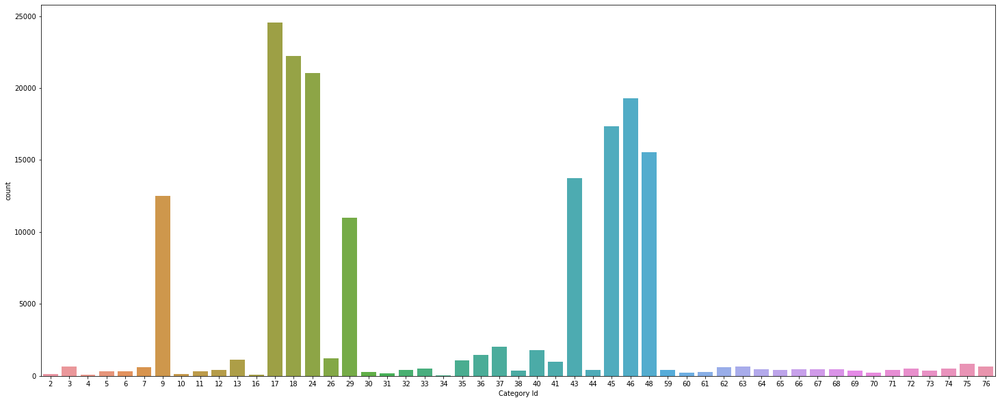

In [91]:
plt.figure(figsize=[25,10])
sns.countplot(data['Category Id'])

In [92]:
data['Category Id'].dtypes

dtype('int64')

# Bi-Varient Analysis

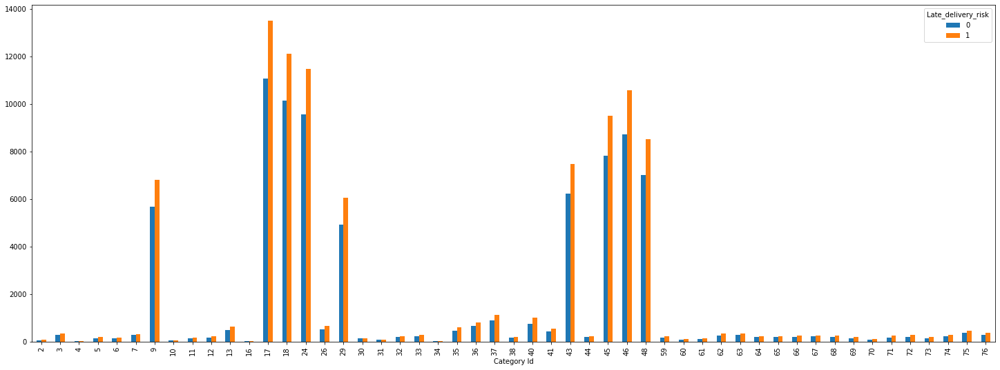

In [93]:
table=pd.crosstab(data['Category Id'],target)
bar=table.plot(kind='bar')
plt.show()

In [94]:
table

Late_delivery_risk,0,1
Category Id,,
2,63,75
3,283,349
4,30,37
5,137,206
6,145,183
7,285,329
9,5682,6805
10,47,64
11,133,176


* statical test to check signficance

In [95]:
c, p, dof, expected = chi2_contingency(table)
p

0.7468284823123976

* here p value is high i.e 74 percent showing that we accept Ho taht is two feature are independent

In [96]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Customer Id','Product category code','it displays uniform distribution','unrelevant according to chi2','no relevance ']

In [97]:
un_significant_feature

,feature name,description,bivarient observation,statical test,business relevence
0,Benefit per order,Earnings per order placed,it displays positive and negative values,unrelevant according to anova_lm,no relevance on delay
1,Sales per customer,Total sales per customer,it displays uniform distribution,unrelevant according to anova_lm,no relevance on delay
2,Customer Id,Product category code,it displays uniform distribution,unrelevant according to chi2,no relevance


# Feature 8::Category Name

In [98]:
data_dictionary.iloc[8,:]

FIELDS                                  Category Name
DESCRIPTION    :  Description of the product category
Name: 8, dtype: object

* this feature contain description of all product categories

In [99]:
data['Category Name'].unique()

array(['Sporting Goods', 'Cleats', 'Shop By Sport', "Women's Apparel",
       'Electronics', 'Boxing & MMA', 'Cardio Equipment', 'Trade-In',
       "Kids' Golf Clubs", 'Hunting & Shooting', 'Baseball & Softball',
       "Men's Footwear", 'Camping & Hiking', 'Consumer Electronics',
       'Cameras ', 'Computers', 'Basketball', 'Soccer', "Girls' Apparel",
       'Accessories', "Women's Clothing", 'Crafts', "Men's Clothing",
       'Tennis & Racquet', 'Fitness Accessories', 'As Seen on  TV!',
       'Golf Balls', 'Strength Training', "Children's Clothing",
       'Lacrosse', 'Baby ', 'Fishing', 'Books ', 'DVDs', 'CDs ', 'Garden',
       'Hockey', 'Pet Supplies', 'Health and Beauty', 'Music',
       'Video Games', 'Golf Gloves', 'Golf Bags & Carts', 'Golf Shoes',
       'Golf Apparel', "Women's Golf Clubs", "Men's Golf Clubs", 'Toys',
       'Water Sports', 'Indoor/Outdoor Games'], dtype=object)

In [100]:
len(data['Category Name'].unique())

50

* almost equal number of observation as compare to the customer id

In [101]:
data['Category Name'].value_counts().sort_values(ascending=False)

Cleats                  24551
Men's Footwear          22246
Women's Apparel         21035
Indoor/Outdoor Games    19298
Fishing                 17325
Water Sports            15540
Camping & Hiking        13729
Cardio Equipment        12487
Shop By Sport           10984
Electronics              3156
Accessories              1780
Golf Balls               1475
Girls' Apparel           1201
Golf Gloves              1070
Trade-In                  974
Video Games               838
Children's Clothing       652
Women's Clothing          650
Baseball & Softball       632
Hockey                    614
Cameras                   592
Toys                      529
Golf Shoes                524
Pet Supplies              492
Crafts                    484
Garden                    484
DVDs                      483
Computers                 442
Golf Apparel              441
Hunting & Shooting        440
Music                     434
Consumer Electronics      431
Boxing & MMA              423
Books     

In [102]:
data['Category Name'].value_counts([0]).sort_values(ascending=False)

Cleats                  0.136002
Men's Footwear          0.123234
Women's Apparel         0.116525
Indoor/Outdoor Games    0.106903
Fishing                 0.095973
Water Sports            0.086085
Camping & Hiking        0.076053
Cardio Equipment        0.069173
Shop By Sport           0.060847
Electronics             0.017483
Accessories             0.009860
Golf Balls              0.008171
Girls' Apparel          0.006653
Golf Gloves             0.005927
Trade-In                0.005396
Video Games             0.004642
Children's Clothing     0.003612
Women's Clothing        0.003601
Baseball & Softball     0.003501
Hockey                  0.003401
Cameras                 0.003279
Toys                    0.002930
Golf Shoes              0.002903
Pet Supplies            0.002725
Crafts                  0.002681
Garden                  0.002681
DVDs                    0.002676
Computers               0.002448
Golf Apparel            0.002443
Hunting & Shooting      0.002437
Music     

* contain exactly same info as category id

# Bi-Varient Analysis

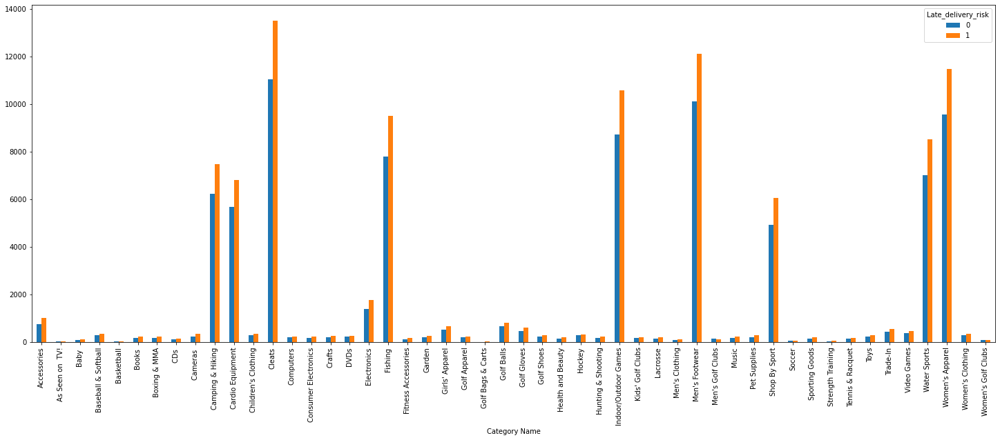

In [103]:
table=pd.crosstab(data['Category Name'],target)
bar=table.plot(kind='bar')
plt.show()

* statical test to check signficance

In [104]:
c, p, dof, expected = chi2_contingency(table)
p

0.7179808169070767

* here p value is high i.e 71 percent showing that we accept Ho taht is two feature are independent

In [105]:
data.drop(['Category Name'],axis=1,inplace=True)

In [106]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Category Name','Description of the product category','it displays uniform distribution','unrelevant according to chi2','no relevance ']

In [107]:
un_significant_feature

,feature name,description,bivarient observation,statical test,business relevence
0,Benefit per order,Earnings per order placed,it displays positive and negative values,unrelevant according to anova_lm,no relevance on delay
1,Sales per customer,Total sales per customer,it displays uniform distribution,unrelevant according to anova_lm,no relevance on delay
2,Customer Id,Product category code,it displays uniform distribution,unrelevant according to chi2,no relevance
3,Category Name,Description of the product category,it displays uniform distribution,unrelevant according to chi2,no relevance


# Feature ::9 Customer City

In [108]:
data_dictionary.iloc[9,:]

FIELDS                                        Customer City
DESCRIPTION    :  City where the customer made the purchase
Name: 9, dtype: object

* this feature contain info of city where customer made purchase

In [109]:
data['Customer City'].unique()

array(['Caguas', 'San Jose', 'Los Angeles', 'Tonawanda', 'Miami',
       'San Ramon', 'Freeport', 'Salinas', 'Peabody', 'Canovanas',
       'Paramount', 'Mount Prospect', 'Long Beach', 'Rancho Cordova',
       'Billings', 'Wilkes Barre', 'Roseville', 'Bellflower', 'Wheaton',
       'Detroit', 'Dallas', 'Carlisle', 'Newark', 'Panorama City',
       'Atlanta', 'Fremont', 'Rochester', 'Bayamon', 'Guayama',
       'Juana Diaz', 'Fort Washington', 'Bakersfield', 'Corona',
       'Cincinnati', 'Germantown', 'Carrollton', 'Houston', 'Ewa Beach',
       'Lakewood', 'Rome', 'Vista', 'Fort Worth', 'Fond Du Lac',
       'Philadelphia', 'Ontario', 'Oviedo', 'Buffalo', 'Honolulu',
       'Oceanside', 'North Tonawanda', 'Clovis', 'Jamaica',
       'Granite City', 'Medford', 'Pomona', 'Tempe', 'Santa Ana', 'York',
       'Aurora', 'Simi Valley', 'Silver Spring', 'Saint Paul',
       'San Antonio', 'Bronx', 'Greenville', 'Morristown', 'San Diego',
       'Oxnard', 'Albuquerque', 'Amarillo', 'Lutz', 'B

In [110]:
len(data['Customer City'].unique())

563

* 563 differnt cities where customer placed the order

In [111]:
data['Customer City'].value_counts().sort_values(ascending=False)

Caguas                  66770
Chicago                  3885
Los Angeles              3417
Brooklyn                 3412
New York                 1816
Philadelphia             1577
Bronx                    1500
San Diego                1437
Miami                    1314
Houston                  1297
Las Vegas                1164
Dallas                   1029
Aurora                   1015
Detroit                   958
Phoenix                   945
San Jose                  943
Cleveland                 784
Lancaster                 762
San Antonio               730
Memphis                   707
Virginia Beach            691
El Paso                   649
Fort Lauderdale           646
Columbus                  642
Washington                627
Honolulu                  609
Tucson                    582
Bakersfield               581
Baltimore                 565
Albuquerque               552
Long Beach                546
Newark                    544
Saint Paul                541
Pompano Be

In [112]:
data['Customer City'].value_counts([0]).sort_values(ascending=False)

Caguas                  0.369878
Chicago                 0.021521
Los Angeles             0.018929
Brooklyn                0.018901
New York                0.010060
Philadelphia            0.008736
Bronx                   0.008309
San Diego               0.007960
Miami                   0.007279
Houston                 0.007185
Las Vegas               0.006448
Dallas                  0.005700
Aurora                  0.005623
Detroit                 0.005307
Phoenix                 0.005235
San Jose                0.005224
Cleveland               0.004343
Lancaster               0.004221
San Antonio             0.004044
Memphis                 0.003916
Virginia Beach          0.003828
El Paso                 0.003595
Fort Lauderdale         0.003579
Columbus                0.003556
Washington              0.003473
Honolulu                0.003374
Tucson                  0.003224
Bakersfield             0.003218
Baltimore               0.003130
Albuquerque             0.003058
Long Beach

* some cities have good amount of orders where as some have neglegible amount of orders

# Bi-Varient Analysis

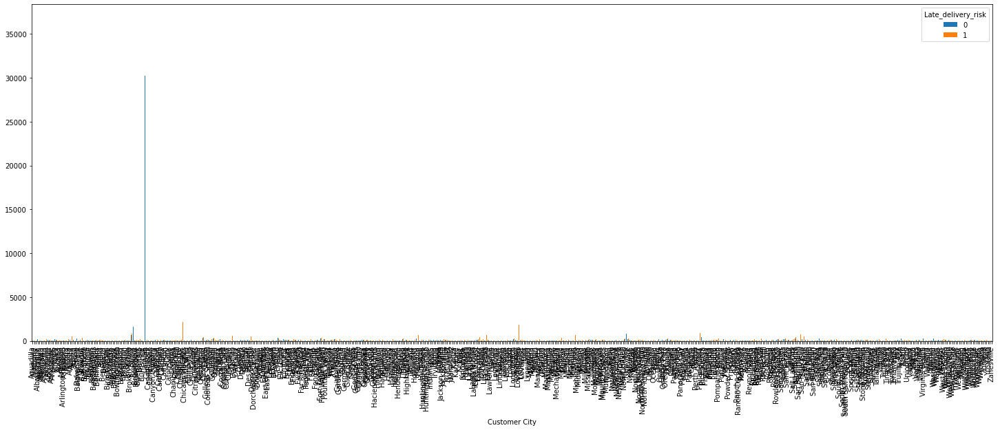

In [113]:
table=pd.crosstab(data['Customer City'],target)
bar=table.plot(kind='bar')
plt.show()

* due to 563 diffrent  cities we can not able to  visualise 

* statitical test of independency

In [114]:
c, p, dof, expected = chi2_contingency(table)
p

1.727279395129362e-141

* here p value is less  then 5 percent i.e almost 0 percent showing that we reject Ho that is two feature are independent

In [115]:
# step just for practice
mapp=data['Customer City'].value_counts()
data['Customer City']=data['Customer City'].apply(lambda x : mapp[x])

In [116]:
significant_feature.loc[len(significant_feature.index)]=['Customer City','City where the customer made the purchase','cannot  conclude from visuals','relevent according to chi2','Customer City impact on business']

In [117]:
significant_feature

,feature name,description,bivarient observation,statical test,business relevence
0,Type,Type of transaction made,diffrent type of transaction have diffrent del...,relevent according to chi_square,can not conclude
1,Days for shipping (real),Days of actual shipping of the purchased,orders having more shipping day are mostly del...,relevent according to chi2,more shipping day effect delay
2,Days for shipment (scheduled),Days of scheduled shipping of the purchased,sheduled shipping day 1 or 2 are prone to delay,relevent according to chi2,shipping day sheduled impact business
3,Delivery Status,Delivery status of orders,late delivery in Delivery Status have more lat...,relevent according to chi2,Delivery Status have impact on business
4,Customer City,City where the customer made the purchase,cannot conclude from visuals,relevent according to chi2,Customer City impact on business


# Feature 10 :: Customer Country

In [118]:
data_dictionary.iloc[10,:]

FIELDS                                        Customer Country
DESCRIPTION    :  Country where the customer made the purchase
Name: 10, dtype: object

* this feature contain information of the Country where the customer made the purchase

In [119]:
data['Customer Country'].unique()

array(['Puerto Rico', 'EE. UU.'], dtype=object)

In [120]:
len(data['Customer Country'].unique())

2

In [121]:
data['Customer Country'].value_counts()

EE. UU.        111146
Puerto Rico     69373
Name: Customer Country, dtype: int64

In [122]:
data['Customer Country'].value_counts([0])

EE. UU.        0.615703
Puerto Rico    0.384297
Name: Customer Country, dtype: float64

 * contain only two categories showing that the target customer for our company belong to only two countries

* country eeuu have 61 percent of total orders where as second country have remaining orders

# Bi-Varient Analysis

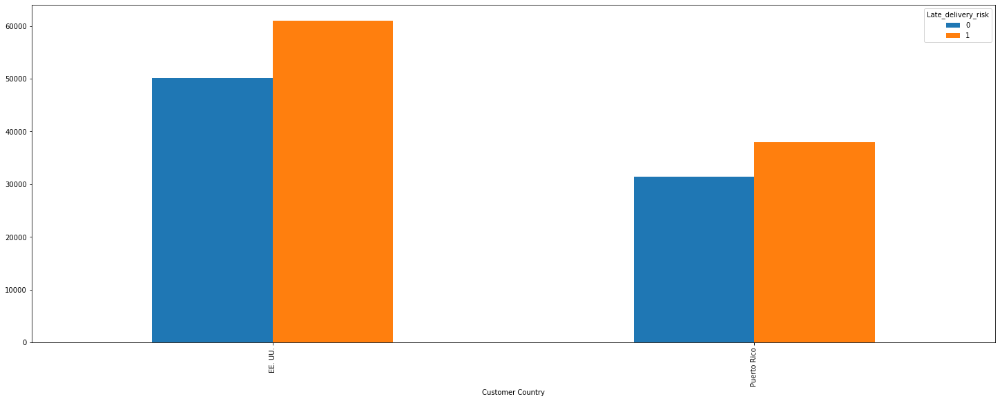

In [123]:
table=pd.crosstab(data['Customer Country'],target)
bar=table.plot(kind='bar')
plt.show()

* statitical test of independency

In [124]:
c, p, dof, expected = chi2_contingency(table)
p

0.660935525163501

* here p value is high i.e 64 percent showing that we accept Ho that is two feature are independent

In [125]:
# just for practice
data.drop(['Customer Country'],axis=1,inplace=True)

In [126]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Customer Country','Country where the customer made the purchase','it displays uniform distribution','unrelevant according to chi2','may impact delay']

In [127]:
un_significant_feature

,feature name,description,bivarient observation,statical test,business relevence
0,Benefit per order,Earnings per order placed,it displays positive and negative values,unrelevant according to anova_lm,no relevance on delay
1,Sales per customer,Total sales per customer,it displays uniform distribution,unrelevant according to anova_lm,no relevance on delay
2,Customer Id,Product category code,it displays uniform distribution,unrelevant according to chi2,no relevance
3,Category Name,Description of the product category,it displays uniform distribution,unrelevant according to chi2,no relevance
4,Customer Country,Country where the customer made the purchase,it displays uniform distribution,unrelevant according to chi2,may impact delay


# Feature 11:: customer email

In [128]:
data_dictionary.iloc[11,:]

FIELDS              Customer Email
DESCRIPTION    :  Customer's email
Name: 11, dtype: object

* this feature contain email adresss of all the customers who placed the order

In [129]:
data['Customer Email'].unique()

array(['XXXXXXXXX'], dtype=object)

* contain onlyy XXXX for each observation so we cannot find any interference from it so we have to dro it

In [130]:
data.drop('Customer Email',axis=1,inplace=True)

In [131]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Customer Email','Email of customers','contain only  XXXX for each observation','not applicable','not applicable']

In [132]:
un_significant_feature

,feature name,description,bivarient observation,statical test,business relevence
0,Benefit per order,Earnings per order placed,it displays positive and negative values,unrelevant according to anova_lm,no relevance on delay
1,Sales per customer,Total sales per customer,it displays uniform distribution,unrelevant according to anova_lm,no relevance on delay
2,Customer Id,Product category code,it displays uniform distribution,unrelevant according to chi2,no relevance
3,Category Name,Description of the product category,it displays uniform distribution,unrelevant according to chi2,no relevance
4,Customer Country,Country where the customer made the purchase,it displays uniform distribution,unrelevant according to chi2,may impact delay
5,Customer Email,Email of customers,contain only XXXX for each observation,not applicable,not applicable


# Feature 12::Customer F name

In [133]:
data_dictionary.iloc[12,:]

FIELDS           Customer Fname
DESCRIPTION    :  Customer name
Name: 12, dtype: object

* this feature contain info about the first name of all the customers

In [134]:
len(data['Customer Fname'].unique()) # contain only 782 unique values we will see what can we do from it

782

# Bi_varient Analysis

* as this feature has  782 unique values it it not possible to plot

In [135]:
mapp=data['Customer Fname'].value_counts()
data['Customer Fname']=data['Customer Fname'].apply(lambda x : mapp[x])

In [136]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Customer Fname','First name of customers','contain unique first name','not applicable','not applicable']

In [137]:
un_significant_feature

,feature name,description,bivarient observation,statical test,business relevence
0,Benefit per order,Earnings per order placed,it displays positive and negative values,unrelevant according to anova_lm,no relevance on delay
1,Sales per customer,Total sales per customer,it displays uniform distribution,unrelevant according to anova_lm,no relevance on delay
2,Customer Id,Product category code,it displays uniform distribution,unrelevant according to chi2,no relevance
3,Category Name,Description of the product category,it displays uniform distribution,unrelevant according to chi2,no relevance
4,Customer Country,Country where the customer made the purchase,it displays uniform distribution,unrelevant according to chi2,may impact delay
5,Customer Email,Email of customers,contain only XXXX for each observation,not applicable,not applicable
6,Customer Fname,First name of customers,contain unique first name,not applicable,not applicable


# feature ::13 Customer Id

In [138]:
data_dictionary.iloc[13,:]

FIELDS            Customer Id
DESCRIPTION    :  Customer ID
Name: 13, dtype: object

* this feature contain customer id for each customer visit to this company for oreder

In [139]:
len(data['Customer Id'].unique())#contain 20000 unique values we have to drop it as we cannot takeany inference from it

20652

* we will extract the usefull info from this info and later on we will drop it

In [140]:
data['Customer Id'].describe()

count    180519.000000
mean       6691.379495
std        4162.918106
min           1.000000
25%        3258.500000
50%        6457.000000
75%        9779.000000
max       20757.000000
Name: Customer Id, dtype: float64

# Bi-Varient

* lets treat it as nuerical column and see significance on target

<AxesSubplot:xlabel='Late_delivery_risk', ylabel='Customer Id'>

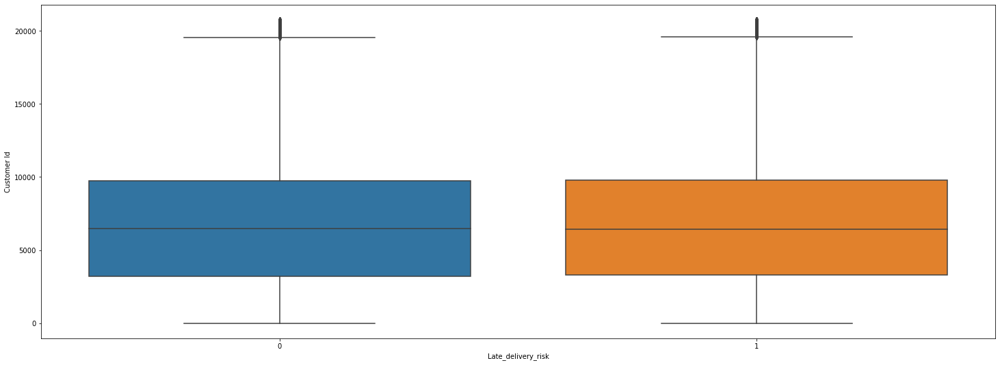

In [141]:
sns.boxplot(x=target,y =data['Customer Id'] )

* statical test to see significance

In [142]:
model = sfa.ols("data['Customer Id']~target",data=data).fit()
#annova table
print(anova_lm(model))

                df        sum_sq       mean_sq         F    PR(>F)
target         1.0  6.893530e+06  6.893530e+06  0.397781  0.528238
Residual  180517.0  3.128350e+12  1.732994e+07       NaN       NaN


* here p value is high i.e 52 percent showing that we accept Ho that is two feature are independent

In [143]:
data.drop(['Customer Id'],axis=1,inplace=True)

In [144]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Customer Id','Id of customers','contain unique customer id','no relevance according to anova_lm','no relevance']

In [145]:
un_significant_feature


,feature name,description,bivarient observation,statical test,business relevence
0,Benefit per order,Earnings per order placed,it displays positive and negative values,unrelevant according to anova_lm,no relevance on delay
1,Sales per customer,Total sales per customer,it displays uniform distribution,unrelevant according to anova_lm,no relevance on delay
2,Customer Id,Product category code,it displays uniform distribution,unrelevant according to chi2,no relevance
3,Category Name,Description of the product category,it displays uniform distribution,unrelevant according to chi2,no relevance
4,Customer Country,Country where the customer made the purchase,it displays uniform distribution,unrelevant according to chi2,may impact delay
5,Customer Email,Email of customers,contain only XXXX for each observation,not applicable,not applicable
6,Customer Fname,First name of customers,contain unique first name,not applicable,not applicable
7,Customer Id,Id of customers,contain unique customer id,no relevance according to anova_lm,no relevance


In [146]:
significant_feature

,feature name,description,bivarient observation,statical test,business relevence
0,Type,Type of transaction made,diffrent type of transaction have diffrent del...,relevent according to chi_square,can not conclude
1,Days for shipping (real),Days of actual shipping of the purchased,orders having more shipping day are mostly del...,relevent according to chi2,more shipping day effect delay
2,Days for shipment (scheduled),Days of scheduled shipping of the purchased,sheduled shipping day 1 or 2 are prone to delay,relevent according to chi2,shipping day sheduled impact business
3,Delivery Status,Delivery status of orders,late delivery in Delivery Status have more lat...,relevent according to chi2,Delivery Status have impact on business
4,Customer City,City where the customer made the purchase,cannot conclude from visuals,relevent according to chi2,Customer City impact on business


# Feature 14::Customer L name

In [147]:
data_dictionary.iloc[14,:]

FIELDS               Customer Lname
DESCRIPTION    :  Customer lastname
Name: 14, dtype: object

* this feature contain info about the last name of all the customers

In [148]:
len(data['Customer Lname'].unique()) # contain only 1110 unique values we will see what can we do from it

1110

* we will try to extract the info which we can in future from this feature

# Bi-Varient Analysis

* as this feature has 1110 unique values it it not possible to plot


* statatical test of independecy

In [149]:
table=pd.crosstab(data['Customer Lname'],target)

In [150]:
c, p, dof, expected = chi2_contingency(table)
p

3.5289542430375076e-256

* it looks like significant according to statical test we will see how to use it

In [151]:
significant_feature.loc[len(significant_feature.index)]=['Customer Lname','Customer lastname','Cannot be able to visualize due to many unique values','relevent according to chi_square','we will try to extract some information']

In [152]:
significant_feature

,feature name,description,bivarient observation,statical test,business relevence
0,Type,Type of transaction made,diffrent type of transaction have diffrent del...,relevent according to chi_square,can not conclude
1,Days for shipping (real),Days of actual shipping of the purchased,orders having more shipping day are mostly del...,relevent according to chi2,more shipping day effect delay
2,Days for shipment (scheduled),Days of scheduled shipping of the purchased,sheduled shipping day 1 or 2 are prone to delay,relevent according to chi2,shipping day sheduled impact business
3,Delivery Status,Delivery status of orders,late delivery in Delivery Status have more lat...,relevent according to chi2,Delivery Status have impact on business
4,Customer City,City where the customer made the purchase,cannot conclude from visuals,relevent according to chi2,Customer City impact on business
5,Customer Lname,Customer lastname,Cannot be able to visualize due to many unique...,relevent according to chi_square,we will try to extract some information


In [153]:
un_significant_feature

,feature name,description,bivarient observation,statical test,business relevence
0,Benefit per order,Earnings per order placed,it displays positive and negative values,unrelevant according to anova_lm,no relevance on delay
1,Sales per customer,Total sales per customer,it displays uniform distribution,unrelevant according to anova_lm,no relevance on delay
2,Customer Id,Product category code,it displays uniform distribution,unrelevant according to chi2,no relevance
3,Category Name,Description of the product category,it displays uniform distribution,unrelevant according to chi2,no relevance
4,Customer Country,Country where the customer made the purchase,it displays uniform distribution,unrelevant according to chi2,may impact delay
5,Customer Email,Email of customers,contain only XXXX for each observation,not applicable,not applicable
6,Customer Fname,First name of customers,contain unique first name,not applicable,not applicable
7,Customer Id,Id of customers,contain unique customer id,no relevance according to anova_lm,no relevance


# feature 15:: customer password

In [154]:
data_dictionary.iloc[15,:]

FIELDS              Customer Password
DESCRIPTION    :  Masked customer key
Name: 15, dtype: object

* this feature contain masked customer key

In [155]:
data['Customer Password'].unique()

array(['XXXXXXXXX'], dtype=object)

* contain only XXX so we will drop it and move on to the next feature 

In [156]:
data.drop('Customer Password',axis=1,inplace=True)

In [157]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Customer Password','Masked customer key','contain only  XXXX for each observation','not applicable','not applicable']

# Feature 16::: Customer Segment

In [158]:
data_dictionary.iloc[16,:]

FIELDS                                          Customer Segment
DESCRIPTION    :  Types of Customers: Consumer , Corporate , ...
Name: 16, dtype: object

* this feature contain information of diffrent segment of the customers

In [159]:
data['Customer Segment'].unique()

array(['Consumer', 'Home Office', 'Corporate'], dtype=object)

In [160]:
data['Customer Segment'].value_counts()

Consumer       93504
Corporate      54789
Home Office    32226
Name: Customer Segment, dtype: int64

In [161]:
data['Customer Segment'].value_counts([0])

Consumer       0.517973
Corporate      0.303508
Home Office    0.178519
Name: Customer Segment, dtype: float64

* there are 3 segment of customers out of which 51 percent of orders are placed by consumer segment

<AxesSubplot:xlabel='Customer Segment', ylabel='count'>

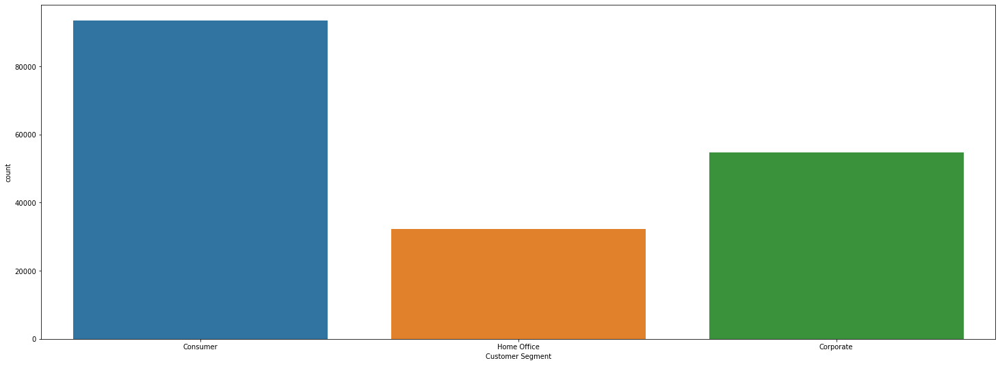

In [162]:
sns.countplot(data['Customer Segment'])

# Bi-Varient Analysis

<AxesSubplot:xlabel='Customer Segment'>

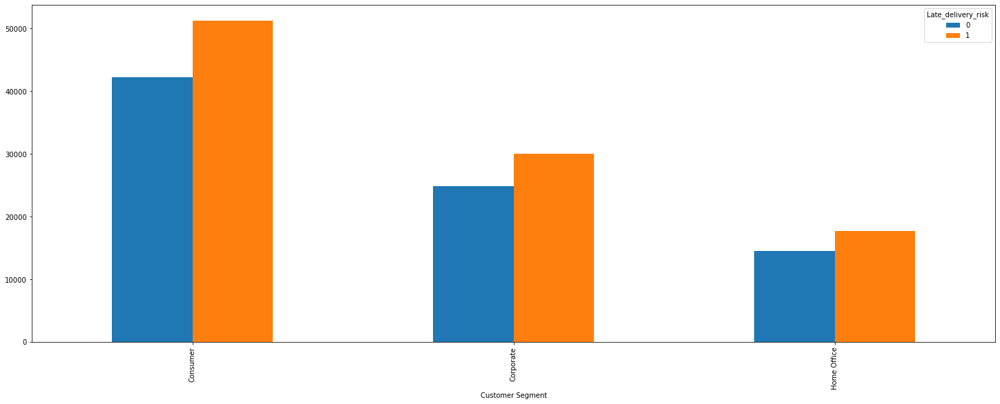

In [163]:
table=pd.crosstab(data['Customer Segment'],target)
table.plot(kind='bar')

* statatical test of independecy

In [164]:
c, p, dof, expected = chi2_contingency(table)
p

0.5990740516327164

* here p value is high i.e 59 percent showing that we accept Ho that is two feature are independent

In [165]:
data.drop(['Customer Segment'],axis=1,inplace=True)

In [166]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Customer Segment','Types of Customers','Uniform distribution among all segments','Unsignificant according to chi-square','Customer segment not impact delay']

# feature 17:: Customer State

In [167]:
data_dictionary.iloc[17,:]

FIELDS                                            Customer State
DESCRIPTION    :  State to which the store where the purchase...
Name: 17, dtype: object

* this feature contain info of the  State to which the store belong where the order is placed


In [168]:
len(data['Customer State'].unique())

46

In [169]:
data['Customer State'].value_counts()

PR       69373
CA       29223
NY       11327
TX        9103
IL        7631
FL        5456
OH        4095
PA        3824
MI        3804
NJ        3191
AZ        3026
GA        2503
MD        2415
NC        1992
CO        1914
VA        1849
OR        1668
MA        1607
TN        1582
NV        1440
MO        1354
HI        1248
CT        1094
UT         968
NM         949
LA         948
WA         920
WI         850
MN         672
SC         665
IN         581
DC         579
KY         487
KS         458
DE         269
RI         243
WV         241
OK         232
ND         215
ID         167
AR         164
MT          87
IA          67
AL          35
95758        2
91732        1
Name: Customer State, dtype: int64

In [170]:
data['Customer State'].value_counts([0])

PR       0.384297
CA       0.161883
NY       0.062747
TX       0.050427
IL       0.042273
FL       0.030224
OH       0.022685
PA       0.021183
MI       0.021073
NJ       0.017677
AZ       0.016763
GA       0.013866
MD       0.013378
NC       0.011035
CO       0.010603
VA       0.010243
OR       0.009240
MA       0.008902
TN       0.008764
NV       0.007977
MO       0.007501
HI       0.006913
CT       0.006060
UT       0.005362
NM       0.005257
LA       0.005252
WA       0.005096
WI       0.004709
MN       0.003723
SC       0.003684
IN       0.003218
DC       0.003207
KY       0.002698
KS       0.002537
DE       0.001490
RI       0.001346
WV       0.001335
OK       0.001285
ND       0.001191
ID       0.000925
AR       0.000908
MT       0.000482
IA       0.000371
AL       0.000194
95758    0.000011
91732    0.000006
Name: Customer State, dtype: float64

* there are 46 diffrent state from where purchase happen out 
of which only one state is major performer whereas some has very few num of orders

<AxesSubplot:xlabel='Customer State', ylabel='count'>

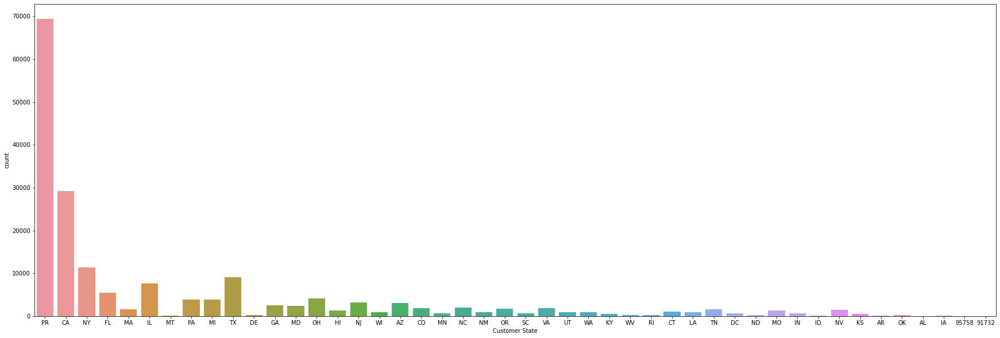

In [171]:
plt.figure(figsize=[30,10])
sns.countplot(data['Customer State'])

# Bi-Varient Analysis

<AxesSubplot:xlabel='Customer State'>

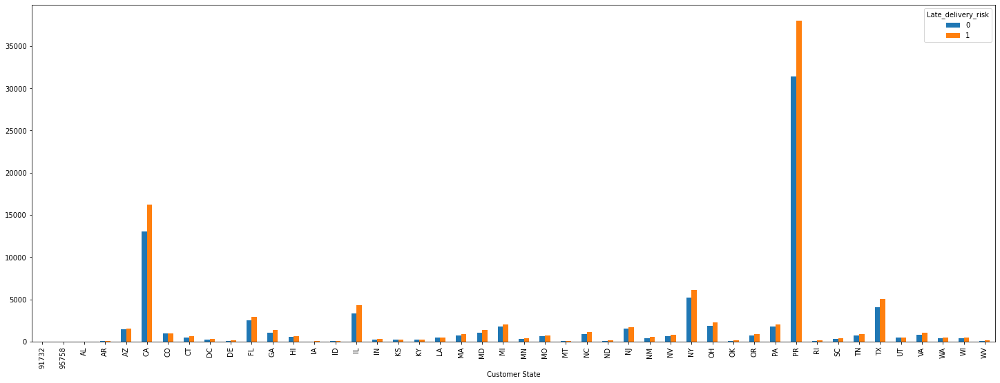

In [172]:
table=table=pd.crosstab(data['Customer State'],target)
table.plot(kind='bar')

* statatical test of independecy

In [173]:
c, p, dof, expected = chi2_contingency(table)
p

3.4110017608181488e-06

* p value is less then 5 percent showing we will reject the null hypothesis implies that two feature are independent

In [174]:
significant_feature.loc[len(significant_feature.index)]=['Customer State','State to which the store where the purchase','no uniform distribution','relevent according to chi_square','Customer State has  an impact on business']

# Feature 18:: Customer Street

In [175]:
data_dictionary.iloc[18,:]

FIELDS                                           Customer Street
DESCRIPTION    :  Street to which the store where the purchas...
Name: 18, dtype: object

* this feature contain information of Street to which the store where the purchase/order placed

In [176]:
len(data['Customer Street'].unique())

7458

In [177]:
data['Customer Street'].head()

0    5365 Noble Nectar Island
1            2679 Rustic Loop
2        8510 Round Bear Gate
3             3200 Amber Bend
4    8671 Iron Anchor Corners
Name: Customer Street, dtype: object

* contain large amount of categories we will colect the usefull info and after that will drop it

# Bi-Varient Analysis 

In [178]:
table=pd.crosstab(data['Customer Street'],target)


* since 7400 categories not possible to visiualise so lets check statically its significance

In [179]:
c, p, dof, expected = chi2_contingency(table)
p

0.0

* p value is less then 5 percent showing we will reject the null hypothesis implies that two feature are independent

In [180]:
mapp=data['Customer Street'].value_counts()
data['Customer Street']=data['Customer Street'].apply(lambda x : mapp[x])

In [181]:
significant_feature.loc[len(significant_feature.index)]=['Customer Street','Customer Street','Cannot be visualized due to many values','relevent according to chi_square','Customer Street has impact on business ']

# feature 19 ::zipcode

In [182]:
data_dictionary.iloc[19,:]

FIELDS            Customer Zipcode
DESCRIPTION    :  Customer Zipcode
Name: 19, dtype: object

* this feature contain info of the zipcode of the place where customer placed the order

In [183]:
len(data['Customer Zipcode'].unique())

996

In [184]:
data['Customer Zipcode'].value_counts()

725.0      66770
921.0        337
23455.0      334
957.0        297
79109.0      292
33324.0      283
80012.0      280
33624.0      261
92115.0      256
97701.0      254
92024.0      254
11226.0      253
33068.0      252
78040.0      252
44136.0      248
10031.0      246
91790.0      242
20783.0      241
27502.0      240
91306.0      236
77083.0      236
92833.0      235
78586.0      234
89103.0      228
63116.0      225
80631.0      224
48126.0      223
11236.0      222
8540.0       220
12550.0      219
91748.0      218
60643.0      218
17013.0      217
791.0        216
11520.0      214
6460.0       211
11218.0      209
44109.0      209
90024.0      209
92780.0      208
70117.0      208
94509.0      207
21218.0      207
93063.0      207
13760.0      206
14221.0      203
19104.0      203
96822.0      201
76106.0      200
45140.0      200
11219.0      199
49201.0      199
10467.0      199
67212.0      198
43230.0      198
93003.0      197
60617.0      197
92691.0      197
48205.0      1

In [185]:
data['Customer Zipcode'].value_counts([0])

725.0      0.369884
921.0      0.001867
23455.0    0.001850
957.0      0.001645
79109.0    0.001618
33324.0    0.001568
80012.0    0.001551
33624.0    0.001446
92115.0    0.001418
97701.0    0.001407
92024.0    0.001407
11226.0    0.001402
33068.0    0.001396
78040.0    0.001396
44136.0    0.001374
10031.0    0.001363
91790.0    0.001341
20783.0    0.001335
27502.0    0.001330
91306.0    0.001307
77083.0    0.001307
92833.0    0.001302
78586.0    0.001296
89103.0    0.001263
63116.0    0.001246
80631.0    0.001241
48126.0    0.001235
11236.0    0.001230
8540.0     0.001219
12550.0    0.001213
91748.0    0.001208
60643.0    0.001208
17013.0    0.001202
791.0      0.001197
11520.0    0.001185
6460.0     0.001169
11218.0    0.001158
44109.0    0.001158
90024.0    0.001158
92780.0    0.001152
70117.0    0.001152
94509.0    0.001147
21218.0    0.001147
93063.0    0.001147
13760.0    0.001141
14221.0    0.001125
19104.0    0.001125
96822.0    0.001113
76106.0    0.001108
45140.0    0.001108


* 995 unique zipcode out of which most used zipcode is 725 with 36 percent of total orders

# Bi-Varient Analysis

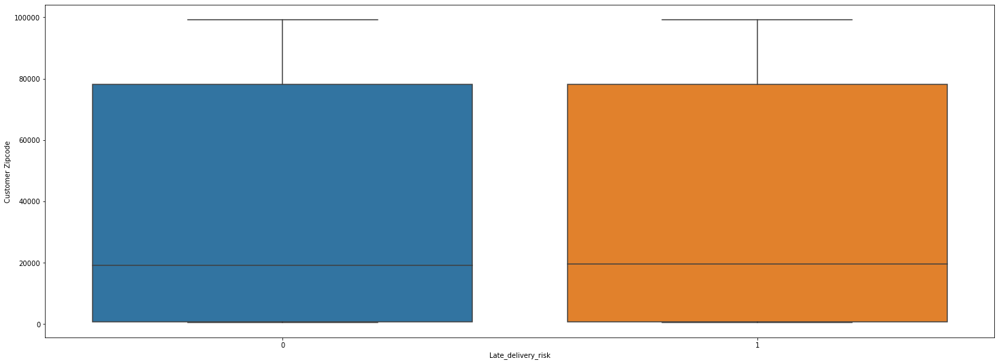

In [186]:
sns.boxplot(data['Late_delivery_risk'],data['Customer Zipcode'])
plt.show()

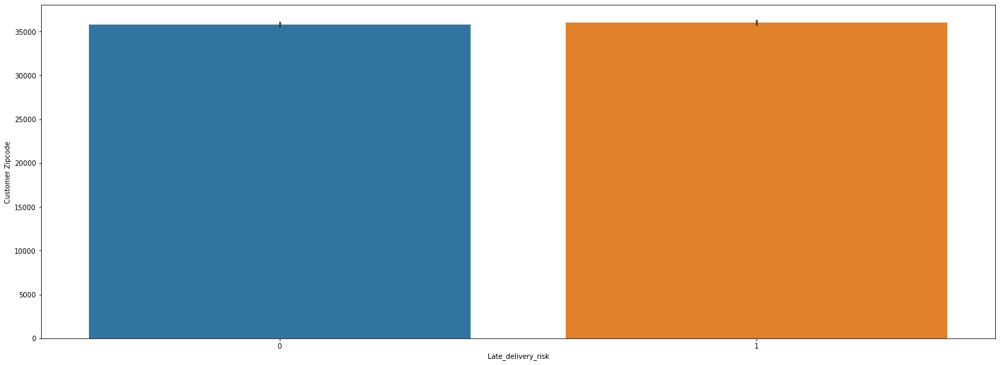

In [187]:
sns.barplot(data['Late_delivery_risk'],data['Customer Zipcode'])
plt.show()

*  Late Delivery Risk seems to have almost same distribution fot both the classes. 

* statical test of independency

In [188]:
model=sfa.ols("data['Customer Zipcode']~target",data=data).fit()
print(anova_lm(model))

                df        sum_sq       mean_sq        F  PR(>F)
target         1.0  2.520892e+09  2.520892e+09  1.78859  0.1811
Residual  180514.0  2.544219e+14  1.409430e+09      NaN     NaN


* Since the Pvalue is greater than 0.05 so we can conclude that Customer zipcode has no effect on Late Delivery Risk

In [189]:
data.drop(['Customer Zipcode'],axis=1,inplace=True)

In [190]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Zipcode','Customer Zipcode','contain many unique values','Significant according to annova test','customer zipcode may have relevance with order delay']

# feature 20::: Department Id

In [191]:
data_dictionary.iloc[20,:]

FIELDS                       Department Id
DESCRIPTION    :  Department code of store
Name: 20, dtype: object

* this feature contain info of the department code of the Store

In [192]:
data['Department Id'].unique()

array([ 2,  4,  5,  3,  6,  7, 10,  8,  9, 11, 12], dtype=int64)

In [193]:
data['Department Id'].value_counts()

7     66861
4     48998
5     33220
3     14525
6      9686
2      2479
9      2026
10     1465
11      492
8       405
12      362
Name: Department Id, dtype: int64

In [194]:
data['Department Id'].value_counts([0])

7     0.370382
4     0.271428
5     0.184025
3     0.080462
6     0.053656
2     0.013733
9     0.011223
10    0.008115
11    0.002725
8     0.002244
12    0.002005
Name: Department Id, dtype: float64

* stores have 11 diffrent deparments where max number of order lies in 7 num department

In [195]:
data['Department Id'].describe()

count    180519.000000
mean          5.443460
std           1.629246
min           2.000000
25%           4.000000
50%           5.000000
75%           7.000000
max          12.000000
Name: Department Id, dtype: float64

In [196]:
data['Department Id'].dtypes

dtype('int64')

In [197]:
data['Department Id']=data['Department Id'].astype('object')

<AxesSubplot:xlabel='Department Id', ylabel='count'>

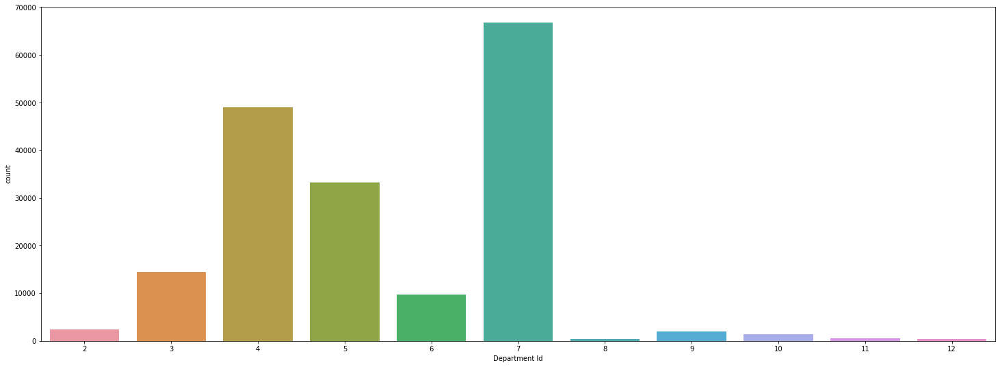

In [198]:
sns.countplot(data['Department Id'])

# Bi-Varient Analysis

<AxesSubplot:xlabel='Department Id'>

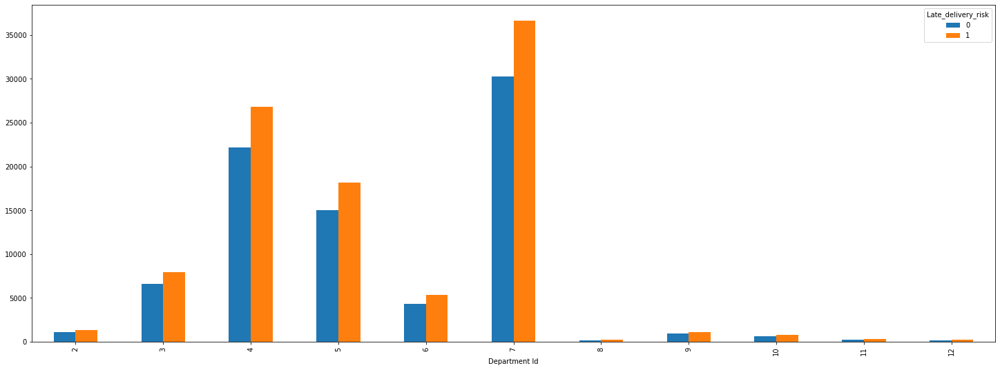

In [199]:
table=table=pd.crosstab(data['Department Id'],target)
table.plot(kind='bar')

* statical test of indepency

In [200]:
c, p, dof, expected = chi2_contingency(table)
p

0.7564916045517328

* Since the Pvalue is more than 0.05 so we can conclude that Department Id has no effect on Late Delivery Risk

In [201]:
data.drop(['Department Id'],axis=1,inplace=True)

In [202]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Department Id','Department code of store','Contain uniform distribution among all the departments','not significant according to chi-square','No effect on order delay']

# Feature 21 Department Name

In [203]:
data_dictionary.iloc[21,:]

FIELDS                     Department Name
DESCRIPTION    :  Department name of store
Name: 21, dtype: object

* this feature contain info about deparment name of stores

In [204]:
len(data['Department Name'].unique())

11

In [205]:
data['Department Name'].value_counts()

Fan Shop              66861
Apparel               48998
Golf                  33220
Footwear              14525
Outdoors               9686
Fitness                2479
Discs Shop             2026
Technology             1465
Pet Shop                492
Book Shop               405
Health and Beauty       362
Name: Department Name, dtype: int64

In [206]:
data['Department Name'].value_counts([0])

Fan Shop              0.370382
Apparel               0.271428
Golf                  0.184025
Footwear              0.080462
Outdoors              0.053656
Fitness               0.013733
Discs Shop            0.011223
Technology            0.008115
Pet Shop              0.002725
Book Shop             0.002244
Health and Beauty     0.002005
Name: Department Name, dtype: float64

* this feature contain 11 unique department names out of them 37 percent order belong to fan shop

<AxesSubplot:xlabel='Department Name', ylabel='count'>

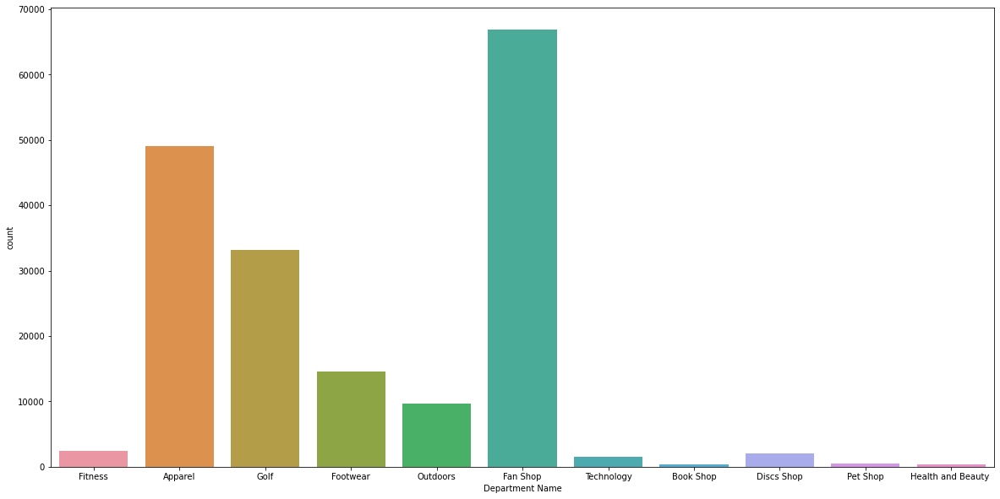

In [207]:
plt.figure(figsize=[20,10])
sns.countplot(data['Department Name'])

# Bi-Varient

<AxesSubplot:xlabel='Department Name'>

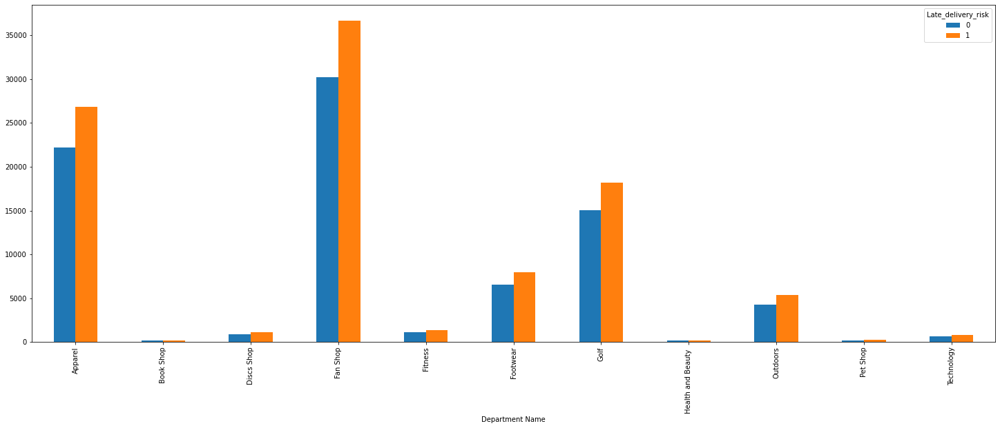

In [208]:
table=pd.crosstab(data['Department Name'],data['Late_delivery_risk'])
table.plot(kind='bar')

* Distribution of Late Delivery Risk seems to be same for both the classes
* People from Fan Shop has highest chance of Late Delivery Risk
* People from Technology has lowest chance of Late Delivery Risk

* statical test of indepedency

In [209]:
# Applying ChiSquare Contingency Test to check the effect of Department Name on Late Delivery Risk
teststats,pvalue,dof,exp_value=chi2_contingency(table)


In [210]:
print(pvalue)

0.7564916045517328


* Since the pvalue is greater than 0.05 so we conclude that Department Name has no effect no Late Delivery Risk

In [211]:
data.drop(['Department Name'],axis=1,inplace=True)

In [212]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Department Name','Department name of store','uniform distribution','no relevance according to chi2','Department Name has no effect on Delay']

# Feature 22 :: Latitude

In [213]:
data_dictionary.iloc[22,:]

FIELDS                                               Latitude
DESCRIPTION    :  Latitude corresponding to location of store
Name: 22, dtype: object

* this feature contain info about Latitude corresponding to location of store

In [214]:
len(data.Latitude.unique())  #

11250

In [215]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Latitude','Latitude corresponding to location of store','Cannot able to perform due to high unique values','not applicable','not applicable']

* we will drop the feature as it contain a huge amount of unique values and lattitude info which is not too much of use

# Feature 23 ::Longitude

In [216]:
data_dictionary.iloc[23,:]

FIELDS                                               Longitude
DESCRIPTION    :  Longitude corresponding to location of store
Name: 23, dtype: object

* this feature contain info of  Longitude corresponding to location of store

In [217]:
len(data.Longitude.unique())  #we will treat it same as longitude

4487

 * we will treat it same as longitude

* lets drop feature lattitude and longitude

In [218]:
data.drop(['Latitude','Longitude'],axis=1,inplace=True)

In [219]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Longitude','Longitude corresponding to location of store','Cannot able to perform due to high unique values','not applicable','not applicable']

# Feature 24 :: Market

In [220]:
data_dictionary.iloc[24,:]

FIELDS                                                    Market
DESCRIPTION    :  Market to where the order is delivered : Af...
Name: 24, dtype: object

* this feature contsin info of the Market to where the order is delivered

In [221]:
data['Market'].unique()

array(['Pacific Asia', 'USCA', 'Africa', 'Europe', 'LATAM'], dtype=object)

In [222]:
data['Market'].value_counts()

LATAM           51594
Europe          50252
Pacific Asia    41260
USCA            25799
Africa          11614
Name: Market, dtype: int64

In [223]:
data['Market'].value_counts([0])

LATAM           0.285809
Europe          0.278375
Pacific Asia    0.228563
USCA            0.142916
Africa          0.064337
Name: Market, dtype: float64

In [224]:
data['Market'].describe()

count     180519
unique         5
top        LATAM
freq       51594
Name: Market, dtype: object

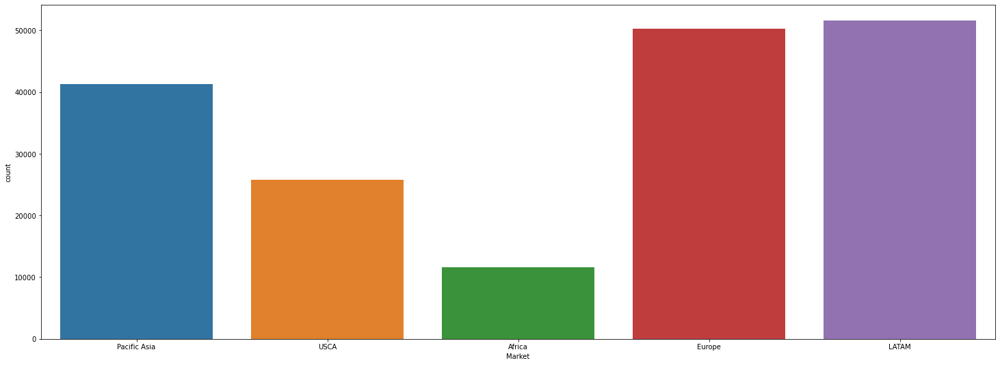

In [225]:
sns.countplot(data['Market'])
plt.show()

*  LATAM has the highest order in the market followed by Europe,Pacific Asia,USCA and Africa

# Bi-Varient Analysis

<AxesSubplot:xlabel='Market'>

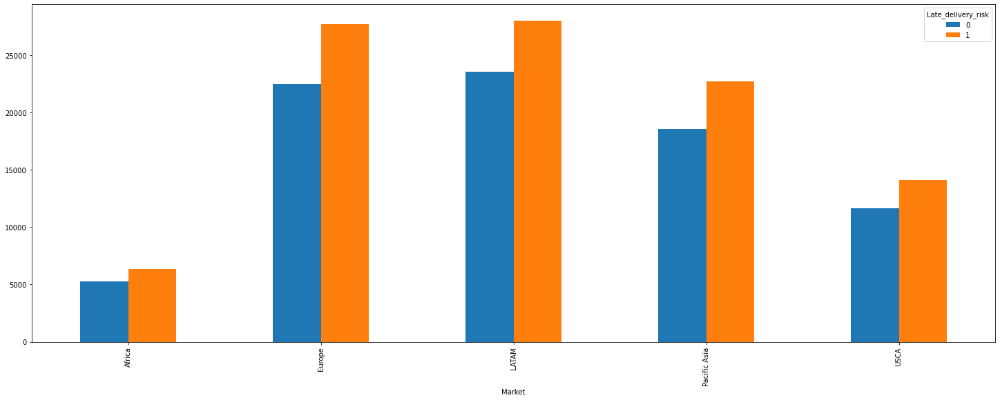

In [226]:
table=pd.crosstab(data['Market'],data['Late_delivery_risk'])
table.plot(kind='bar')

In [227]:
#Applying ChiSquare Contingency Test to check the effect of Market on Late Delivery Risk
teststats,pvalue,dof,exp_value=chi2_contingency(table)
print(pvalue)

0.07044822520489222


* Since the Pvalue is greater than 0.05 but value is 0.07 so we can will consider feature dependent

In [228]:
significant_feature.loc[len(significant_feature.index)]=['Market','name of continent where they operate ','Cannot be able to visualize due to many values','relevent according to chi_square','Market has impact on business ']

# Feature 25:::order city

In [229]:
data_dictionary.iloc[25,:]

FIELDS                               Order City
DESCRIPTION    :  Destination city of the order
Name: 25, dtype: object

* this feature contain info about Destination city of the order

In [230]:
data['Order City'].unique()

array(['Bekasi', 'Bikaner', 'Townsville', ..., 'Tongling', 'Liuyang',
       'Nashua'], dtype=object)

In [231]:
data['Order City'].describe()

count            180519
unique             3597
top       Santo Domingo
freq               2211
Name: Order City, dtype: object

In [232]:
data['Order City'].value_counts(normalize=True).head()

Santo Domingo    0.012248
New York City    0.012198
Los Angeles      0.010221
Tegucigalpa      0.009877
Managua          0.009318
Name: Order City, dtype: float64

* large number of cities we have to either drop it or bin it

# Bi-varient analysis

<AxesSubplot:xlabel='Order City'>

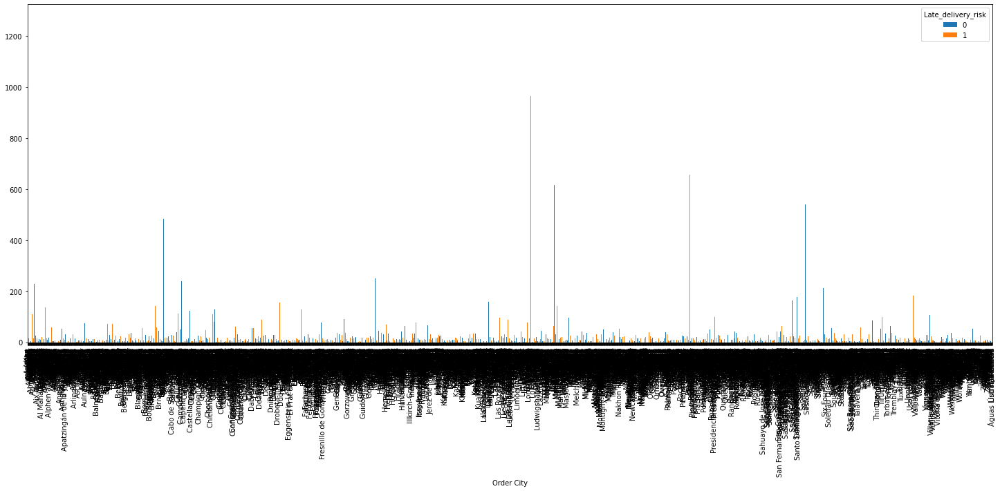

In [233]:
table=pd.crosstab(data['Order City'],data['Late_delivery_risk'])
table.plot(kind='bar')

# Statistical Analysis

In [234]:
#Applying ChiSquare Contingency Test to check the effect of Market on Late Delivery Risk
teststats,pvalue,dof,exp_value=chi2_contingency(table)
print(pvalue)

0.0


Since the Pvalue is less than 0.05 so we can will consider feature dependent

In [235]:
significant_feature.loc[len(significant_feature.index)]=['Order City','Name of the city from where the order is placed ','Cannot visualize due to many values','relevent according to chi_square','Order City has impact on business ']

# feature 26 ::Order Country

In [236]:
data_dictionary.iloc[26,:]

FIELDS                               Order Country
DESCRIPTION    :  Destination country of the order
Name: 26, dtype: object

* this feature contain information about the  Destination country of the order

In [237]:
data['Order Country'].unique()

array(['Indonesia', 'India', 'Australia', 'China', 'Japón',
       'Corea del Sur', 'Singapur', 'Turquía', 'Mongolia',
       'Estados Unidos', 'Nigeria', 'República Democrática del Congo',
       'Senegal', 'Marruecos', 'Alemania', 'Francia', 'Países Bajos',
       'Reino Unido', 'Guatemala', 'El Salvador', 'Panamá',
       'República Dominicana', 'Venezuela', 'Colombia', 'Honduras',
       'Brasil', 'México', 'Uruguay', 'Argentina', 'Cuba', 'Perú',
       'Nicaragua', 'Ecuador', 'Angola', 'Sudán', 'Somalia',
       'Costa de Marfil', 'Egipto', 'Italia', 'España', 'Suecia',
       'Austria', 'Canada', 'Madagascar', 'Argelia', 'Liberia', 'Zambia',
       'Níger', 'SudAfrica', 'Mozambique', 'Tanzania', 'Ruanda', 'Israel',
       'Nueva Zelanda', 'Bangladés', 'Tailandia', 'Irak', 'Arabia Saudí',
       'Filipinas', 'Kazajistán', 'Irán', 'Myanmar (Birmania)',
       'Uzbekistán', 'Benín', 'Camerún', 'Kenia', 'Togo', 'Ucrania',
       'Polonia', 'Portugal', 'Rumania', 'Trinidad y Tobago',


In [238]:
len(data['Order Country'].unique())

164

In [239]:
data['Order Country'].describe()

count             180519
unique               164
top       Estados Unidos
freq               24840
Name: Order Country, dtype: object

In [240]:
data['Order Country'].value_counts(normalize=True).head(10)

Estados Unidos    0.137603
Francia           0.073244
México            0.072967
Alemania          0.052981
Australia         0.047070
Brasil            0.044245
Reino Unido       0.040450
China             0.031897
Italia            0.027637
India             0.026496
Name: Order Country, dtype: float64

* contain 162 diffrent countries so we have to bin it to move forward/have to processed it

# Bi-varient analysis

<AxesSubplot:xlabel='Order Country'>

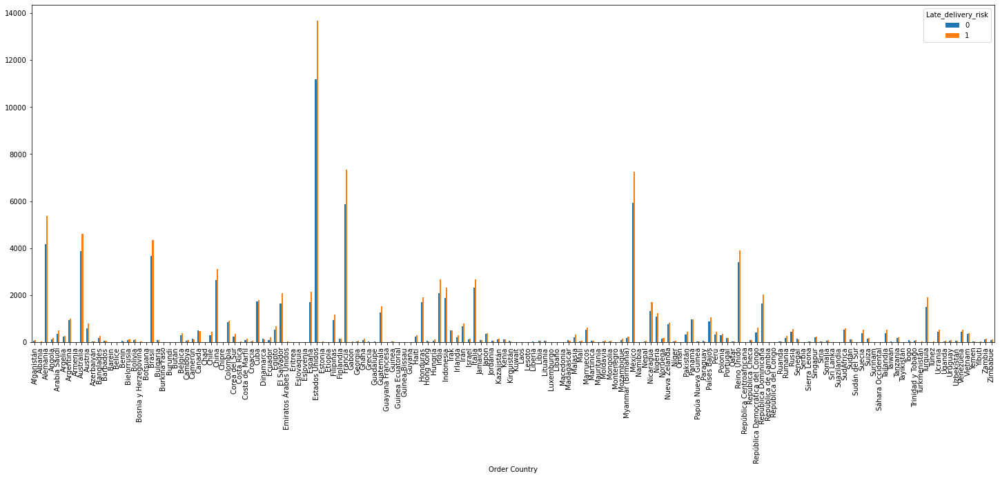

In [241]:
table=pd.crosstab(data['Order Country'],data['Late_delivery_risk'])
table.plot(kind='bar')

# Statistical Test

In [242]:
#Applying ChiSquare Contingency Test to check the effect of Order Country on Late Delivery Risk
teststats,pvalue,dof,exp_value=chi2_contingency(table)
print(pvalue)

4.0108437231692065e-48


Since the Pvalue is less than 0.05 so we can will consider feature dependent.

In [243]:
significant_feature.loc[len(significant_feature.index)]=['Order Country','Name of the Country from where the order is placed ','Cannot visualize due to many values','relevent according to chi_square','Order Country has impact on business ']

# Feature 27:: order customer id

In [244]:
data_dictionary.iloc[27,:]

FIELDS              Order Customer Id
DESCRIPTION    :  Customer order code
Name: 27, dtype: object

* this feature contain infor about the  Customer order code

In [245]:
data['Order Customer Id'].describe()

count    180519.000000
mean       6691.379495
std        4162.918106
min           1.000000
25%        3258.500000
50%        6457.000000
75%        9779.000000
max       20757.000000
Name: Order Customer Id, dtype: float64

In [246]:
len(data['Order Customer Id'].unique())

20652

In [247]:
data['Order Customer Id'].value_counts().head()

5654     47
10591    45
5004     45
5715     44
3708     44
Name: Order Customer Id, dtype: int64

* a huge amount of unique values we will frop it after extracting useful meterial

# Bi-varient analysis

<AxesSubplot:xlabel='Late_delivery_risk', ylabel='Order Customer Id'>

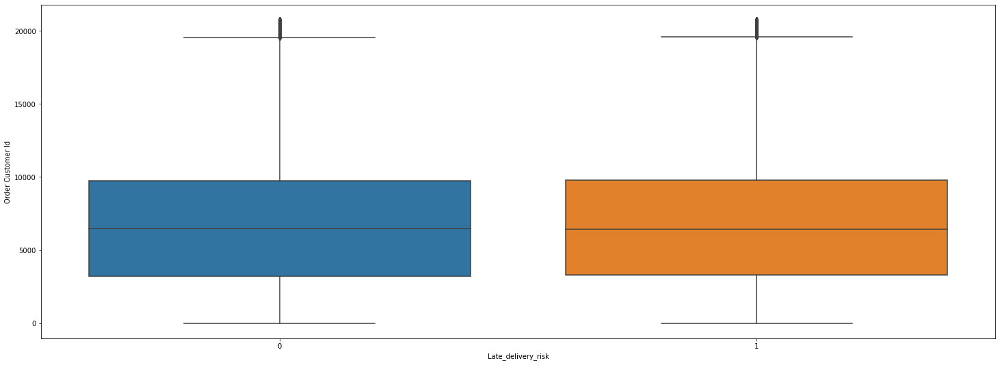

In [248]:
sns.boxplot(x=target,y =data['Order Customer Id'] )

# Statistical Test

In [249]:
model=sfa.ols("data['Order Customer Id']~target",data=data).fit()
print(anova_lm(model))

                df        sum_sq       mean_sq         F    PR(>F)
target         1.0  6.893530e+06  6.893530e+06  0.397781  0.528238
Residual  180517.0  3.128350e+12  1.732994e+07       NaN       NaN


In [250]:
  aetgrstgun_significant_feature.loc[len(un_significant_feature.index)]=['Order Customer Id','Customer order code','contain only  XXXX for each observation','not applicable','not applicable']

In [251]:
data.drop(['Order Customer Id'],axis=1,inplace=True)

# Feature 28 order date

In [252]:
data_dictionary.iloc[28,:]

FIELDS                    order date (DateOrders)
DESCRIPTION    :  Date on which the order is made
Name: 28, dtype: object

* this feature contain info of the  Date on which the order is made

In [253]:
data['order date (DateOrders)']=data['order date (DateOrders)'].str.split(' ').str[0]

In [254]:
significant_feature.loc[len(significant_feature.index)]=['order date (DateOrders)',' Date on which the order is made','date feature we will try to extract something','not applicable for now','we will see further']

# Feature 29:Order Id

In [255]:
data_dictionary.iloc[29,:]

FIELDS              Order Id
DESCRIPTION    :  Order code
Name: 29, dtype: object

* this feature contain information about Order code/order id atached with each order

In [256]:
len(data['Order Id'].unique())# 65752 diffrent observation we have to drop it

65752

# Bi_varient 

<AxesSubplot:xlabel='Late_delivery_risk', ylabel='Order Id'>

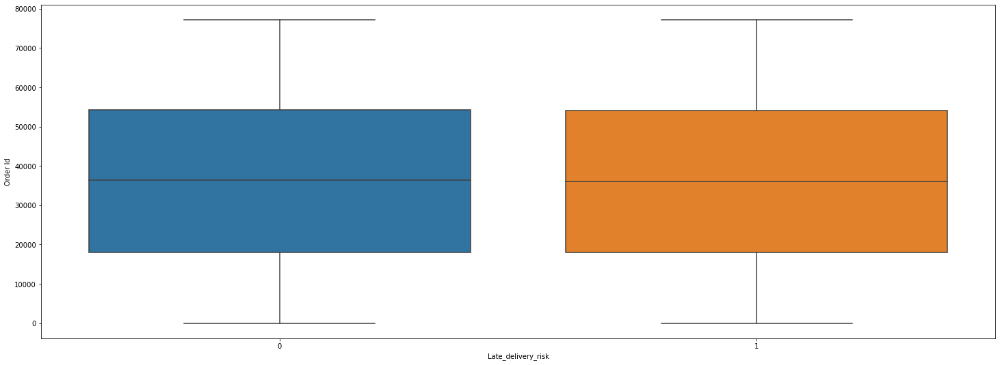

In [257]:
sns.boxplot(x=target,y =data['Order Id'])

# Stats test

In [258]:
model=sfa.ols("data['Order Id']~target",data=data).fit()
print(anova_lm(model))

                df        sum_sq       mean_sq         F    PR(>F)
target         1.0  1.335922e+08  1.335922e+08  0.301624  0.582867
Residual  180517.0  7.995273e+13  4.429097e+08       NaN       NaN


In [259]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Order Id',' Order code','Uniform distribution among the class','not applicable','not applicable']

In [260]:
data.drop('Order Id',axis=1,inplace=True)

# feature 30::Order Item Cardprod Id

In [261]:
data_dictionary.iloc[30,:]

FIELDS                                    Order Item Cardprod Id
DESCRIPTION    :  Product code generated through the RFID reader
Name: 30, dtype: object

* this feature contain info about Product code generated through the RFID reader

In [262]:
len(data['Order Item Cardprod Id'].unique())

118

In [263]:
data['Order Item Cardprod Id'].describe()

count    180519.000000
mean        692.509764
std         336.446807
min          19.000000
25%         403.000000
50%         627.000000
75%        1004.000000
max        1363.000000
Name: Order Item Cardprod Id, dtype: float64

In [264]:
data['Order Item Cardprod Id'].value_counts([0]).head(20)

365     0.135803
403     0.123234
502     0.116525
1014    0.106903
1004    0.095973
1073    0.085864
957     0.076053
191     0.067411
627     0.058814
1362    0.004642
1350    0.003612
1363    0.003601
1349    0.003279
1361    0.002930
1359    0.002725
1355    0.002681
1353    0.002681
1354    0.002676
1351    0.002448
1358    0.002404
Name: Order Item Cardprod Id, dtype: float64

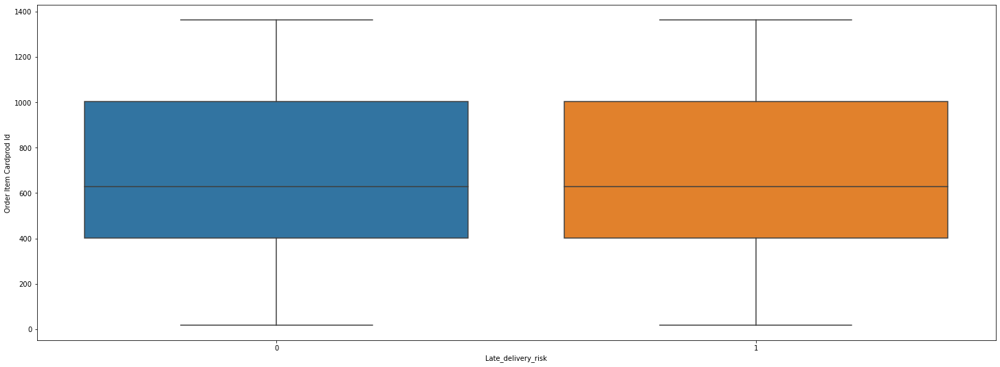

In [265]:
sns.boxplot(data['Late_delivery_risk'],data['Order Item Cardprod Id'])
plt.show()


In [266]:
model=sfa.ols("Late_delivery_risk~data['Order Item Cardprod Id']",data=data).fit()
print(anova_lm(model))

                                      df        sum_sq  mean_sq         F  \
data['Order Item Cardprod Id']       1.0      0.099210  0.09921  0.400574   
Residual                        180517.0  44708.671246  0.24767       NaN   

                                  PR(>F)  
data['Order Item Cardprod Id']  0.526794  
Residual                             NaN  


In [267]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Order Item Cardprod Id','Product code generated through the RFID reader','Uniform distribution among the class','no relevance according to Annova','No business relevance']

# Feature 31:: Order Item Discount

In [268]:
data_dictionary.iloc[31,:]

FIELDS                  Order Item Discount
DESCRIPTION    :  Order item discount value
Name: 31, dtype: object

* this feature contain information about  Order item discount value


In [269]:
data['Order Item Discount'].describe()

count    180519.000000
mean         20.664741
std          21.800901
min           0.000000
25%           5.400000
50%          14.000000
75%          29.990000
max         500.000000
Name: Order Item Discount, dtype: float64

<AxesSubplot:xlabel='Order Item Discount'>

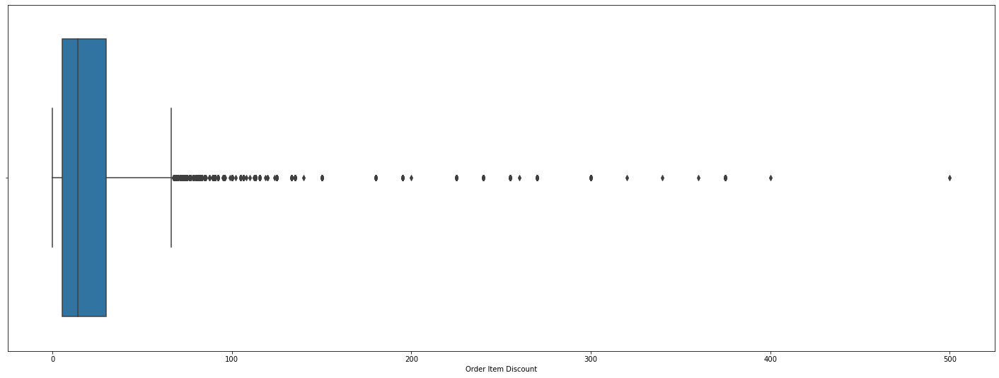

In [270]:
sns.boxplot(data['Order Item Discount'])

<AxesSubplot:xlabel='Order Item Discount', ylabel='Density'>

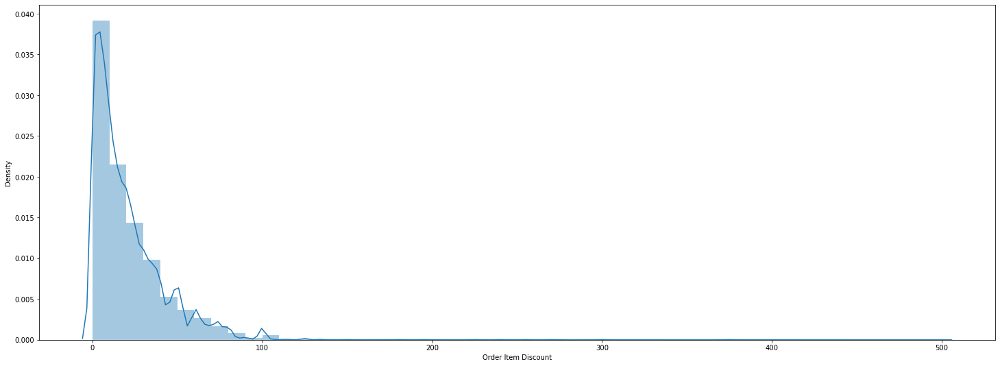

In [271]:
sns.distplot(data['Order Item Discount'])

* large number of outliers are present

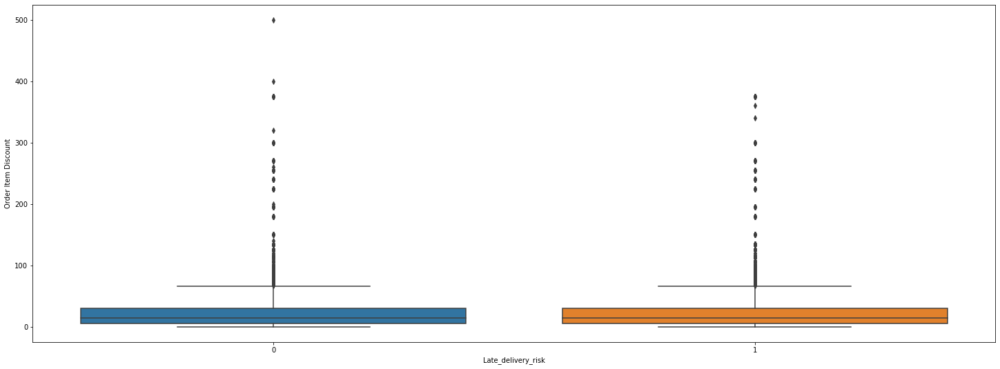

In [272]:
#Bivariate
sns.boxplot(data['Late_delivery_risk'],data['Order Item Discount'])
plt.show()


In [273]:
# Applying Anova_lm to verify the effect of Order Item Discount on Late Delivery Risk
model=sfa.ols("Late_delivery_risk~data['Order Item Discount']",data=data).fit()
print(anova_lm(model))

                                   df        sum_sq   mean_sq         F  \
data['Order Item Discount']       1.0      0.025143  0.025143  0.101516   
Residual                     180517.0  44708.745314  0.247671       NaN   

                               PR(>F)  
data['Order Item Discount']  0.750018  
Residual                          NaN  


In [274]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Order Item Discount','Order item discount value','Uniform distribution among the class','no relevance according to Annova','Order item discount has not impact on business']

In [275]:
un_significant_feature

,feature name,description,bivarient observation,statical test,business relevence
0,Benefit per order,Earnings per order placed,it displays positive and negative values,unrelevant according to anova_lm,no relevance on delay
1,Sales per customer,Total sales per customer,it displays uniform distribution,unrelevant according to anova_lm,no relevance on delay
2,Customer Id,Product category code,it displays uniform distribution,unrelevant according to chi2,no relevance
3,Category Name,Description of the product category,it displays uniform distribution,unrelevant according to chi2,no relevance
4,Customer Country,Country where the customer made the purchase,it displays uniform distribution,unrelevant according to chi2,may impact delay
5,Customer Email,Email of customers,contain only XXXX for each observation,not applicable,not applicable
6,Customer Fname,First name of customers,contain unique first name,not applicable,not applicable
7,Customer Id,Id of customers,contain unique customer id,no relevance according to anova_lm,no relevance
8,Customer Password,Masked customer key,contain only XXXX for each observation,not applicable,not applicable
9,Customer Segment,Types of Customers,Uniform distribution among all segments,Unsignificant according to chi-square,Customer segment not impact delay


# Feature 32 ::Order Item Discount Rate  

In [276]:
data_dictionary.iloc[32,:]

FIELDS             Order Item Discount Rate     
DESCRIPTION    :  Order item discount percentage
Name: 32, dtype: object

* this feature contain info about the Order item discount percentage

In [277]:
data['Order Item Discount Rate'].describe()

count    180519.000000
mean          0.101668
std           0.070415
min           0.000000
25%           0.040000
50%           0.100000
75%           0.160000
max           0.250000
Name: Order Item Discount Rate, dtype: float64

* we will try to find info from it

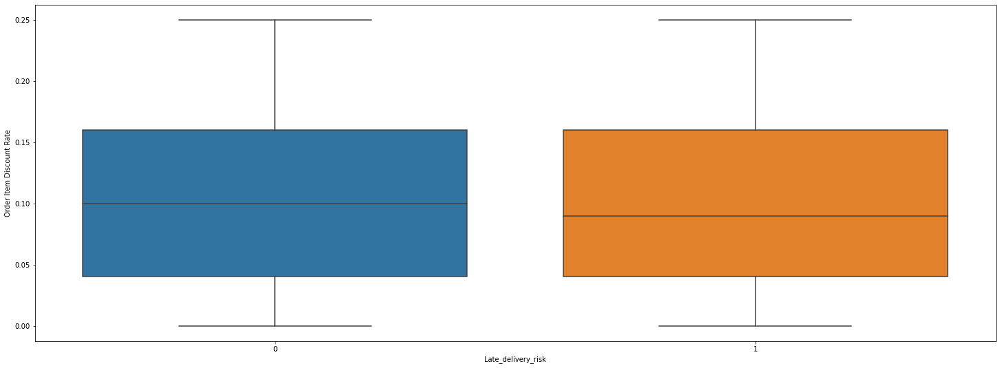

In [278]:
#Bivariate
sns.boxplot(data['Late_delivery_risk'],data['Order Item Discount Rate'])
plt.show()


In [279]:
model=sfa.ols("Late_delivery_risk~data['Order Item Discount Rate']",data=data).fit()
print(anova_lm(model))

                                        df        sum_sq   mean_sq         F  \
data['Order Item Discount Rate']       1.0      0.007308  0.007308  0.029507   
Residual                          180517.0  44708.763148  0.247671       NaN   

                                    PR(>F)  
data['Order Item Discount Rate']  0.863614  
Residual                               NaN  


In [280]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Order Item Discount Rate',"Order item discount percentage",'Uniform distribution among the class','unsignificant according to Annova','No relevance']

# Feature 33:: Order Item Id

In [281]:
data_dictionary.iloc[33,:]

FIELDS              Order Item Id
DESCRIPTION    :  Order item code
Name: 33, dtype: object

* this feature contain info about Order item code

In [282]:
len(data[ 'Order Item Id'].unique())

180519

* contain unique values for each order 

In [283]:
data.drop([ 'Order Item Id'],axis=1,inplace=True)

In [284]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Order Item Id',"Order item code",'contain unique values for each order','not applicable','No relevance']

# feature 34 :: Order Item Product Price

In [285]:
data_dictionary.iloc[34,:]

FIELDS                 Order Item Product Price     
DESCRIPTION    :  Price of products without discount
Name: 34, dtype: object

* this featurre contain information about the Price of products without discount

In [286]:
data['Order Item Product Price'].describe()

count    180519.000000
mean        141.232550
std         139.732492
min           9.990000
25%          50.000000
50%          59.990002
75%         199.990005
max        1999.989990
Name: Order Item Product Price, dtype: float64

<AxesSubplot:xlabel='Order Item Product Price'>

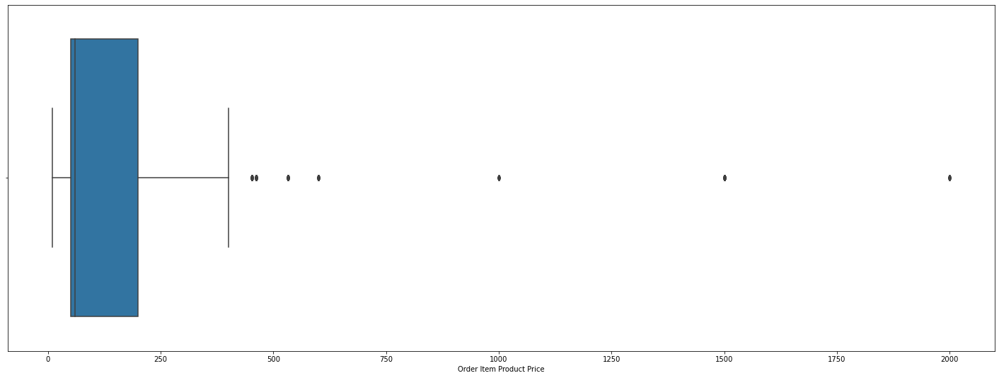

In [287]:
sns.boxplot(data['Order Item Product Price'])

<AxesSubplot:xlabel='Order Item Product Price', ylabel='Density'>

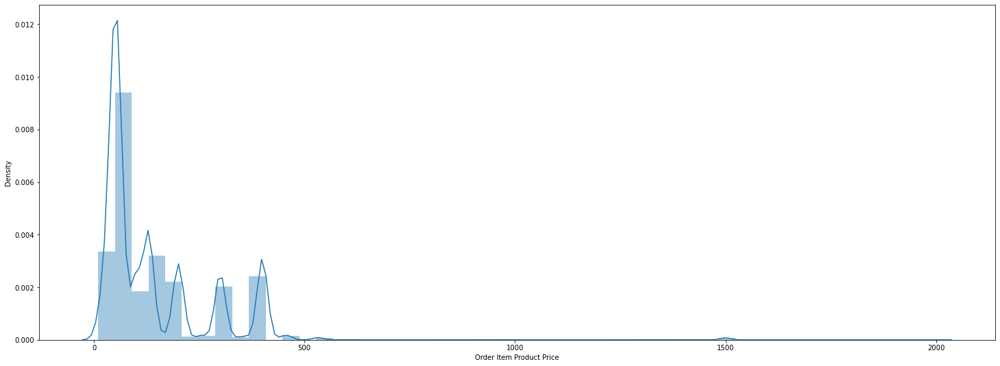

In [288]:
sns.distplot(data['Order Item Product Price'])

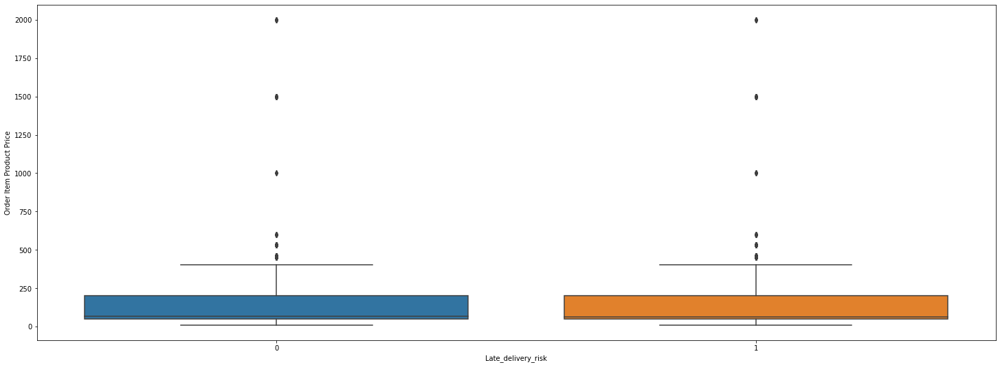

In [289]:
#Bivariate
sns.boxplot(data['Late_delivery_risk'],data['Order Item Product Price'])
plt.show()


In [290]:
#Statical test
model=sfa.ols("Late_delivery_risk~data['Order Item Product Price']",data=data).fit()
print(anova_lm(model))

                                        df        sum_sq   mean_sq         F  \
data['Order Item Product Price']       1.0      0.211549  0.211549  0.854158   
Residual                          180517.0  44708.558907  0.247670       NaN   

                                   PR(>F)  
data['Order Item Product Price']  0.35538  
Residual                              NaN  


In [291]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Order Item Product Price',"Price of products without discount",'Uniform distribution among the class','unsignificant according to annova','No relevance']

# feature 35 ::Order Item Profit Ratio

In [292]:
data_dictionary.iloc[35,:]

FIELDS            Order Item Profit Ratio
DESCRIPTION    :  Order Item Profit Ratio
Name: 35, dtype: object

* this feature contain info about Order Item Profit Ratio


In [293]:
data['Order Item Profit Ratio'].head()

0    0.29
1   -0.80
2   -0.80
3    0.08
4    0.45
Name: Order Item Profit Ratio, dtype: float64

In [294]:
data['Order Item Profit Ratio'].describe()

count    180519.000000
mean          0.120647
std           0.466796
min          -2.750000
25%           0.080000
50%           0.270000
75%           0.360000
max           0.500000
Name: Order Item Profit Ratio, dtype: float64

<AxesSubplot:xlabel='Order Item Profit Ratio'>

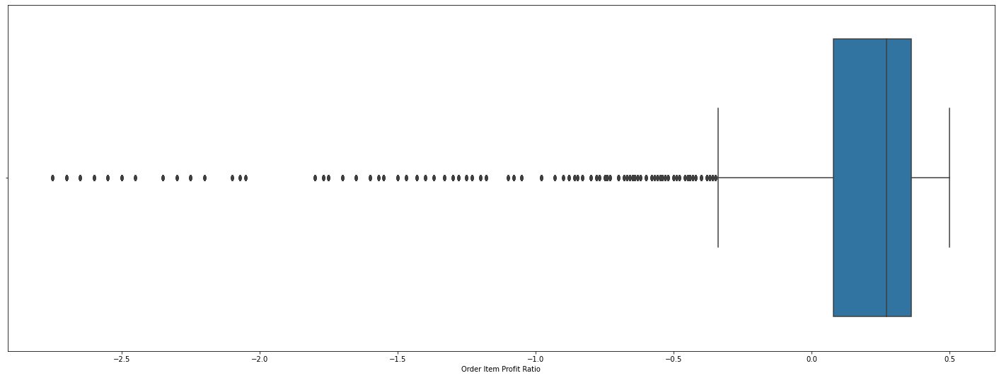

In [295]:
sns.boxplot(data['Order Item Profit Ratio'])

<AxesSubplot:xlabel='Order Item Profit Ratio', ylabel='Density'>

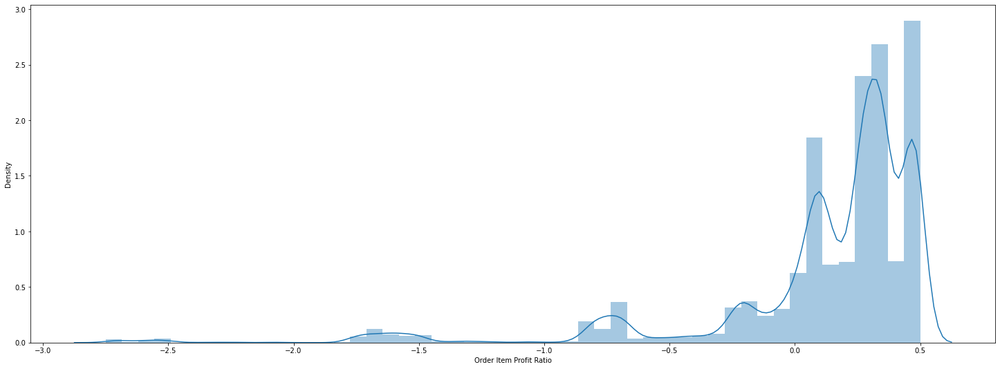

In [296]:
sns.distplot(data['Order Item Profit Ratio'])

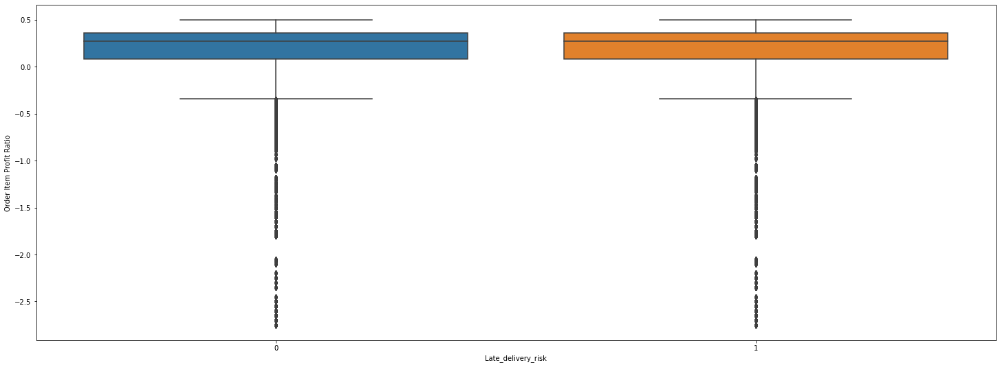

In [297]:
#Bivariate
sns.boxplot(data['Late_delivery_risk'],data['Order Item Profit Ratio'])
plt.show()


In [298]:
#Statical test
model=sfa.ols("Late_delivery_risk~data['Order Item Profit Ratio']",data=data).fit()
print(anova_lm(model))

                                       df        sum_sq   mean_sq         F  \
data['Order Item Profit Ratio']       1.0      0.239708  0.239708  0.967855   
Residual                         180517.0  44708.530748  0.247669       NaN   

                                   PR(>F)  
data['Order Item Profit Ratio']  0.325217  
Residual                              NaN  


In [299]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Order Item Profit Ratio'," Order Item Profit Ratio",'Uniform distribution among the class','unsignificant according to annova','No relevance']

# Feature 36:: Order Item Quantity

In [300]:
data_dictionary.iloc[36,:]

FIELDS                     Order Item Quantity
DESCRIPTION    :  Number of products per order
Name: 36, dtype: object

* this feature info about the Number of products per order

In [301]:
data['Order Item Quantity'].unique()

array([1, 2, 3, 5, 4], dtype=int64)

In [302]:
data['Order Item Quantity'].value_counts()

1    99134
5    20385
3    20350
4    20335
2    20315
Name: Order Item Quantity, dtype: int64

In [303]:
data['Order Item Quantity'].value_counts([0])

1    0.549161
5    0.112924
3    0.112731
4    0.112647
2    0.112537
Name: Order Item Quantity, dtype: float64

<AxesSubplot:xlabel='Order Item Quantity', ylabel='count'>

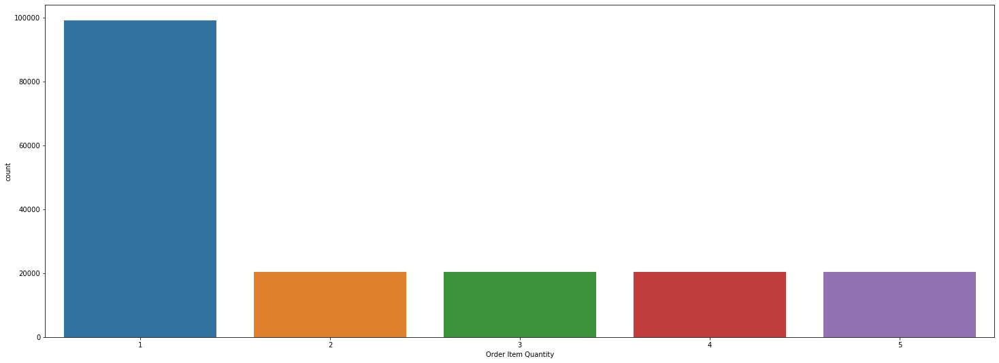

In [304]:
sns.countplot(data['Order Item Quantity'])

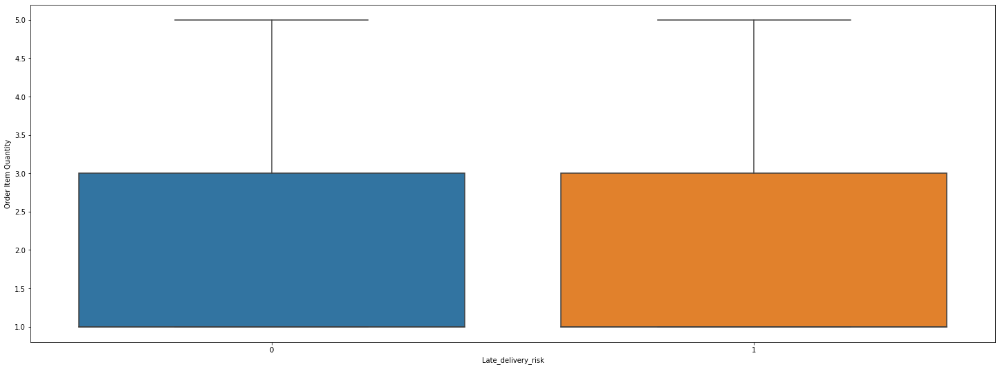

In [305]:
#Bivariate
sns.boxplot(data['Late_delivery_risk'],data['Order Item Quantity'])
plt.show()



In [306]:
#Statical test
model=sfa.ols("Late_delivery_risk~data['Order Item Quantity']",data=data).fit()
print(anova_lm(model))


                                   df        sum_sq   mean_sq         F  \
data['Order Item Quantity']       1.0      0.000867  0.000867  0.003499   
Residual                     180517.0  44708.769590  0.247671       NaN   

                               PR(>F)  
data['Order Item Quantity']  0.952828  
Residual                          NaN  


In [307]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Order Item Quantity','Number of products per order','Uniform distribution among the class','unsignificant according to annova','No relevance']

# feature 37 ::Sales

In [308]:
data_dictionary.iloc[37,:]

FIELDS                     Sales
DESCRIPTION    :  Value in sales
Name: 37, dtype: object

* this feature contain the info about  Value in sales

In [309]:
data['Sales'].describe()

count    180519.000000
mean        203.772096
std         132.273077
min           9.990000
25%         119.980003
50%         199.919998
75%         299.950012
max        1999.989990
Name: Sales, dtype: float64

<AxesSubplot:xlabel='Sales'>

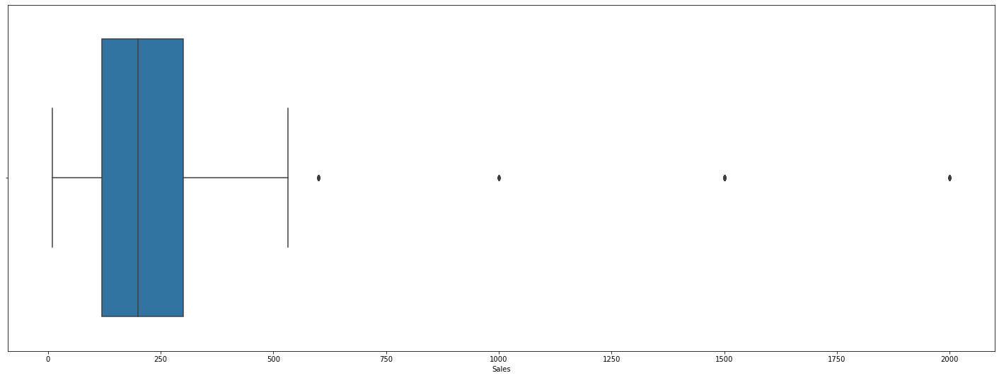

In [310]:
sns.boxplot(data['Sales'])

<AxesSubplot:xlabel='Sales', ylabel='Density'>

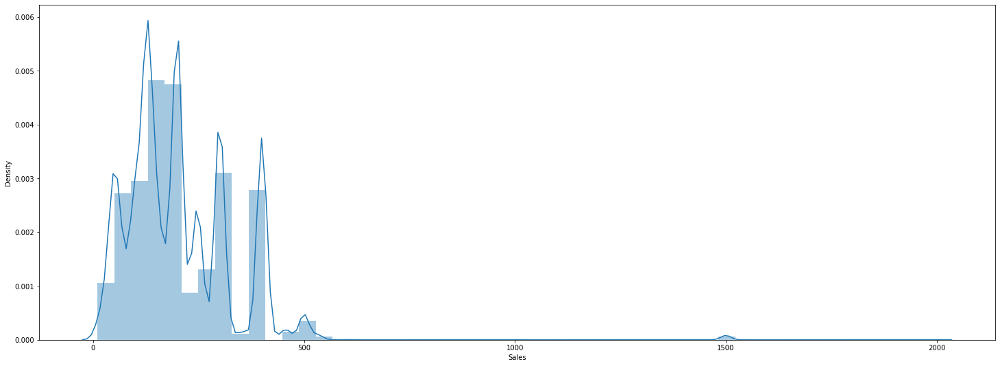

In [311]:
sns.distplot(data['Sales'])

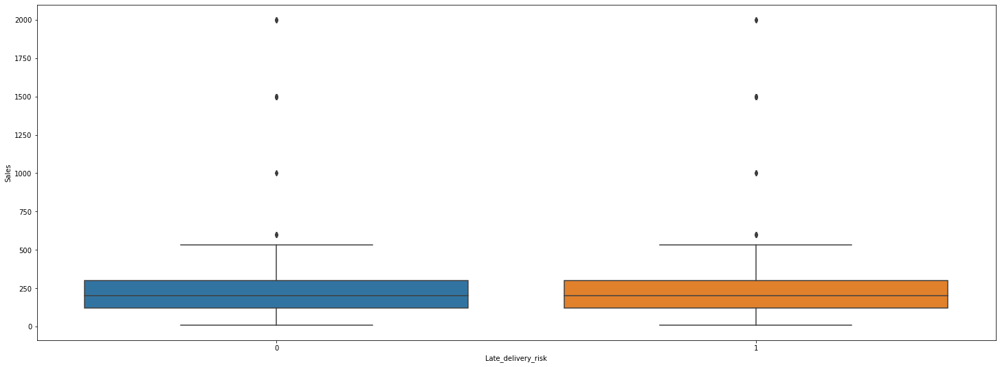

In [312]:
#Bivariate
sns.boxplot(data['Late_delivery_risk'],data['Sales'])
plt.show()

In [313]:
#Statical test
model=sfa.ols("Late_delivery_risk~Sales",data=data).fit()
print(anova_lm(model))

                df        sum_sq   mean_sq         F    PR(>F)
Sales          1.0      0.568010  0.568010  2.293437  0.129924
Residual  180517.0  44708.202446  0.247668       NaN       NaN


In [314]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Sales','Value in sales','Uniform distribution among the class','unsignificant according to annova','No relevance']

# feature 38 ::Order Item Total  

In [315]:
data_dictionary.iloc[38,:]

FIELDS                Order Item Total  
DESCRIPTION    :  Total amount per order
Name: 38, dtype: object

* this feature contain info about Total amount per order

In [316]:
data['Order Item Total'].describe()

count    180519.000000
mean        183.107609
std         120.043670
min           7.490000
25%         104.379997
50%         163.990005
75%         247.399994
max        1939.989990
Name: Order Item Total, dtype: float64

<AxesSubplot:xlabel='Order Item Total', ylabel='Density'>

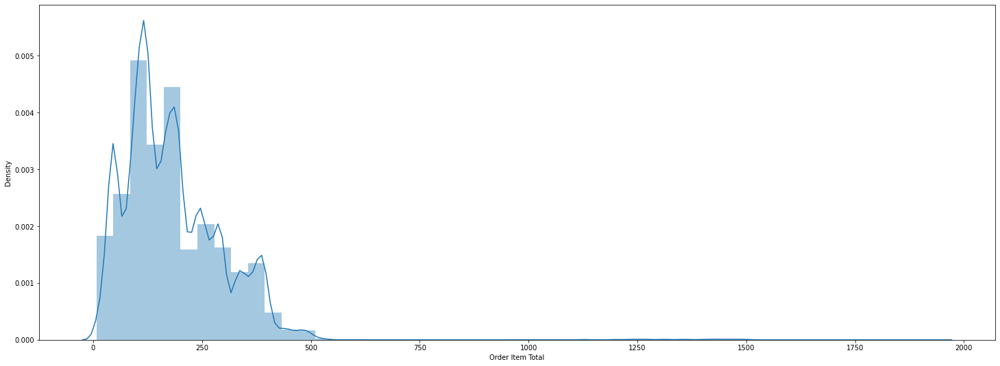

In [317]:
sns.distplot(data['Order Item Total'])

* The Distplot shows that the data is positively skewed
* Also there are outliers in the data 

<AxesSubplot:xlabel='Order Item Total'>

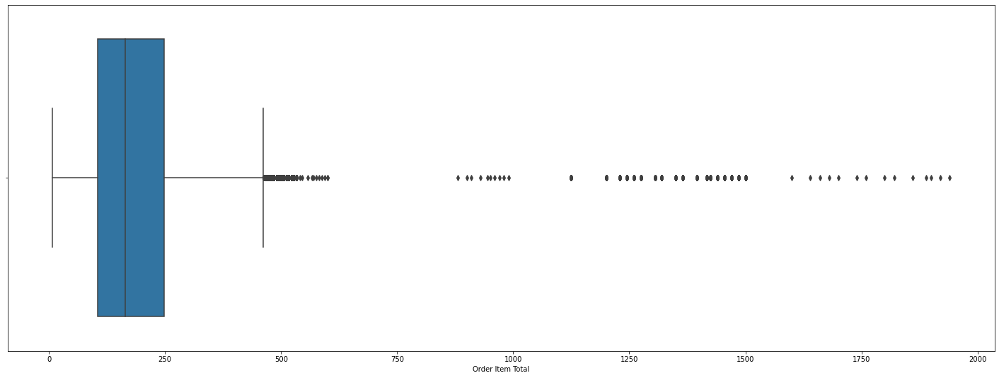

In [318]:
sns.boxplot(data['Order Item Total'])

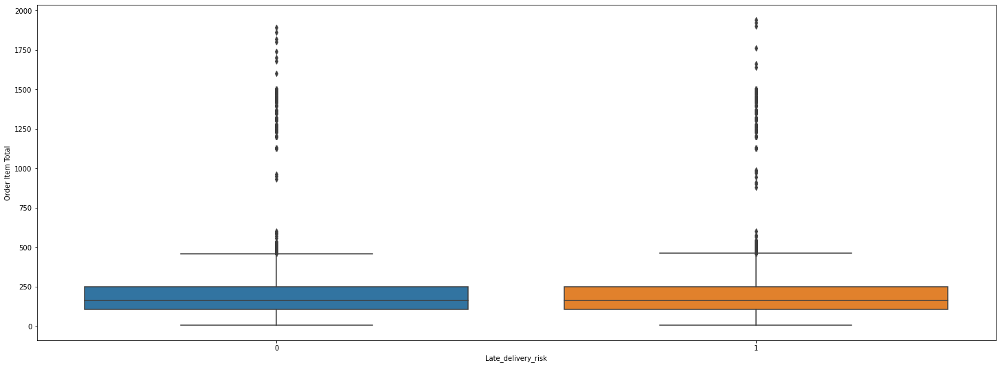

In [319]:
#Bivariate
sns.boxplot(data['Late_delivery_risk'],data['Order Item Total'])
plt.show()



In [320]:
#Statical test
model=sfa.ols("Late_delivery_risk~data['Order Item Total']",data=data).fit()
print(anova_lm(model))

                                df        sum_sq   mean_sq         F    PR(>F)
data['Order Item Total']       1.0      0.642629  0.642629  2.594728  0.107222
Residual                  180517.0  44708.127827  0.247667       NaN       NaN


In [321]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Order Item Total','Total amount per order','Uniform distribution among the class','unsignificant according to annova','No relevance']

# feature 39 ::Order Profit Per Order

In [322]:
data_dictionary.iloc[39,:]

FIELDS            Order Profit Per Order
DESCRIPTION    :  Order Profit Per Order
Name: 39, dtype: object

* this feature contain information about Order Profit Per Order

In [323]:
data['Order Profit Per Order'].describe()

count    180519.000000
mean         21.974989
std         104.433526
min       -4274.979980
25%           7.000000
50%          31.520000
75%          64.800003
max         911.799988
Name: Order Profit Per Order, dtype: float64

* We can see that the some data value also lies in negative range showing some extreme loss

<AxesSubplot:xlabel='Order Profit Per Order', ylabel='Density'>

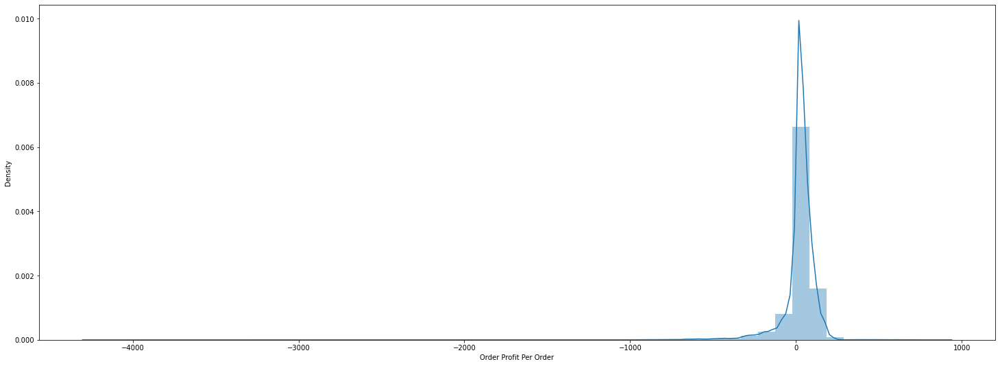

In [324]:
sns.distplot(data['Order Profit Per Order'])

* distribution plot shows that it is an negatively skewed distribution 
* The company is making loss on some Order and it is exceding -4000 per order 
* they should take steps to reduce the loss and then think about the profit 

<AxesSubplot:xlabel='Order Profit Per Order'>

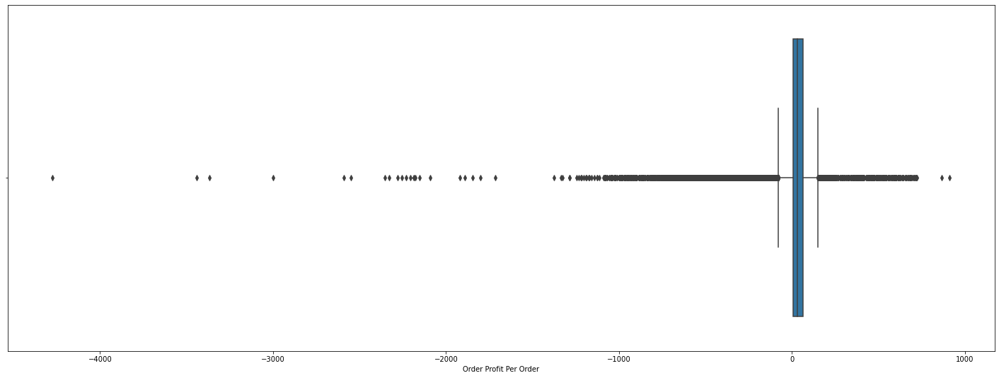

In [325]:
sns.boxplot(data['Order Profit Per Order'])

* Treatment of outlier as most of the value is more and less 

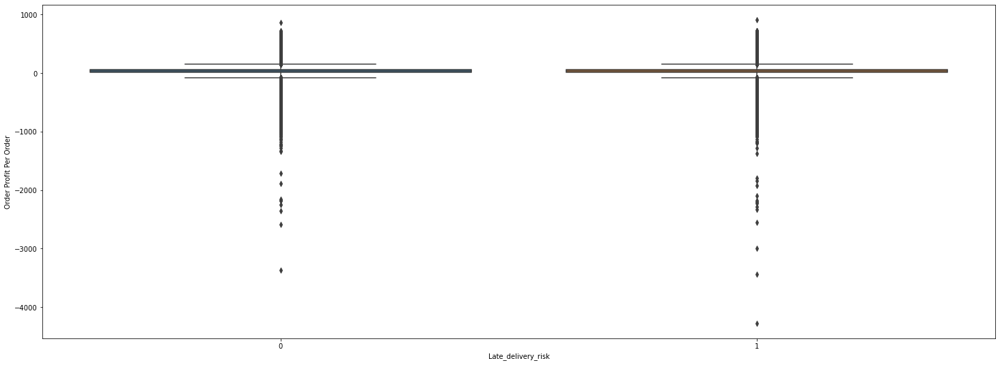

In [326]:
#Bivariate
sns.boxplot(data['Late_delivery_risk'],data['Order Profit Per Order'])
plt.show()

In [327]:
#statistical test
model=sfa.ols("Late_delivery_risk~data['Order Profit Per Order']",data=data).fit()
print(anova_lm(model))


                                      df        sum_sq   mean_sq         F  \
data['Order Profit Per Order']       1.0      0.621027  0.621027  2.507506   
Residual                        180517.0  44708.149429  0.247667       NaN   

                                  PR(>F)  
data['Order Profit Per Order']  0.113307  
Residual                             NaN  


In [328]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Order Profit Per Order','Order Profit Per Order','Uniform distribution among the class','unsignificant according to annova','No relevance']

# Feature ::40 Order Region

In [329]:
data_dictionary.iloc[40,:]

FIELDS                                              Order Region
DESCRIPTION    :  Region of the world where the order is deli...
Name: 40, dtype: object

* this feature contain info of Region of the world where the order is delivered

In [330]:
data['Order Region'].describe()

count              180519
unique                 23
top       Central America
freq                28341
Name: Order Region, dtype: object

<AxesSubplot:>

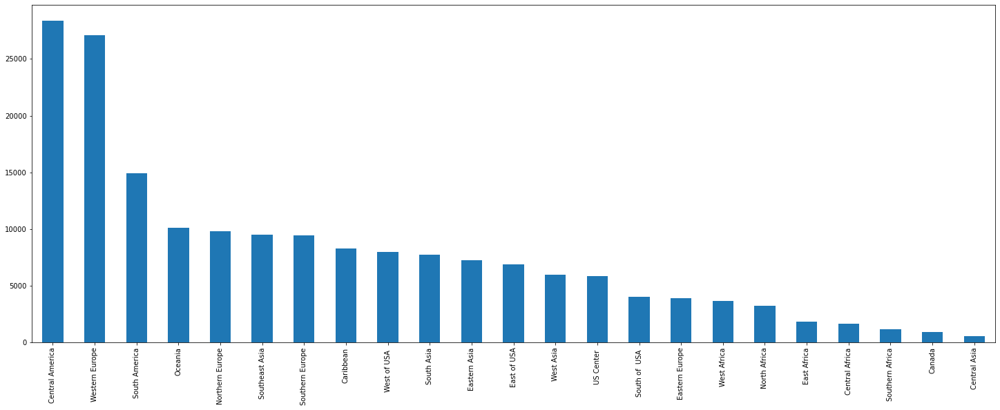

In [331]:
data['Order Region'].value_counts().plot(kind='bar')

* The top five order region are Central America,Western Europe,South America,Oceania,Northern Europe

<AxesSubplot:xlabel='Order Region'>

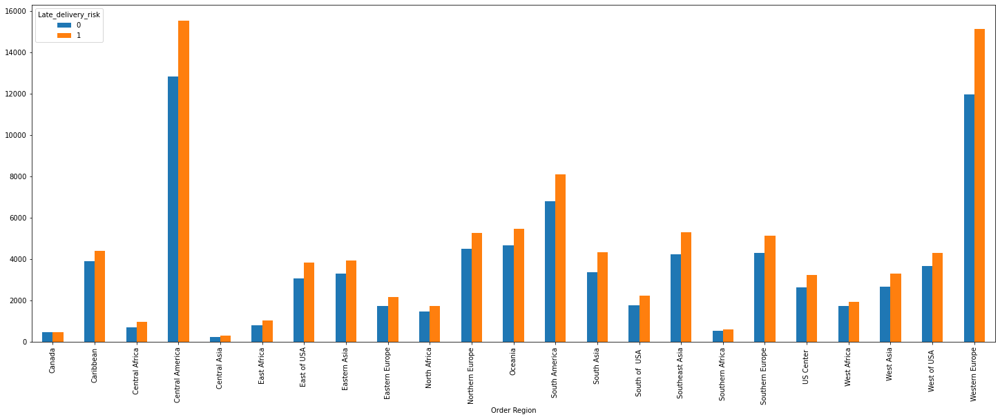

In [332]:
#Bivariate
tbl=pd.crosstab(data['Order Region'],data['Late_delivery_risk'])
tbl.plot.bar()

In [333]:
#Statistical test
teststats,pvalue,dof,exp_value=chi2_contingency(tbl)
print(pvalue)

1.083129807862368e-07


In [334]:
significant_feature.loc[len(significant_feature.index)]=['Order Region', 'info of Region of the world where the order is delivered','each region have different delay ratio ','Significant(chi-square)','Relevance']

# feature 41::Order State

In [335]:
data_dictionary.iloc[41,:]

FIELDS                                               Order State
DESCRIPTION    :  State of the region where the order is deli...
Name: 41, dtype: object

* this feature contain information of State of the region where the order is delivered

In [336]:
data['Order State'].describe()

count         180519
unique          1089
top       Inglaterra
freq            6722
Name: Order State, dtype: object

In [337]:
data['Order State'].value_counts()

Inglaterra                              6722
California                              4966
Isla de Francia                         4580
Renania del Norte-Westfalia             3303
San Salvador                            3055
Nueva York                              2753
Distrito Federal                        2559
Texas                                   2446
Nueva Gales del Sur                     2370
Santo Domingo                           2211
Queensland                              2186
Guatemala                               2109
São Paulo                               2031
Provenza-Alpes-Costa Azul               1842
Capital Nacional                        1837
Managua                                 1834
Francisco Morazán                       1783
Panamá                                  1631
Victoria                                1456
Pensilvania                             1406
Washington                              1272
Illinois                                1237
Jalisco   

*top five state are Inglaterra,California,Isla de Francia Renania del Norte-Westfalia,San Salvador
* there are almost 1089 categories in this

<AxesSubplot:xlabel='Order State'>

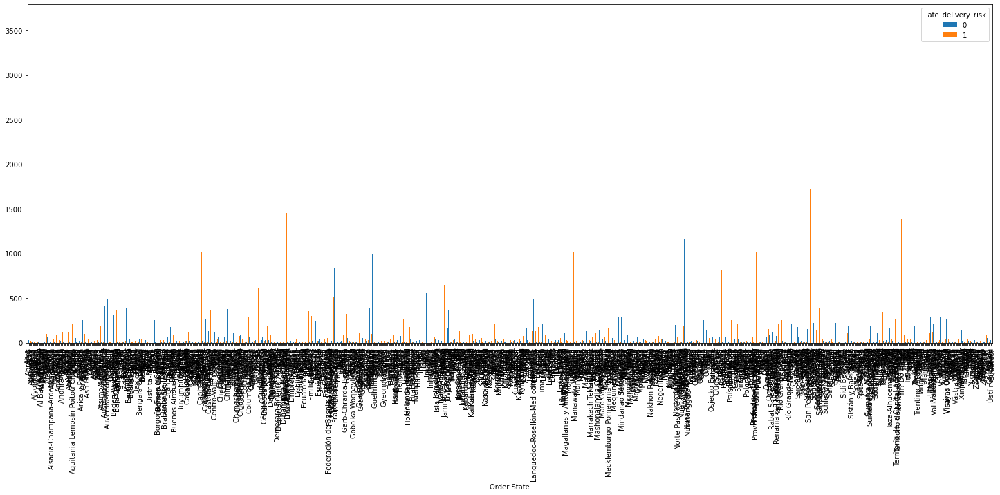

In [338]:
#Bivariate
table=pd.crosstab(data['Order State'],data['Late_delivery_risk'])
table.plot(kind='bar')

In [339]:
#Statistical Test
teststats,pvalue,dof,exp_value=chi2_contingency(table)
print(pvalue)

0.0


In [340]:
significant_feature.loc[len(significant_feature.index)]=['Order State',  'State of the region where the order is delivered','cannot able to visualize','Significant(chi-square)','Relevance']

# Feature 42::Order Status

In [341]:
data_dictionary.iloc[42,:]

FIELDS                                              Order Status
DESCRIPTION    :  Order Status : COMPLETE , PENDING , CLOSED ...
Name: 42, dtype: object

* this feature have information about Order Status where status is COMPLETE , PENDING , CLOSED etc

In [342]:
data['Order Status'].describe()

count       180519
unique           9
top       COMPLETE
freq         59491
Name: Order Status, dtype: object

In [343]:
data['Order Status'].value_counts()

COMPLETE           59491
PENDING_PAYMENT    39832
PROCESSING         21902
PENDING            20227
CLOSED             19616
ON_HOLD             9804
SUSPECTED_FRAUD     4062
CANCELED            3692
PAYMENT_REVIEW      1893
Name: Order Status, dtype: int64

* Only 59491 order is completed out of 180519 orders
* PENDING_PAYMENT 39832 is also a concern
* processing the order is also high 21902
* pending (order pending) 20227 should be fullfiled

<AxesSubplot:xlabel='Order Status'>

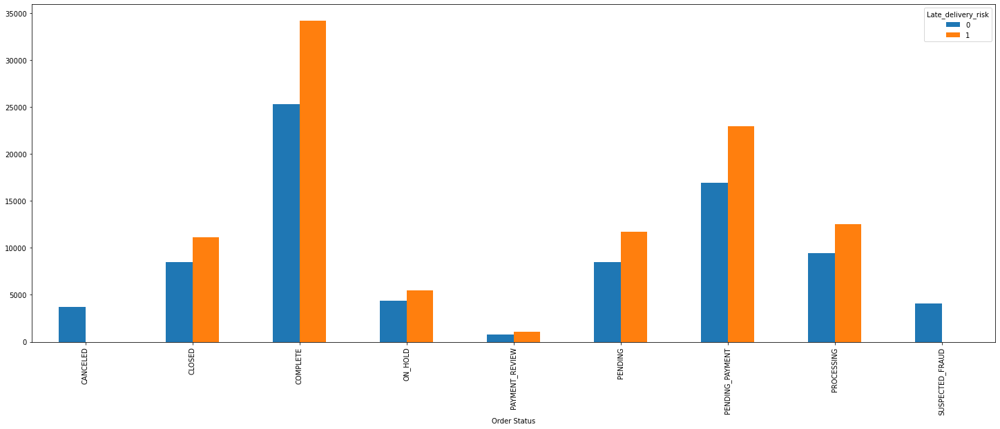

In [344]:
#Bivariate 
tbl=pd.crosstab(data['Order Status'],data['Late_delivery_risk'])
tbl
tbl.plot(kind='bar')



In [345]:
#Statistical Test 
teststats,pvalue,dof,exp_value=chi2_contingency(tbl)
print(pvalue)

0.0


In [346]:
significant_feature.loc[len(significant_feature.index)]=['Order Status','Order Status' ,'different catagory have different delay ratio ','Significant(chi-square)','Relevance']

# Feature 43 :: Product Card Id

In [347]:
data_dictionary.iloc[43,:]

FIELDS         Product Card Id
DESCRIPTION    :  Product code
Name: 43, dtype: object

* this feature contain information of Product code

In [348]:
data['Product Card Id'].describe()

count    180519.000000
mean        692.509764
std         336.446807
min          19.000000
25%         403.000000
50%         627.000000
75%        1004.000000
max        1363.000000
Name: Product Card Id, dtype: float64

In [349]:
data['Product Card Id'].value_counts()

365     24515
403     22246
502     21035
1014    19298
1004    17325
1073    15500
957     13729
191     12169
627     10617
1362      838
1350      652
1363      650
1349      592
1361      529
1359      492
1355      484
1353      484
1354      483
1351      442
1358      434
1352      431
1346      405
1356      362
1360      357
116       328
977       323
172       318
565       314
885       313
793       311
276       311
828       310
728       309
835       308
135       308
804       307
823       306
44        305
642       304
703       303
926       302
924       300
572       300
906       300
905       299
235       299
797       298
564       298
917       295
893       295
886       292
821       292
818       291
567       289
249       287
282       285
775       285
771       284
792       282
897       281
93        280
278       280
778       279
134       279
810       277
1348      271
822       265
37        262
825       257
273       251
1357      208
1347  

* 118 unique values with  good repeat rate of some values

<AxesSubplot:xlabel='Product Card Id'>

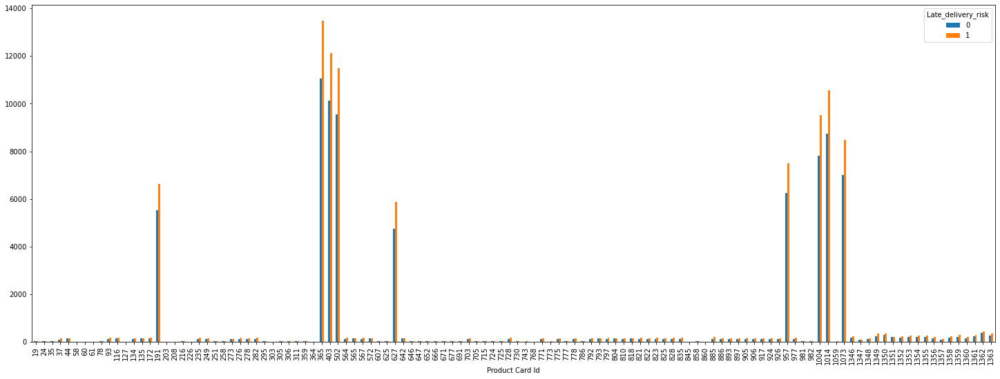

In [350]:
#Bivariate
tbl=pd.crosstab(data['Product Card Id'],data['Late_delivery_risk'])
tbl
tbl.plot(kind='bar')


In [351]:
#Statistical Test 
teststats,pvalue,dof,exp_value=chi2_contingency(tbl)
print(pvalue)

0.8164060393259804


In [352]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Product Card Id','Product code','Cannot be able to visualize','unsignificant(chi2_contingency)','No relevance']

# Feature :: 44 Product Category Id

In [353]:
data_dictionary.iloc[44,:]

FIELDS              Product Category Id
DESCRIPTION    :  Product category code
Name: 44, dtype: object

* this feature contain info of product category code

In [354]:
data['Product Category Id'].describe()

count    180519.000000
mean         31.851451
std          15.640064
min           2.000000
25%          18.000000
50%          29.000000
75%          45.000000
max          76.000000
Name: Product Category Id, dtype: float64

In [355]:
len(data['Product Category Id'].unique())

51

In [356]:
data['Product Category Id'].value_counts()

17    24551
18    22246
24    21035
46    19298
45    17325
48    15540
43    13729
9     12487
29    10984
37     2029
40     1780
36     1475
26     1201
13     1127
35     1070
41      974
75      838
63      652
76      650
3       632
7       614
62      592
74      529
33      524
72      492
66      484
68      484
67      483
64      442
32      441
44      440
71      434
65      431
12      423
59      405
38      384
69      362
73      357
5       343
6       328
11      309
30      283
61      271
70      208
60      207
31      181
2       138
10      111
16       68
4        67
34       61
Name: Product Category Id, dtype: int64

* cannot able to find any unique pattern

<AxesSubplot:xlabel='Product Category Id'>

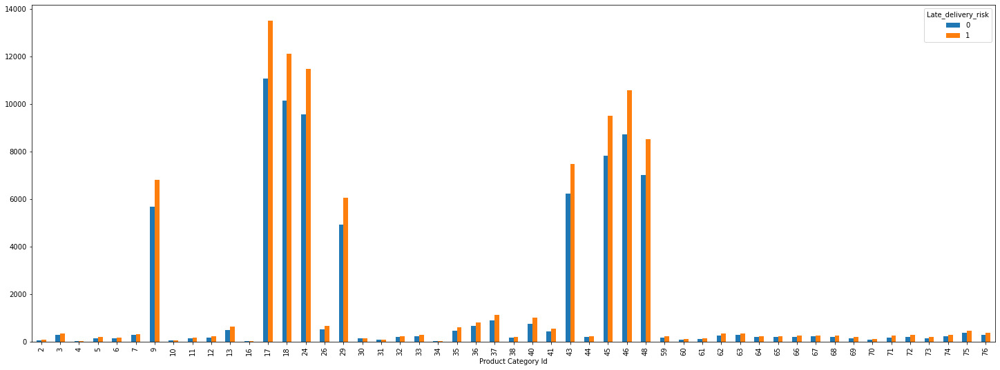

In [357]:
tbl = pd.crosstab(data['Product Category Id'],data['Late_delivery_risk'])
tbl.plot(kind='bar')

In [358]:
#Statistical test
stats,p,d,s=chi2_contingency(tbl)
print(p)

0.7468284823123976


In [359]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Product Category Id','Product category code','each class have almost equal delay ratio','unsignificant(chi2_contingency)','No relevance']

# Feature 45 :: Product Description

In [360]:
data_dictionary.iloc[45,:]

FIELDS            Product Description
DESCRIPTION    :  Product Description
Name: 45, dtype: object

In [361]:
data['Product Description'].isnull().sum() # feature have 100 percent mising values so we drop  it

180519

In [362]:
data.drop('Product Description',axis=1,inplace=True)

In [363]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Product Description','Product Description','100 percent mising values','not applicable','No relevance']

# Feature 46::Product Image

In [364]:
data_dictionary.iloc[46,:]

FIELDS                                        Product Image
DESCRIPTION    :  Link of visit and purchase of the product
Name: 46, dtype: object

* this feature contain information of Link of visit and purchase of the product
* this information is not usefull for us for us so we will drop it

In [365]:
data.drop('Product Image',axis=1,inplace=True)

In [366]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Product Image','Link of visit and purchase of the product','not applicable','not applicable','no impact on the business']

# feature 47 ::: Product Name

In [367]:
data_dictionary.iloc[47,:]

FIELDS            Product Name
DESCRIPTION    :  Product Name
Name: 47, dtype: object

* this feature contain information of Product name

In [368]:
data['Product Name'].isnull().sum()

0

In [369]:
data['Product Name'].describe()

count                               180519
unique                                 118
top       Perfect Fitness Perfect Rip Deck
freq                                 24515
Name: Product Name, dtype: object

In [370]:
data['Product Name'].value_counts()

Perfect Fitness Perfect Rip Deck                 24515
Nike Men's CJ Elite 2 TD Football Cleat          22246
Nike Men's Dri-FIT Victory Golf Polo             21035
O'Brien Men's Neoprene Life Vest                 19298
Field & Stream Sportsman 16 Gun Fire Safe        17325
Pelican Sunstream 100 Kayak                      15500
Diamondback Women's Serene Classic Comfort Bi    13729
Nike Men's Free 5.0+ Running Shoe                12169
Under Armour Girls' Toddler Spine Surge Runni    10617
Fighting video games                               838
Children's heaters                                 652
Summer dresses                                     650
Web Camera                                         592
Toys                                               529
Adult dog supplies                                 492
Lawn mower                                         484
Porcelain crafts                                   484
DVDs                                               483
Dell Lapto

* the platform have 118 diffrent product for the orders

<AxesSubplot:xlabel='Product Name'>

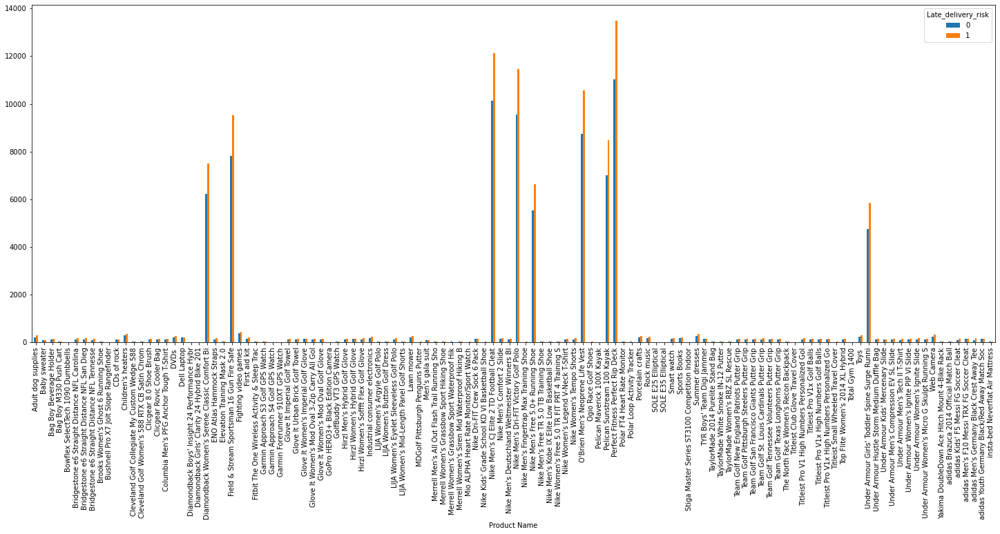

In [371]:
#Bivariate   
tbl=pd.crosstab(data['Product Name'],data['Late_delivery_risk'])
tbl
tbl.plot(kind='bar')

In [372]:
#Statistical Test
teststats,pvalue,dof,exp_value=chi2_contingency(tbl)
print(pvalue)

0.8164060393259804


In [373]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Product Name','Name of the product ','Cannot visulaize to many value','Unsignificant(chi2_contingency)','no impact on the business']

# feature 48:::Product Price

In [374]:
data_dictionary.iloc[48,:]

FIELDS            Product Price
DESCRIPTION    :  Product Price
Name: 48, dtype: object

* this feature contain information about the prices of diffrent products

In [375]:
data['Product Price'].head()

0    327.75
1    327.75
2    327.75
3    327.75
4    327.75
Name: Product Price, dtype: float64

In [376]:
data['Product Price'].describe()

count    180519.000000
mean        141.232550
std         139.732492
min           9.990000
25%          50.000000
50%          59.990002
75%         199.990005
max        1999.989990
Name: Product Price, dtype: float64

<AxesSubplot:xlabel='Product Price'>

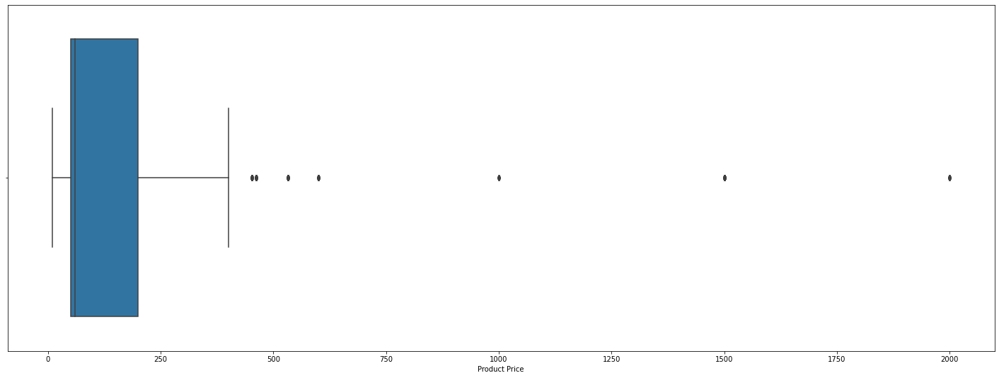

In [377]:
sns.boxplot(data['Product Price'])

<AxesSubplot:xlabel='Product Price', ylabel='Density'>

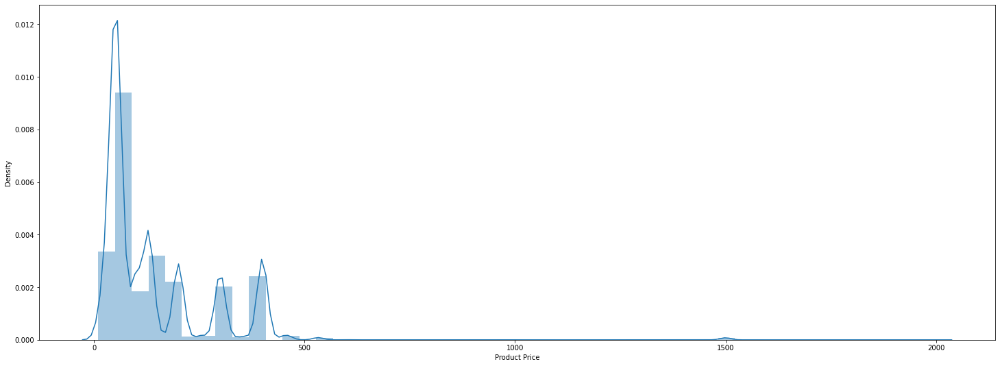

In [378]:
sns.distplot(data['Product Price'])

* the main price range is distributed upto 500 and there are product which have price much more than this

<AxesSubplot:xlabel='Late_delivery_risk', ylabel='Product Price'>

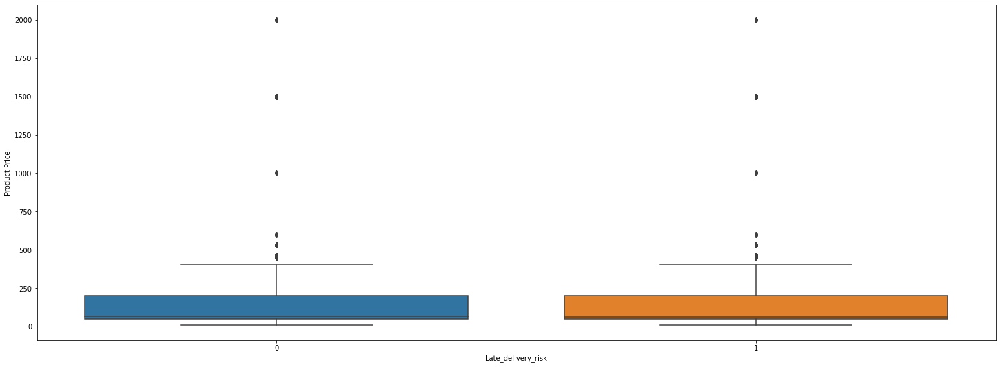

In [379]:
#Bivariante
sns.boxplot(data['Late_delivery_risk'],data['Product Price'])

In [380]:
#Statistical Test
model=sfa.ols("data['Product Price']~Late_delivery_risk",data = data).fit()
anova_lm(model)



,df,sum_sq,mean_sq,F,PR(>F)
Late_delivery_risk,1.0,1.667759e+04,16677.590266,0.854158,0.35538
Residual,180517.0,3.524628e+09,19525.185096,NaN,NaN


In [381]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Product_price','product_price ','uniform Distrubition on both','no relevence according the Annova','No relevance']

# Feature 49 :: Product Status

In [382]:
data_dictionary.iloc[49,:]

FIELDS                                            Product Status
DESCRIPTION    :  Status of the product stock :If it is 1 not...
Name: 49, dtype: object

* this feature contain information about the Status of the product stock :If it is 1 not in stock else 0

In [383]:
data['Product Status'].describe()

count    180519.0
mean          0.0
std           0.0
min           0.0
25%           0.0
50%           0.0
75%           0.0
max           0.0
Name: Product Status, dtype: float64

In [384]:
data['Product Status'].value_counts()

0    180519
Name: Product Status, dtype: int64

* it contain all values as 0 so we can drop it as we cannot gain anything out of it

In [385]:
data.drop('Product Status',axis=1,inplace=True)

In [386]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Product Status','Status of the product stock','Not applicable(All unique values)','Not applicable','May be']

# feature 50 ::: Shipping date (DateOrders)

In [387]:
data_dictionary.iloc[50,:]

FIELDS              Shipping date (DateOrders)   
DESCRIPTION    :  Exact date and time of shipment
Name: 50, dtype: object

* this Feature contain information of the Exact date and time of shipment

In [388]:
data['shipping date (DateOrders)']=data['shipping date (DateOrders)'].str.split(' ').str[0]

In [389]:
#for now we are considering it as significant and will see further

In [390]:
significant_feature.loc[len(significant_feature.index)]=['shipping date (DateOrders)','Exact date and time of shipment' ,'for now we are considering it as significant and will see further','---','---']

# Feature 51:: Shipping Mode

In [391]:
data_dictionary.iloc[51,:]

FIELDS                                             Shipping Mode
DESCRIPTION    :  The following shipping modes are presented ...
Name: 51, dtype: object

* this feature contain information about diffrent shipping modes are presented

In [392]:
data['Shipping Mode'].describe()

count             180519
unique                 4
top       Standard Class
freq              107752
Name: Shipping Mode, dtype: object

In [393]:
data['Shipping Mode'].value_counts()

Standard Class    107752
Second Class       35216
First Class        27814
Same Day            9737
Name: Shipping Mode, dtype: int64

<AxesSubplot:xlabel='Shipping Mode', ylabel='count'>

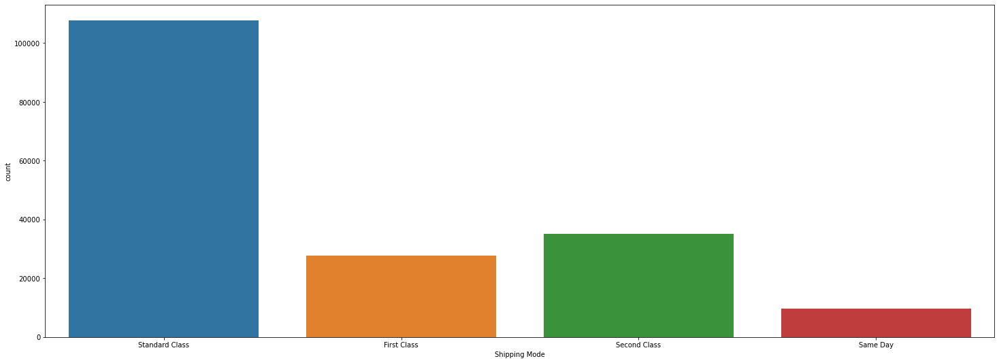

In [394]:
sns.countplot(data['Shipping Mode'])

* in mjority of the cases the shiping mode is standard class

<AxesSubplot:xlabel='Shipping Mode'>

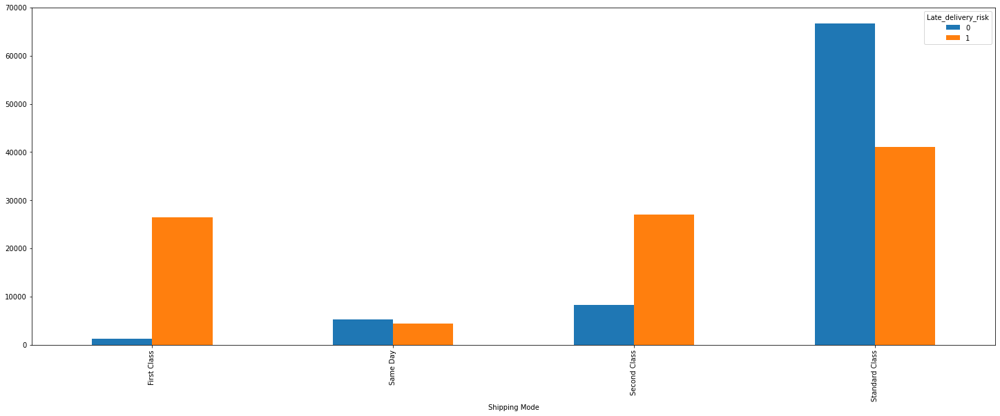

In [395]:
#statistical test
tb1=pd.crosstab(data['Shipping Mode'],data['Late_delivery_risk'])
tb1.plot(kind='bar')

In [396]:
#Statistical Test
teststats,pvalue,dof,exp_value=chi2_contingency(tb1)
print(pvalue)

0.0


In [397]:
significant_feature.loc[len(significant_feature.index)]=['Shipping Mode','Class of the shipping','non-uniform distribution','significant(chi2_contingency)','Relevance']

# feature 52 :: Order Zipcode

In [398]:
data['Order Zipcode'].describe()

count    24840.000000
mean     55426.132327
std      31919.279101
min       1040.000000
25%      23464.000000
50%      59405.000000
75%      90008.000000
max      99301.000000
Name: Order Zipcode, dtype: float64

In [399]:
data['Order Zipcode'].isnull().sum()/data.shape[0]

0.8623967560201419

* have 86  percent of null values so we have to drop it

In [400]:
data.drop('Order Zipcode',axis=1,inplace=True)

In [401]:
un_significant_feature.loc[len(un_significant_feature.index)]=['Order Zipcode','Order Zipcode','not applicable(86% of null values so we have to drop it)','Not applicable','May be']

In [402]:
un_significant_feature.to_csv('un_significant_feature.csv')

In [403]:
un_significant_feature

,feature name,description,bivarient observation,statical test,business relevence
0,Benefit per order,Earnings per order placed,it displays positive and negative values,unrelevant according to anova_lm,no relevance on delay
1,Sales per customer,Total sales per customer,it displays uniform distribution,unrelevant according to anova_lm,no relevance on delay
2,Customer Id,Product category code,it displays uniform distribution,unrelevant according to chi2,no relevance
3,Category Name,Description of the product category,it displays uniform distribution,unrelevant according to chi2,no relevance
4,Customer Country,Country where the customer made the purchase,it displays uniform distribution,unrelevant according to chi2,may impact delay
5,Customer Email,Email of customers,contain only XXXX for each observation,not applicable,not applicable
6,Customer Fname,First name of customers,contain unique first name,not applicable,not applicable
7,Customer Id,Id of customers,contain unique customer id,no relevance according to anova_lm,no relevance
8,Customer Password,Masked customer key,contain only XXXX for each observation,not applicable,not applicable
9,Customer Segment,Types of Customers,Uniform distribution among all segments,Unsignificant according to chi-square,Customer segment not impact delay


** Moving Forward with Significant features **

In [404]:
data_significant=data.loc[:,significant_feature["feature name"].values]


In [405]:
data_significant=pd.concat([data_significant,data['Late_delivery_risk']],axis=1)

In [406]:
#data_significant.to_csv("capstone_significant_data.csv")

In [407]:
#data_significant=pd.read_csv(r"capstone_significant_data.csv")

In [408]:
data_significant.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Delivery Status,Customer City,Customer Lname,Customer State,Customer Street,Market,Order City,Order Country,order date (DateOrders),Order Region,Order State,Order Status,shipping date (DateOrders),Shipping Mode,Late_delivery_risk
0,DEBIT,3,4,Advance shipping,66770,Holloway,PR,31,Pacific Asia,Bekasi,Indonesia,1/31/2018,Southeast Asia,Java Occidental,COMPLETE,2/3/2018,Standard Class,0
1,TRANSFER,5,4,Late delivery,66770,Luna,PR,60,Pacific Asia,Bikaner,India,1/13/2018,South Asia,Rajastán,PENDING,1/18/2018,Standard Class,1
2,CASH,4,4,Shipping on time,943,Maldonado,CA,7,Pacific Asia,Bikaner,India,1/13/2018,South Asia,Rajastán,CLOSED,1/17/2018,Standard Class,0
3,DEBIT,3,4,Advance shipping,3417,Tate,CA,77,Pacific Asia,Townsville,Australia,1/13/2018,Oceania,Queensland,COMPLETE,1/16/2018,Standard Class,0
4,PAYMENT,2,4,Advance shipping,66770,Hendricks,PR,19,Pacific Asia,Townsville,Australia,1/13/2018,Oceania,Queensland,PENDING_PAYMENT,1/15/2018,Standard Class,0


In [409]:
data_significant['customer  per city']=data_significant['Customer City']

In [410]:
data_significant['Customer Lname'].describe()

count     180511
unique      1109
top        Smith
freq       64104
Name: Customer Lname, dtype: object

In [411]:
data_significant['Customer Lname']=data_significant['Customer Lname'].fillna("Smith")

In [412]:
mapp=data_significant['Customer Lname'].value_counts([0])
data_significant['order per customer']=data_significant['Customer Lname'].apply(lambda x : mapp[x])

In [413]:
data_significant.drop(['Customer Lname','Customer City'],axis=1,inplace=True)

In [414]:
data_significant.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Delivery Status,Customer State,Customer Street,Market,Order City,Order Country,order date (DateOrders),Order Region,Order State,Order Status,shipping date (DateOrders),Shipping Mode,Late_delivery_risk,customer per city,order per customer
0,DEBIT,3,4,Advance shipping,PR,31,Pacific Asia,Bekasi,Indonesia,1/31/2018,Southeast Asia,Java Occidental,COMPLETE,2/3/2018,Standard Class,0,66770,0.000953
1,TRANSFER,5,4,Late delivery,PR,60,Pacific Asia,Bikaner,India,1/13/2018,South Asia,Rajastán,PENDING,1/18/2018,Standard Class,1,66770,0.000881
2,CASH,4,4,Shipping on time,CA,7,Pacific Asia,Bikaner,India,1/13/2018,South Asia,Rajastán,CLOSED,1/17/2018,Standard Class,0,943,0.000582
3,DEBIT,3,4,Advance shipping,CA,77,Pacific Asia,Townsville,Australia,1/13/2018,Oceania,Queensland,COMPLETE,1/16/2018,Standard Class,0,3417,0.000925
4,PAYMENT,2,4,Advance shipping,PR,19,Pacific Asia,Townsville,Australia,1/13/2018,Oceania,Queensland,PENDING_PAYMENT,1/15/2018,Standard Class,0,66770,0.000515


In [415]:
data_significant['Delivery Status'].value_counts()

Late delivery        98977
Advance shipping     41592
Shipping on time     32196
Shipping canceled     7754
Name: Delivery Status, dtype: int64

In [416]:
data_significant.groupby(['Delivery Status','Late_delivery_risk'])['Late_delivery_risk'].count()

Delivery Status    Late_delivery_risk
Advance shipping   0                     41592
Late delivery      1                     98977
Shipping canceled  0                      7754
Shipping on time   0                     32196
Name: Late_delivery_risk, dtype: int64

In [417]:
data_significant['Late_delivery_risk'].value_counts()

1    98977
0    81542
Name: Late_delivery_risk, dtype: int64

In [418]:
data_significant.drop(['Delivery Status'],axis=1,inplace=True)

# Feature Engineering

In [419]:
mapp=data_significant['Customer State'].value_counts([0])
data_significant['Customer per State']=data_significant['Customer State'].map(mapp)

In [420]:
mapp=data_significant['Customer Street'].value_counts([0])
data_significant['Customer per Street']=data_significant['Customer Street'].map(mapp)

In [421]:
mapp=data_significant['Order City'].value_counts([0])
data_significant['Order per City']=data_significant['Order City'].map(mapp)

In [422]:
mapp=data_significant['Order Country'].value_counts([0])
data_significant['Order per Country']=data_significant['Order Country'].map(mapp)

In [423]:
mapp=data_significant['Order Region'].value_counts([0])
data_significant['Order per Region']=data_significant['Order Region'].map(mapp)

In [424]:
mapp=data_significant['Order State'].value_counts([0])
data_significant['Order per State']=data_significant['Order State'].map(mapp)

In [425]:
data_significant = data_significant.drop('Customer State',axis=1)

In [426]:
data_significant.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Customer Street,Market,Order City,Order Country,order date (DateOrders),Order Region,Order State,...,Shipping Mode,Late_delivery_risk,customer per city,order per customer,Customer per State,Customer per Street,Order per City,Order per Country,Order per Region,Order per State
0,DEBIT,3,4,31,Pacific Asia,Bekasi,Indonesia,1/31/2018,Southeast Asia,Java Occidental,...,Standard Class,0,66770,0.000953,0.384297,0.020951,0.000997,0.023288,0.052842,0.004526
1,TRANSFER,5,4,60,Pacific Asia,Bikaner,India,1/13/2018,South Asia,Rajastán,...,Standard Class,1,66770,0.000881,0.384297,0.014624,0.000083,0.026496,0.042827,0.001728
2,CASH,4,4,7,Pacific Asia,Bikaner,India,1/13/2018,South Asia,Rajastán,...,Standard Class,0,943,0.000582,0.161883,0.005351,0.000083,0.026496,0.042827,0.001728
3,DEBIT,3,4,77,Pacific Asia,Townsville,Australia,1/13/2018,Oceania,Queensland,...,Standard Class,0,3417,0.000925,0.161883,0.003412,0.000632,0.047070,0.056216,0.012110
4,PAYMENT,2,4,19,Pacific Asia,Townsville,Australia,1/13/2018,Oceania,Queensland,...,Standard Class,0,66770,0.000515,0.384297,0.021998,0.000632,0.047070,0.056216,0.012110


In [427]:
pd.options.display.max_columns=30

In [428]:
pd.options.display.max_colwidth=100

In [429]:
significant_feature

,feature name,description,bivarient observation,statical test,business relevence
0,Type,Type of transaction made,diffrent type of transaction have diffrent delay ratio,relevent according to chi_square,can not conclude
1,Days for shipping (real),Days of actual shipping of the purchased,orders having more shipping day are mostly delayed,relevent according to chi2,more shipping day effect delay
2,Days for shipment (scheduled),Days of scheduled shipping of the purchased,sheduled shipping day 1 or 2 are prone to delay,relevent according to chi2,shipping day sheduled impact business
3,Delivery Status,Delivery status of orders,late delivery in Delivery Status have more late delivery risk,relevent according to chi2,Delivery Status have impact on business
4,Customer City,City where the customer made the purchase,cannot conclude from visuals,relevent according to chi2,Customer City impact on business
5,Customer Lname,Customer lastname,Cannot be able to visualize due to many unique values,relevent according to chi_square,we will try to extract some information
6,Customer State,State to which the store where the purchase,no uniform distribution,relevent according to chi_square,Customer State has an impact on business
7,Customer Street,Customer Street,Cannot be visualized due to many values,relevent according to chi_square,Customer Street has impact on business
8,Market,name of continent where they operate,Cannot be able to visualize due to many values,relevent according to chi_square,Market has impact on business
9,Order City,Name of the city from where the order is placed,Cannot visualize due to many values,relevent according to chi_square,Order City has impact on business


In [430]:
data_significant.columns

Index(['Type', 'Days for shipping (real)', 'Days for shipment (scheduled)',
       'Customer Street', 'Market', 'Order City', 'Order Country',
       'order date (DateOrders)', 'Order Region', 'Order State',
       'Order Status', 'shipping date (DateOrders)', 'Shipping Mode',
       'Late_delivery_risk', 'customer  per city', 'order per customer',
       'Customer per State', 'Customer per Street', 'Order per City',
       'Order per Country', 'Order per Region', 'Order per State'],
      dtype='object')

In [431]:
data_significant['customer  per city']=data_significant['customer  per city']/data_significant.shape[0]

In [432]:
data_significant.drop(['Order State','Customer Street','Order City',
       'Order Country', 'Order Region','Order Country'],axis=1 ,inplace=True)

In [433]:
data_significant.shape

(180519, 17)

In [434]:
data_significant['order date (DateOrders)']=pd.to_datetime(data_significant['order date (DateOrders)'])

In [435]:
data_significant['order_year']=data_significant['order date (DateOrders)'].dt.year

In [436]:
data_significant['order_month']=data_significant['order date (DateOrders)'].dt.month

In [437]:
data_significant['order_day']=data_significant['order date (DateOrders)'].dt.day

In [438]:
data_significant.drop(['order_year','shipping date (DateOrders)','order date (DateOrders)'],axis=1,inplace=True)

In [439]:
data_significant.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Market,Order Status,Shipping Mode,Late_delivery_risk,customer per city,order per customer,Customer per State,Customer per Street,Order per City,Order per Country,Order per Region,Order per State,order_month,order_day
0,DEBIT,3,4,Pacific Asia,COMPLETE,Standard Class,0,0.369878,0.000953,0.384297,0.020951,0.000997,0.023288,0.052842,0.004526,1,31
1,TRANSFER,5,4,Pacific Asia,PENDING,Standard Class,1,0.369878,0.000881,0.384297,0.014624,0.000083,0.026496,0.042827,0.001728,1,13
2,CASH,4,4,Pacific Asia,CLOSED,Standard Class,0,0.005224,0.000582,0.161883,0.005351,0.000083,0.026496,0.042827,0.001728,1,13
3,DEBIT,3,4,Pacific Asia,COMPLETE,Standard Class,0,0.018929,0.000925,0.161883,0.003412,0.000632,0.047070,0.056216,0.012110,1,13
4,PAYMENT,2,4,Pacific Asia,PENDING_PAYMENT,Standard Class,0,0.369878,0.000515,0.384297,0.021998,0.000632,0.047070,0.056216,0.012110,1,13


# Multicollinearity check

In [440]:
num_cols = data_significant.select_dtypes(np.number).columns

In [441]:
num_cols = ['Days for shipment (scheduled)',
       'customer  per city', 'order per customer', 'Customer per State',
       'Customer per Street', 'Order per City', 'Order per Country',
       'Order per Region', 'Order per State', 'order_month', 'order_day']

In [442]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [443]:
vif = pd.DataFrame({'features':num_cols})

In [444]:
vif['vif'] = [variance_inflation_factor(data_significant[num_cols].values,i) for i in range(len(num_cols))]

In [445]:
vif

,features,vif
0,Days for shipment (scheduled),4.586318
1,customer per city,11.207065
2,order per customer,1.527490
3,Customer per State,15.467236
4,Customer per Street,5.633784
5,Order per City,1.682528
6,Order per Country,2.271823
7,Order per Region,3.025102
8,Order per State,1.991706
9,order_month,3.720275


In [446]:
data_significant = data_significant.drop('Days for shipping (real)',axis=1)

In [447]:
num_cols = ['Days for shipment (scheduled)',
       'customer  per city', 'order per customer', 'Customer per State',
       'Customer per Street', 'Order per City', 'Order per Country',
       'Order per Region', 'Order per State', 'order_month', 'order_day']

In [448]:
vif = pd.DataFrame({'features':num_cols})
vif['vif'] = [variance_inflation_factor(data_significant[num_cols].values,i) for i in range(len(num_cols))]

In [449]:
vif

,features,vif
0,Days for shipment (scheduled),4.586318
1,customer per city,11.207065
2,order per customer,1.527490
3,Customer per State,15.467236
4,Customer per Street,5.633784
5,Order per City,1.682528
6,Order per Country,2.271823
7,Order per Region,3.025102
8,Order per State,1.991706
9,order_month,3.720275


In [450]:
num_cols = ['Days for shipment (scheduled)',
       'customer  per city', 'order per customer',
       'Customer per Street', 'Order per City', 'Order per Country',
       'Order per Region', 'Order per State', 'order_month', 'order_day']

In [451]:
vif = pd.DataFrame({'features':num_cols})
vif['vif'] = [variance_inflation_factor(data_significant[num_cols].values,i) for i in range(len(num_cols))]

In [452]:
vif

,features,vif
0,Days for shipment (scheduled),4.545984
1,customer per city,1.582334
2,order per customer,1.527401
3,Customer per Street,5.539048
4,Order per City,1.681463
5,Order per Country,2.267636
6,Order per Region,3.002335
7,Order per State,1.991696
8,order_month,3.675227
9,order_day,3.664753


In [453]:
data_significant.columns

Index(['Type', 'Days for shipment (scheduled)', 'Market', 'Order Status',
       'Shipping Mode', 'Late_delivery_risk', 'customer  per city',
       'order per customer', 'Customer per State', 'Customer per Street',
       'Order per City', 'Order per Country', 'Order per Region',
       'Order per State', 'order_month', 'order_day'],
      dtype='object')

In [454]:
data_significant = data_significant.drop('Customer per State',axis=1)

# Feature Encoding

In [455]:
dummy_data=pd.get_dummies(data_significant,drop_first=True)

In [456]:
dummy_data.shape

(180519, 29)

In [457]:
X=dummy_data.drop('Late_delivery_risk',axis=1)
y=dummy_data.Late_delivery_risk

# Train Test Split

In [458]:
from sklearn.model_selection import train_test_split

In [459]:
x_train,x_test,ytrain,ytest=train_test_split(X,y,test_size=.25,random_state=12,stratify=y)

In [460]:
import statsmodels.api as sm

In [461]:
x_train['const']=1
x_test['const']=1

In [462]:
x_train.columns

Index(['Days for shipment (scheduled)', 'customer  per city',
       'order per customer', 'Customer per Street', 'Order per City',
       'Order per Country', 'Order per Region', 'Order per State',
       'order_month', 'order_day', 'Type_DEBIT', 'Type_PAYMENT',
       'Type_TRANSFER', 'Market_Europe', 'Market_LATAM', 'Market_Pacific Asia',
       'Market_USCA', 'Order Status_CLOSED', 'Order Status_COMPLETE',
       'Order Status_ON_HOLD', 'Order Status_PAYMENT_REVIEW',
       'Order Status_PENDING', 'Order Status_PENDING_PAYMENT',
       'Order Status_PROCESSING', 'Order Status_SUSPECTED_FRAUD',
       'Shipping Mode_Same Day', 'Shipping Mode_Second Class',
       'Shipping Mode_Standard Class', 'const'],
      dtype='object')

# Base Model ----Logistic Regression

In [463]:
model=sm.Logit(ytrain,x_train).fit()

         Current function value: 0.513579
         Iterations: 35


C:\Users\jakha\Anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [464]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:     Late_delivery_risk   No. Observations:               135389
Model:                          Logit   Df Residuals:                   135364
Method:                           MLE   Df Model:                           24
Date:                Tue, 25 Oct 2022   Pseudo R-squ.:                  0.2540
Time:                        19:37:05   Log-Likelihood:                -69533.
converged:                      False   LL-Null:                       -93212.
Covariance Type:            nonrobust   LLR p-value:                     0.000
=================================================================================================
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Days for shipment (scheduled)    -6.0897        nan        nan        nan         nan         nan
customer  per city               -0.0142      0.036     -0.391      0.696      -0.085       0.057
order per customer                0.0423      0.038      1.117      0.264      -0.032       0.116
Customer per Street               0.6814      1.044      0.653      0.514      -1.365       2.728
Order per City                   -1.3289      2.578     -0.515      0.606      -6.381       3.724
Order per Country                 0.6646      0.343      1.938      0.053      -0.007       1.337
Order per Region                  0.1580      0.203      0.780      0.435      -0.239       0.555
Order per State                  -0.7320      0.851     -0.861      0.389      -2.399       0.935
order_month                      -0.0027      0.002     -1.162      0.245      -0.007       0.002
order_day                        -0.0003      0.001     -0.367      0.714      -0.002       0.001
Type_DEBIT                       12.9310        nan        nan        nan         nan         nan
Type_PAYMENT                     12.9316        nan        nan        nan         nan         nan
Type_TRANSFER                   -28.6261        nan        nan        nan         nan         nan
Market_Europe                    -0.0113      0.033     -0.343      0.731      -0.076       0.053
Market_LATAM                     -0.0403      0.036     -1.125      0.261      -0.110       0.030
Market_Pacific Asia               0.0066      0.030      0.222      0.824      -0.052       0.065
Market_USCA                      -0.0823      0.052     -1.595      0.111      -0.183       0.019
Order Status_CLOSED              19.3910        nan        nan        nan         nan         nan
Order Status_COMPLETE             6.4931        nan        nan        nan         nan         nan
Order Status_ON_HOLD              6.4379        nan        nan        nan         nan         nan
Order Status_PAYMENT_REVIEW       6.4015        nan        nan        nan         nan         nan
Order Status_PENDING             48.0804   2.27e+04      0.002      0.998   -4.44e+04    4.45e+04
Order Status_PENDING_PAYMENT      6.5300        nan        nan        nan         nan         nan
Order Status_PROCESSING          48.0437   2.27e+04      0.002      0.998   -4.44e+04    4.45e+04
Order Status_SUSPECTED_FRAUD    -27.5619   3.62e+08  -7.62e-08      1.000   -7.09e+08    7.09e+08
Shipping Mode_Same Day          -36.1337        nan        nan        nan         nan         nan
Shipping Mode_Second Class      -22.5041        nan        nan        nan         nan         nan
Shipping Mode_Standard Class    -12.1156        nan        nan        nan         nan         nan
const                            16.6274        nan        nan        nan         nan         nan
=================================================================================================

Possib

In [465]:
y_pred_train = model.predict(x_train)

In [466]:
y_pred_test = model.predict(x_test)

In [467]:
y_pred_train = [0 if i<0.5 else 1 for i in y_pred_train]
y_pred_test = [0 if i<0.5 else 1 for i in y_pred_test]

In [468]:
from sklearn.metrics import classification_report,accuracy_score

In [469]:
accuracy_score(ytrain,y_pred_train)             #accuracy score on train

0.7105377837195045

In [470]:
accuracy_score(ytest,y_pred_test)             #accuracy score on test

0.7100598271659649

In [471]:
print(classification_report(ytrain,y_pred_train))

              precision    recall  f1-score   support

           0       0.62      0.92      0.74     61156
           1       0.89      0.54      0.67     74233

    accuracy                           0.71    135389
   macro avg       0.75      0.73      0.71    135389
weighted avg       0.77      0.71      0.70    135389



In [472]:
print(classification_report(ytest,y_pred_test))

              precision    recall  f1-score   support

           0       0.62      0.92      0.74     20386
           1       0.89      0.54      0.67     24744

    accuracy                           0.71     45130
   macro avg       0.75      0.73      0.71     45130
weighted avg       0.77      0.71      0.70     45130



# Decision Tree

In [473]:
from sklearn.tree import DecisionTreeClassifier
dct=DecisionTreeClassifier()

In [474]:
x_train.drop('const',axis=1,inplace=True)
x_test.drop('const',axis=1,inplace=True)

In [475]:
dct.fit(x_train,ytrain)

DecisionTreeClassifier()

In [476]:
dct.score(x_train,ytrain)

0.9999852277511467

In [477]:
from sklearn.metrics import accuracy_score,f1_score

In [478]:
accuracy_score(ytest,dct.predict(x_test))

0.9441391535563927

In [479]:
f1_score(ytest,dct.predict(x_test))

0.9490429122955955

In [480]:
print(classification_report(ytest,dct.predict(x_test)))

              precision    recall  f1-score   support

           0       0.94      0.94      0.94     20386
           1       0.95      0.95      0.95     24744

    accuracy                           0.94     45130
   macro avg       0.94      0.94      0.94     45130
weighted avg       0.94      0.94      0.94     45130



In [481]:
print(classification_report(ytrain,dct.predict(x_train)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     61156
           1       1.00      1.00      1.00     74233

    accuracy                           1.00    135389
   macro avg       1.00      1.00      1.00    135389
weighted avg       1.00      1.00      1.00    135389



In [482]:
new_data = data_significant.drop('Order Status',axis=1)

In [483]:
new_data.columns

Index(['Type', 'Days for shipment (scheduled)', 'Market', 'Shipping Mode',
       'Late_delivery_risk', 'customer  per city', 'order per customer',
       'Customer per Street', 'Order per City', 'Order per Country',
       'Order per Region', 'Order per State', 'order_month', 'order_day'],
      dtype='object')

In [484]:
new_dummy = pd.get_dummies(new_data,drop_first=True)

In [485]:
x1 = new_dummy.drop('Late_delivery_risk',axis=1)
y1 = new_dummy['Late_delivery_risk']

# Multicollinearity Check

In [486]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame({'features':x1.columns})
vif['vif'] = [variance_inflation_factor(x1.values,i) for i in range(len(x1.columns))]
vif = vif.sort_values(by = 'vif',ascending=False)

In [487]:
vif

,features,vif
0,Days for shipment (scheduled),554.188062
19,Shipping Mode_Standard Class,312.759581
18,Shipping Mode_Second Class,15.171355
16,Market_USCA,7.928096
14,Market_LATAM,6.411653
5,Order per Country,5.282988
13,Market_Europe,5.266591
15,Market_Pacific Asia,3.800381
17,Shipping Mode_Same Day,3.466967
10,Type_DEBIT,2.793901


In [488]:
#lets drop
x1 = x1.drop('Days for shipment (scheduled)',axis=1)

In [489]:
vif = pd.DataFrame({'features':x1.columns})
vif['vif'] = [variance_inflation_factor(x1.values,i) for i in range(len(x1.columns))]
vif = vif.sort_values(by = 'vif',ascending=False)
vif

,features,vif
4,Order per Country,11.252304
5,Order per Region,8.928570
15,Market_USCA,8.407409
2,Customer per Street,6.467124
13,Market_LATAM,6.414002
12,Market_Europe,5.959016
7,order_month,5.231325
18,Shipping Mode_Standard Class,4.371550
8,order_day,3.950260
9,Type_DEBIT,3.910087


In [490]:
x1 = x1.drop('Order per Country',axis=1)

In [491]:
vif = pd.DataFrame({'features':x1.columns})
vif['vif'] = [variance_inflation_factor(x1.values,i) for i in range(len(x1.columns))]
vif = vif.sort_values(by = 'vif',ascending=False)
vif

,features,vif
4,Order per Region,6.634389
2,Customer per Street,6.466632
12,Market_LATAM,6.408870
11,Market_Europe,5.948257
6,order_month,5.223207
17,Shipping Mode_Standard Class,4.370178
7,order_day,3.949412
8,Type_DEBIT,3.909226
13,Market_Pacific Asia,3.459030
10,Type_TRANSFER,3.091562


# Model building after Multicollinearity Treatment

In [492]:
xtrain1,x_test1,ytrain1,y_test1 = train_test_split(x1,y1,test_size=0.25,random_state=7)

In [493]:
x_train1,x_cross,y_train1,y_cross = train_test_split(xtrain1,ytrain1,test_size=0.25,random_state=7)

In [494]:
x_train1.shape,x_test1.shape,y_train1.shape,y_test1.shape

((101541, 18), (45130, 18), (101541,), (45130,))

# Logistic Regression

In [495]:
model2 = sm.Logit(y_train1,x_train1).fit()

Optimization terminated successfully.
         Current function value: 0.578250
         Iterations 6


In [496]:
model2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:     Late_delivery_risk   No. Observations:               101541
Model:                          Logit   Df Residuals:                   101523
Method:                           MLE   Df Model:                           17
Date:                Tue, 25 Oct 2022   Pseudo R-squ.:                  0.1600
Time:                        19:37:38   Log-Likelihood:                -58716.
converged:                       True   LL-Null:                       -69899.
Covariance Type:            nonrobust   LLR p-value:                     0.000
================================================================================================
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
customer  per city               0.2180      0.040      5.484      0.000       0.140       0.296
order per customer               0.2984      0.041      7.202      0.000       0.217       0.380
Customer per Street             22.9194      1.090     21.031      0.000      20.783      25.055
Order per City                   5.5900      2.795      2.000      0.045       0.112      11.068
Order per Region                 1.0760      0.191      5.620      0.000       0.701       1.451
Order per State                  0.0885      0.897      0.099      0.921      -1.670       1.847
order_month                      0.0576      0.002     24.821      0.000       0.053       0.062
order_day                        0.0087      0.001     11.230      0.000       0.007       0.010
Type_DEBIT                       0.4783      0.023     20.959      0.000       0.434       0.523
Type_PAYMENT                     0.5119      0.025     20.780      0.000       0.464       0.560
Type_TRANSFER                    0.0313      0.024      1.307      0.191      -0.016       0.078
Market_Europe                    0.7650      0.034     22.811      0.000       0.699       0.831
Market_LATAM                     0.9755      0.035     28.217      0.000       0.908       1.043
Market_Pacific Asia              0.8776      0.029     30.581      0.000       0.821       0.934
Market_USCA                      0.9217      0.032     29.198      0.000       0.860       0.984
Shipping Mode_Same Day          -2.3138      0.036    -63.660      0.000      -2.385      -2.243
Shipping Mode_Second Class      -0.9193      0.029    -32.088      0.000      -0.975      -0.863
Shipping Mode_Standard Class    -2.6585      0.025   -104.967      0.000      -2.708      -2.609
================================================================================================
"""

In [497]:
y2 = [0 if i<0.5 else 1 for i in model2.predict(x_train1)]

In [498]:
print(classification_report(y_train1,y2))

              precision    recall  f1-score   support

           0       0.62      0.81      0.70     45819
           1       0.79      0.59      0.67     55722

    accuracy                           0.69    101541
   macro avg       0.70      0.70      0.69    101541
weighted avg       0.71      0.69      0.69    101541



In [499]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()

In [500]:
dt.fit(x_train1,y_train1)

DecisionTreeClassifier()

In [501]:
accuracy_score(y_train1,dt.predict(x_train1))

1.0

In [502]:
accuracy_score(y_test1,dt.predict(x_test1))

0.9079104808331487

In [503]:
score = pd.DataFrame(columns=['Modelname','accuracy on train','accuracy on test'])

In [504]:
score.loc[len(score)] = ['DecisionTreeClassifier',
                         accuracy_score(y_train1,dt.predict(x_train1)),accuracy_score(y_test1,dt.predict(x_test1))]

In [505]:
score

,Modelname,accuracy on train,accuracy on test
0,DecisionTreeClassifier,1.0,0.90791


In [506]:
#model is overfitting

# Random forest

In [507]:
from sklearn.ensemble import RandomForestClassifier
Rfmodel = RandomForestClassifier()

In [508]:
Rfmodel.fit(x_train1,y_train1)

RandomForestClassifier()

In [509]:
print(accuracy_score(y_train1,Rfmodel.predict(x_train1)))
print(accuracy_score(y_test1,Rfmodel.predict(x_test1)))

1.0
0.9235541768225127


In [510]:
#it is also overfitting

In [511]:
score.loc[len(score)] = ['RandomForestClassifier',
                         accuracy_score(y_train1,Rfmodel.predict(x_train1)),accuracy_score(y_test1,Rfmodel.predict(x_test1))]

In [512]:
#now applying boosting

# AdaBoostClassifier

In [513]:
from sklearn.ensemble import AdaBoostClassifier,GradientBoostingClassifier
from xgboost import XGBClassifier

In [514]:
abc = AdaBoostClassifier()
abc.fit(x_train1,y_train1)

AdaBoostClassifier()

In [515]:
print(accuracy_score(y_train1,abc.predict(x_train1)))
print(accuracy_score(y_test1,abc.predict(x_test1)))

0.6953250411163964
0.6926656326168845


In [516]:
score.loc[len(score)] = ['AdaBoostClassifier',
                         accuracy_score(y_train1,abc.predict(x_train1)),accuracy_score(y_test1,abc.predict(x_test1))]

# GradientBoostingClassifier

In [517]:
gbc = GradientBoostingClassifier()
gbc.fit(x_train1,y_train1)

GradientBoostingClassifier()

In [518]:
print(accuracy_score(y_train1,gbc.predict(x_train1)))
print(accuracy_score(y_test1,gbc.predict(x_test1)))

0.7000226509488778
0.6969643252825172


In [519]:
score.loc[len(score)] = ['GradientBoostingClassifier',
                         accuracy_score(y_train1,gbc.predict(x_train1)),accuracy_score(y_test1,gbc.predict(x_test1))]

# XGBClassifier

In [520]:
xgb = XGBClassifier()
xgb.fit(x_train1,y_train1)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [521]:
print(accuracy_score(y_train1,xgb.predict(x_train1)))
print(accuracy_score(y_test1,xgb.predict(x_test1)))

0.7842644842969835
0.7451362729891424


In [522]:
score.loc[len(score)] = ['XGBClassifier',
                         accuracy_score(y_train1,xgb.predict(x_train1)),accuracy_score(y_test1,xgb.predict(x_test1))]

# LGBMClassifier

In [523]:
from lightgbm import LGBMClassifier
lgbm = LGBMClassifier()

In [524]:
lgbm.fit(x_train1,y_train1)

LGBMClassifier()

In [525]:
print(accuracy_score(y_train1,lgbm.predict(x_train1)))
print(accuracy_score(y_test1,lgbm.predict(x_test1)))

0.7178676593691218
0.7074008420119654


In [526]:
pd.DataFrame(lgbm.predict(x_train1))

,0
0,0
1,0
2,1
3,1
4,0
5,1
6,0
7,1
8,0
9,0


In [527]:
y_train1

124482    0
109269    1
158471    1
28461     1
114507    1
101961    0
170650    0
38310     1
33460     1
159512    0
73731     1
7169      0
120762    0
93450     1
131421    1
27968     0
134208    0
124167    1
9266      1
139843    1
123364    0
83930     1
151784    1
94525     0
6741      0
38192     1
60549     0
17988     1
144622    1
94569     0
105355    1
118237    1
93723     0
143160    0
136418    0
129698    1
109558    0
166067    1
164626    0
125599    1
24711     1
149568    0
144190    1
166163    0
81319     0
141799    0
119872    1
55357     0
1098      1
137623    0
108       1
91385     0
60839     0
100225    1
153978    0
105675    1
176532    1
96992     1
146997    0
18742     1
47046     1
103567    0
22296     1
107587    0
37534     1
135165    0
16469     1
132125    0
22302     0
179235    1
130679    0
36678     1
163147    0
130940    1
49068     1
70448     0
84387     1
140513    1
80099     1
109727    1
35954     1
177653    1
102966    0
3850

In [528]:
score.loc[len(score)] = ['XGBClassifier',
                         accuracy_score(y_train1,xgb.predict(x_train1)),accuracy_score(y_test1,xgb.predict(x_test1))]

# Voting classifier

In [529]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import VotingClassifier

In [530]:
#model 
lr = LogisticRegression()
rf = RandomForestClassifier()
gbm = GradientBoostingClassifier()
xgb =  XGBClassifier(eval_metric = 'auc')
cboost = CatBoostClassifier(eval_metric = 'AUC')


In [531]:
#Lets build a voting classifier model
vc = VotingClassifier(estimators=[('lr',lr),('rf',rf),('gbm',gbm),('xgb',xgb),('cboost',cboost)])

In [532]:
vc.fit(x_train1,y_train1)

Learning rate set to 0.074092
0:	total: 1.43s	remaining: 23m 46s
1:	total: 1.46s	remaining: 12m 7s
2:	total: 1.48s	remaining: 8m 13s
3:	total: 1.51s	remaining: 6m 16s
4:	total: 1.54s	remaining: 5m 7s
5:	total: 1.6s	remaining: 4m 24s
6:	total: 1.65s	remaining: 3m 53s
7:	total: 1.68s	remaining: 3m 28s
8:	total: 1.73s	remaining: 3m 10s
9:	total: 1.76s	remaining: 2m 54s
10:	total: 1.79s	remaining: 2m 41s
11:	total: 1.82s	remaining: 2m 29s
12:	total: 1.85s	remaining: 2m 20s
13:	total: 1.88s	remaining: 2m 12s
14:	total: 1.91s	remaining: 2m 5s
15:	total: 1.93s	remaining: 1m 58s
16:	total: 1.96s	remaining: 1m 53s
17:	total: 1.99s	remaining: 1m 48s
18:	total: 2.02s	remaining: 1m 44s
19:	total: 2.05s	remaining: 1m 40s
20:	total: 2.08s	remaining: 1m 36s
21:	total: 2.1s	remaining: 1m 33s
22:	total: 2.13s	remaining: 1m 30s
23:	total: 2.16s	remaining: 1m 27s
24:	total: 2.19s	remaining: 1m 25s
25:	total: 2.21s	remaining: 1m 22s
26:	total: 2.24s	remaining: 1m 20s
27:	total: 2.27s	remaining: 1m 18s
28:

243:	total: 7.87s	remaining: 24.4s
244:	total: 7.89s	remaining: 24.3s
245:	total: 7.92s	remaining: 24.3s
246:	total: 7.94s	remaining: 24.2s
247:	total: 7.97s	remaining: 24.2s
248:	total: 8s	remaining: 24.1s
249:	total: 8.02s	remaining: 24.1s
250:	total: 8.05s	remaining: 24s
251:	total: 8.07s	remaining: 24s
252:	total: 8.09s	remaining: 23.9s
253:	total: 8.11s	remaining: 23.8s
254:	total: 8.13s	remaining: 23.8s
255:	total: 8.16s	remaining: 23.7s
256:	total: 8.19s	remaining: 23.7s
257:	total: 8.21s	remaining: 23.6s
258:	total: 8.24s	remaining: 23.6s
259:	total: 8.26s	remaining: 23.5s
260:	total: 8.29s	remaining: 23.5s
261:	total: 8.31s	remaining: 23.4s
262:	total: 8.34s	remaining: 23.4s
263:	total: 8.36s	remaining: 23.3s
264:	total: 8.39s	remaining: 23.3s
265:	total: 8.41s	remaining: 23.2s
266:	total: 8.44s	remaining: 23.2s
267:	total: 8.46s	remaining: 23.1s
268:	total: 8.49s	remaining: 23.1s
269:	total: 8.51s	remaining: 23s
270:	total: 8.54s	remaining: 23s
271:	total: 8.57s	remaining: 22

485:	total: 14s	remaining: 14.8s
486:	total: 14s	remaining: 14.8s
487:	total: 14s	remaining: 14.7s
488:	total: 14.1s	remaining: 14.7s
489:	total: 14.1s	remaining: 14.7s
490:	total: 14.1s	remaining: 14.6s
491:	total: 14.1s	remaining: 14.6s
492:	total: 14.1s	remaining: 14.5s
493:	total: 14.2s	remaining: 14.5s
494:	total: 14.2s	remaining: 14.5s
495:	total: 14.2s	remaining: 14.5s
496:	total: 14.3s	remaining: 14.4s
497:	total: 14.3s	remaining: 14.4s
498:	total: 14.3s	remaining: 14.4s
499:	total: 14.3s	remaining: 14.3s
500:	total: 14.4s	remaining: 14.3s
501:	total: 14.4s	remaining: 14.3s
502:	total: 14.4s	remaining: 14.2s
503:	total: 14.4s	remaining: 14.2s
504:	total: 14.5s	remaining: 14.2s
505:	total: 14.5s	remaining: 14.1s
506:	total: 14.5s	remaining: 14.1s
507:	total: 14.5s	remaining: 14.1s
508:	total: 14.6s	remaining: 14s
509:	total: 14.6s	remaining: 14s
510:	total: 14.6s	remaining: 14s
511:	total: 14.6s	remaining: 14s
512:	total: 14.7s	remaining: 13.9s
513:	total: 14.7s	remaining: 13.9s

722:	total: 20s	remaining: 7.66s
723:	total: 20s	remaining: 7.63s
724:	total: 20s	remaining: 7.6s
725:	total: 20.1s	remaining: 7.57s
726:	total: 20.1s	remaining: 7.54s
727:	total: 20.1s	remaining: 7.52s
728:	total: 20.1s	remaining: 7.49s
729:	total: 20.2s	remaining: 7.46s
730:	total: 20.2s	remaining: 7.43s
731:	total: 20.2s	remaining: 7.4s
732:	total: 20.2s	remaining: 7.37s
733:	total: 20.3s	remaining: 7.34s
734:	total: 20.3s	remaining: 7.32s
735:	total: 20.3s	remaining: 7.29s
736:	total: 20.3s	remaining: 7.26s
737:	total: 20.4s	remaining: 7.23s
738:	total: 20.4s	remaining: 7.2s
739:	total: 20.4s	remaining: 7.18s
740:	total: 20.4s	remaining: 7.15s
741:	total: 20.5s	remaining: 7.12s
742:	total: 20.5s	remaining: 7.09s
743:	total: 20.5s	remaining: 7.06s
744:	total: 20.6s	remaining: 7.03s
745:	total: 20.6s	remaining: 7.01s
746:	total: 20.6s	remaining: 6.98s
747:	total: 20.6s	remaining: 6.95s
748:	total: 20.7s	remaining: 6.92s
749:	total: 20.7s	remaining: 6.89s
750:	total: 20.7s	remaining: 

966:	total: 26.2s	remaining: 894ms
967:	total: 26.2s	remaining: 866ms
968:	total: 26.2s	remaining: 839ms
969:	total: 26.3s	remaining: 812ms
970:	total: 26.3s	remaining: 785ms
971:	total: 26.3s	remaining: 758ms
972:	total: 26.3s	remaining: 731ms
973:	total: 26.4s	remaining: 704ms
974:	total: 26.4s	remaining: 677ms
975:	total: 26.4s	remaining: 649ms
976:	total: 26.4s	remaining: 622ms
977:	total: 26.5s	remaining: 595ms
978:	total: 26.5s	remaining: 568ms
979:	total: 26.5s	remaining: 541ms
980:	total: 26.5s	remaining: 514ms
981:	total: 26.6s	remaining: 487ms
982:	total: 26.6s	remaining: 460ms
983:	total: 26.6s	remaining: 433ms
984:	total: 26.6s	remaining: 406ms
985:	total: 26.7s	remaining: 379ms
986:	total: 26.7s	remaining: 352ms
987:	total: 26.7s	remaining: 324ms
988:	total: 26.7s	remaining: 297ms
989:	total: 26.8s	remaining: 270ms
990:	total: 26.8s	remaining: 243ms
991:	total: 26.8s	remaining: 216ms
992:	total: 26.8s	remaining: 189ms
993:	total: 26.9s	remaining: 162ms
994:	total: 26.9s	re

VotingClassifier(estimators=[('lr', LogisticRegression()),
                             ('rf', RandomForestClassifier()),
                             ('gbm', GradientBoostingClassifier()),
                             ('xgb',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric='auc', gamma=None,
                                            gpu_id=None...
                                            learning_rate=None, max_bin=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=None,
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            n_estimators=100, n_jobs=None,
                                            num_parallel_tree=None,
                                            predictor=None, random_state=None,
                                            reg_alpha=None, reg_lambda=None, ...)),
                             ('cboost',
                              <catboost.core.CatBoostClassifier object at 0x000002099B1C5640>)])

In [533]:
print(accuracy_score(y_train1,vc.predict(x_train1)))
print(accuracy_score(y_test1,vc.predict(x_test1)))

0.7581765001329512
0.7334367383115444


In [534]:
score.loc[len(score)] = ['VotingClassifier',
                         accuracy_score(y_train1,vc.predict(x_train1)),accuracy_score(y_test1,vc.predict(x_test1))]

# Stacking Classifier

In [535]:
Classifiers = [('0.XGBoost' ,XGBClassifier()),
               ('1.CatBoost' ,CatBoostClassifier(max_depth=5)),
               ('2.Decision_tree' ,DecisionTreeClassifier(max_depth=9)),
               ('3.random_forest',RandomForestClassifier())]

In [536]:
from sklearn.ensemble import StackingClassifier
st=StackingClassifier(estimators=Classifiers)
modelst=st.fit(x_train1,y_train1)

Learning rate set to 0.074092
0:	learn: 0.6534472	total: 24.5ms	remaining: 24.5s
1:	learn: 0.6383386	total: 46.4ms	remaining: 23.1s
2:	learn: 0.6270415	total: 69.5ms	remaining: 23.1s
3:	learn: 0.6176084	total: 90.7ms	remaining: 22.6s
4:	learn: 0.6084864	total: 113ms	remaining: 22.4s
5:	learn: 0.6018382	total: 136ms	remaining: 22.6s
6:	learn: 0.5967284	total: 157ms	remaining: 22.3s
7:	learn: 0.5845050	total: 180ms	remaining: 22.4s
8:	learn: 0.5811077	total: 201ms	remaining: 22.2s
9:	learn: 0.5785025	total: 221ms	remaining: 21.9s
10:	learn: 0.5762190	total: 243ms	remaining: 21.8s
11:	learn: 0.5740757	total: 264ms	remaining: 21.7s
12:	learn: 0.5724745	total: 287ms	remaining: 21.8s
13:	learn: 0.5711228	total: 309ms	remaining: 21.7s
14:	learn: 0.5699466	total: 332ms	remaining: 21.8s
15:	learn: 0.5653963	total: 358ms	remaining: 22s
16:	learn: 0.5645448	total: 379ms	remaining: 21.9s
17:	learn: 0.5640482	total: 398ms	remaining: 21.7s
18:	learn: 0.5634848	total: 418ms	remaining: 21.6s
19:	learn

166:	learn: 0.5473609	total: 3.68s	remaining: 18.3s
167:	learn: 0.5472865	total: 3.7s	remaining: 18.3s
168:	learn: 0.5472001	total: 3.72s	remaining: 18.3s
169:	learn: 0.5471284	total: 3.74s	remaining: 18.3s
170:	learn: 0.5470685	total: 3.77s	remaining: 18.3s
171:	learn: 0.5470124	total: 3.79s	remaining: 18.2s
172:	learn: 0.5469232	total: 3.81s	remaining: 18.2s
173:	learn: 0.5468223	total: 3.83s	remaining: 18.2s
174:	learn: 0.5467364	total: 3.85s	remaining: 18.1s
175:	learn: 0.5466594	total: 3.87s	remaining: 18.1s
176:	learn: 0.5466041	total: 3.89s	remaining: 18.1s
177:	learn: 0.5465489	total: 3.91s	remaining: 18.1s
178:	learn: 0.5464834	total: 3.94s	remaining: 18.1s
179:	learn: 0.5464163	total: 3.96s	remaining: 18s
180:	learn: 0.5463252	total: 3.98s	remaining: 18s
181:	learn: 0.5462434	total: 4s	remaining: 18s
182:	learn: 0.5461722	total: 4.03s	remaining: 18s
183:	learn: 0.5460744	total: 4.05s	remaining: 17.9s
184:	learn: 0.5460010	total: 4.07s	remaining: 17.9s
185:	learn: 0.5459268	to

329:	learn: 0.5364903	total: 7.29s	remaining: 14.8s
330:	learn: 0.5364134	total: 7.31s	remaining: 14.8s
331:	learn: 0.5363451	total: 7.33s	remaining: 14.7s
332:	learn: 0.5362871	total: 7.35s	remaining: 14.7s
333:	learn: 0.5362496	total: 7.37s	remaining: 14.7s
334:	learn: 0.5361964	total: 7.39s	remaining: 14.7s
335:	learn: 0.5361452	total: 7.42s	remaining: 14.7s
336:	learn: 0.5360868	total: 7.44s	remaining: 14.6s
337:	learn: 0.5360209	total: 7.46s	remaining: 14.6s
338:	learn: 0.5359513	total: 7.48s	remaining: 14.6s
339:	learn: 0.5358905	total: 7.5s	remaining: 14.6s
340:	learn: 0.5358431	total: 7.53s	remaining: 14.5s
341:	learn: 0.5357744	total: 7.55s	remaining: 14.5s
342:	learn: 0.5357236	total: 7.57s	remaining: 14.5s
343:	learn: 0.5356336	total: 7.59s	remaining: 14.5s
344:	learn: 0.5355670	total: 7.61s	remaining: 14.5s
345:	learn: 0.5355009	total: 7.63s	remaining: 14.4s
346:	learn: 0.5354180	total: 7.65s	remaining: 14.4s
347:	learn: 0.5353631	total: 7.68s	remaining: 14.4s
348:	learn: 0

489:	learn: 0.5274441	total: 10.8s	remaining: 11.2s
490:	learn: 0.5273869	total: 10.8s	remaining: 11.2s
491:	learn: 0.5273245	total: 10.8s	remaining: 11.2s
492:	learn: 0.5272801	total: 10.9s	remaining: 11.2s
493:	learn: 0.5272314	total: 10.9s	remaining: 11.1s
494:	learn: 0.5271785	total: 10.9s	remaining: 11.1s
495:	learn: 0.5270952	total: 10.9s	remaining: 11.1s
496:	learn: 0.5270275	total: 10.9s	remaining: 11.1s
497:	learn: 0.5269638	total: 11s	remaining: 11.1s
498:	learn: 0.5269115	total: 11s	remaining: 11s
499:	learn: 0.5268539	total: 11s	remaining: 11s
500:	learn: 0.5267946	total: 11s	remaining: 11s
501:	learn: 0.5267600	total: 11.1s	remaining: 11s
502:	learn: 0.5267274	total: 11.1s	remaining: 10.9s
503:	learn: 0.5266700	total: 11.1s	remaining: 10.9s
504:	learn: 0.5266270	total: 11.1s	remaining: 10.9s
505:	learn: 0.5265813	total: 11.1s	remaining: 10.9s
506:	learn: 0.5265103	total: 11.2s	remaining: 10.9s
507:	learn: 0.5264471	total: 11.2s	remaining: 10.8s
508:	learn: 0.5263877	total:

655:	learn: 0.5187240	total: 14.4s	remaining: 7.57s
656:	learn: 0.5186704	total: 14.5s	remaining: 7.55s
657:	learn: 0.5186027	total: 14.5s	remaining: 7.53s
658:	learn: 0.5185442	total: 14.5s	remaining: 7.51s
659:	learn: 0.5184900	total: 14.6s	remaining: 7.5s
660:	learn: 0.5184373	total: 14.6s	remaining: 7.48s
661:	learn: 0.5183797	total: 14.6s	remaining: 7.46s
662:	learn: 0.5183498	total: 14.7s	remaining: 7.45s
663:	learn: 0.5182746	total: 14.7s	remaining: 7.43s
664:	learn: 0.5182312	total: 14.7s	remaining: 7.41s
665:	learn: 0.5181707	total: 14.7s	remaining: 7.39s
666:	learn: 0.5181157	total: 14.8s	remaining: 7.37s
667:	learn: 0.5180474	total: 14.8s	remaining: 7.35s
668:	learn: 0.5180277	total: 14.8s	remaining: 7.33s
669:	learn: 0.5179812	total: 14.8s	remaining: 7.31s
670:	learn: 0.5179473	total: 14.9s	remaining: 7.29s
671:	learn: 0.5178948	total: 14.9s	remaining: 7.27s
672:	learn: 0.5178500	total: 14.9s	remaining: 7.25s
673:	learn: 0.5178066	total: 15s	remaining: 7.23s
674:	learn: 0.5

819:	learn: 0.5109466	total: 18.3s	remaining: 4.03s
820:	learn: 0.5108885	total: 18.4s	remaining: 4s
821:	learn: 0.5108530	total: 18.4s	remaining: 3.98s
822:	learn: 0.5108148	total: 18.4s	remaining: 3.96s
823:	learn: 0.5107729	total: 18.4s	remaining: 3.94s
824:	learn: 0.5107334	total: 18.5s	remaining: 3.92s
825:	learn: 0.5106984	total: 18.5s	remaining: 3.89s
826:	learn: 0.5106739	total: 18.5s	remaining: 3.87s
827:	learn: 0.5106258	total: 18.5s	remaining: 3.85s
828:	learn: 0.5105769	total: 18.5s	remaining: 3.83s
829:	learn: 0.5105461	total: 18.6s	remaining: 3.8s
830:	learn: 0.5104939	total: 18.6s	remaining: 3.78s
831:	learn: 0.5104649	total: 18.6s	remaining: 3.76s
832:	learn: 0.5104250	total: 18.6s	remaining: 3.73s
833:	learn: 0.5103881	total: 18.7s	remaining: 3.71s
834:	learn: 0.5103166	total: 18.7s	remaining: 3.69s
835:	learn: 0.5102515	total: 18.7s	remaining: 3.67s
836:	learn: 0.5102167	total: 18.7s	remaining: 3.65s
837:	learn: 0.5101862	total: 18.7s	remaining: 3.62s
838:	learn: 0.51

979:	learn: 0.5040526	total: 22.2s	remaining: 453ms
980:	learn: 0.5039989	total: 22.2s	remaining: 431ms
981:	learn: 0.5039565	total: 22.3s	remaining: 408ms
982:	learn: 0.5039197	total: 22.3s	remaining: 385ms
983:	learn: 0.5038545	total: 22.3s	remaining: 363ms
984:	learn: 0.5038099	total: 22.3s	remaining: 340ms
985:	learn: 0.5037656	total: 22.3s	remaining: 317ms
986:	learn: 0.5037283	total: 22.4s	remaining: 295ms
987:	learn: 0.5036900	total: 22.4s	remaining: 272ms
988:	learn: 0.5036557	total: 22.4s	remaining: 249ms
989:	learn: 0.5036122	total: 22.4s	remaining: 227ms
990:	learn: 0.5035572	total: 22.5s	remaining: 204ms
991:	learn: 0.5035204	total: 22.5s	remaining: 181ms
992:	learn: 0.5034683	total: 22.5s	remaining: 159ms
993:	learn: 0.5034449	total: 22.5s	remaining: 136ms
994:	learn: 0.5033816	total: 22.6s	remaining: 113ms
995:	learn: 0.5033407	total: 22.6s	remaining: 90.8ms
996:	learn: 0.5033127	total: 22.6s	remaining: 68.1ms
997:	learn: 0.5032652	total: 22.6s	remaining: 45.4ms
998:	lear

142:	learn: 0.5495120	total: 2.79s	remaining: 16.7s
143:	learn: 0.5494339	total: 2.81s	remaining: 16.7s
144:	learn: 0.5493808	total: 2.83s	remaining: 16.7s
145:	learn: 0.5493193	total: 2.85s	remaining: 16.6s
146:	learn: 0.5492656	total: 2.87s	remaining: 16.6s
147:	learn: 0.5491934	total: 2.88s	remaining: 16.6s
148:	learn: 0.5491277	total: 2.9s	remaining: 16.6s
149:	learn: 0.5490569	total: 2.92s	remaining: 16.6s
150:	learn: 0.5489886	total: 2.94s	remaining: 16.6s
151:	learn: 0.5489306	total: 2.96s	remaining: 16.5s
152:	learn: 0.5488685	total: 2.98s	remaining: 16.5s
153:	learn: 0.5487763	total: 3s	remaining: 16.5s
154:	learn: 0.5487218	total: 3.02s	remaining: 16.4s
155:	learn: 0.5486664	total: 3.04s	remaining: 16.4s
156:	learn: 0.5486205	total: 3.06s	remaining: 16.4s
157:	learn: 0.5485541	total: 3.08s	remaining: 16.4s
158:	learn: 0.5484920	total: 3.1s	remaining: 16.4s
159:	learn: 0.5484307	total: 3.11s	remaining: 16.3s
160:	learn: 0.5483582	total: 3.13s	remaining: 16.3s
161:	learn: 0.548

310:	learn: 0.5381863	total: 5.97s	remaining: 13.2s
311:	learn: 0.5380907	total: 5.99s	remaining: 13.2s
312:	learn: 0.5380141	total: 6.01s	remaining: 13.2s
313:	learn: 0.5379358	total: 6.03s	remaining: 13.2s
314:	learn: 0.5378850	total: 6.05s	remaining: 13.2s
315:	learn: 0.5378091	total: 6.07s	remaining: 13.1s
316:	learn: 0.5377373	total: 6.09s	remaining: 13.1s
317:	learn: 0.5376924	total: 6.11s	remaining: 13.1s
318:	learn: 0.5376297	total: 6.13s	remaining: 13.1s
319:	learn: 0.5375611	total: 6.15s	remaining: 13.1s
320:	learn: 0.5375088	total: 6.17s	remaining: 13s
321:	learn: 0.5374404	total: 6.18s	remaining: 13s
322:	learn: 0.5373623	total: 6.2s	remaining: 13s
323:	learn: 0.5372980	total: 6.22s	remaining: 13s
324:	learn: 0.5372269	total: 6.24s	remaining: 13s
325:	learn: 0.5371519	total: 6.26s	remaining: 12.9s
326:	learn: 0.5370735	total: 6.28s	remaining: 12.9s
327:	learn: 0.5370019	total: 6.3s	remaining: 12.9s
328:	learn: 0.5369280	total: 6.31s	remaining: 12.9s
329:	learn: 0.5368720	to

476:	learn: 0.5283126	total: 9.15s	remaining: 10s
477:	learn: 0.5282857	total: 9.17s	remaining: 10s
478:	learn: 0.5282339	total: 9.19s	remaining: 10s
479:	learn: 0.5281623	total: 9.21s	remaining: 9.98s
480:	learn: 0.5280873	total: 9.23s	remaining: 9.96s
481:	learn: 0.5280391	total: 9.25s	remaining: 9.94s
482:	learn: 0.5279926	total: 9.27s	remaining: 9.92s
483:	learn: 0.5279428	total: 9.29s	remaining: 9.9s
484:	learn: 0.5278959	total: 9.31s	remaining: 9.88s
485:	learn: 0.5278461	total: 9.33s	remaining: 9.87s
486:	learn: 0.5277894	total: 9.35s	remaining: 9.85s
487:	learn: 0.5277420	total: 9.37s	remaining: 9.83s
488:	learn: 0.5276798	total: 9.38s	remaining: 9.81s
489:	learn: 0.5276194	total: 9.4s	remaining: 9.79s
490:	learn: 0.5275453	total: 9.42s	remaining: 9.77s
491:	learn: 0.5274800	total: 9.44s	remaining: 9.75s
492:	learn: 0.5274102	total: 9.46s	remaining: 9.73s
493:	learn: 0.5273633	total: 9.48s	remaining: 9.71s
494:	learn: 0.5273093	total: 9.5s	remaining: 9.69s
495:	learn: 0.5272575

642:	learn: 0.5194048	total: 12.4s	remaining: 6.88s
643:	learn: 0.5193634	total: 12.4s	remaining: 6.86s
644:	learn: 0.5193147	total: 12.4s	remaining: 6.84s
645:	learn: 0.5192614	total: 12.4s	remaining: 6.82s
646:	learn: 0.5192058	total: 12.5s	remaining: 6.8s
647:	learn: 0.5191522	total: 12.5s	remaining: 6.78s
648:	learn: 0.5191135	total: 12.5s	remaining: 6.76s
649:	learn: 0.5190728	total: 12.5s	remaining: 6.74s
650:	learn: 0.5190279	total: 12.5s	remaining: 6.72s
651:	learn: 0.5189688	total: 12.6s	remaining: 6.7s
652:	learn: 0.5189116	total: 12.6s	remaining: 6.68s
653:	learn: 0.5188707	total: 12.6s	remaining: 6.66s
654:	learn: 0.5188275	total: 12.6s	remaining: 6.64s
655:	learn: 0.5188107	total: 12.6s	remaining: 6.63s
656:	learn: 0.5187599	total: 12.7s	remaining: 6.6s
657:	learn: 0.5187400	total: 12.7s	remaining: 6.58s
658:	learn: 0.5187040	total: 12.7s	remaining: 6.57s
659:	learn: 0.5186604	total: 12.7s	remaining: 6.55s
660:	learn: 0.5186165	total: 12.7s	remaining: 6.53s
661:	learn: 0.5

811:	learn: 0.5112439	total: 15.6s	remaining: 3.62s
812:	learn: 0.5112028	total: 15.6s	remaining: 3.6s
813:	learn: 0.5111588	total: 15.7s	remaining: 3.58s
814:	learn: 0.5111190	total: 15.7s	remaining: 3.56s
815:	learn: 0.5110654	total: 15.7s	remaining: 3.54s
816:	learn: 0.5110279	total: 15.7s	remaining: 3.52s
817:	learn: 0.5109793	total: 15.7s	remaining: 3.5s
818:	learn: 0.5109406	total: 15.8s	remaining: 3.48s
819:	learn: 0.5108894	total: 15.8s	remaining: 3.46s
820:	learn: 0.5108525	total: 15.8s	remaining: 3.44s
821:	learn: 0.5107670	total: 15.8s	remaining: 3.43s
822:	learn: 0.5107141	total: 15.8s	remaining: 3.41s
823:	learn: 0.5106763	total: 15.9s	remaining: 3.39s
824:	learn: 0.5106484	total: 15.9s	remaining: 3.37s
825:	learn: 0.5105862	total: 15.9s	remaining: 3.35s
826:	learn: 0.5105513	total: 15.9s	remaining: 3.33s
827:	learn: 0.5105179	total: 15.9s	remaining: 3.31s
828:	learn: 0.5104861	total: 16s	remaining: 3.29s
829:	learn: 0.5104431	total: 16s	remaining: 3.27s
830:	learn: 0.5104

974:	learn: 0.5040065	total: 18.8s	remaining: 481ms
975:	learn: 0.5039645	total: 18.8s	remaining: 462ms
976:	learn: 0.5039143	total: 18.8s	remaining: 443ms
977:	learn: 0.5038826	total: 18.8s	remaining: 424ms
978:	learn: 0.5038392	total: 18.8s	remaining: 404ms
979:	learn: 0.5038025	total: 18.9s	remaining: 385ms
980:	learn: 0.5037540	total: 18.9s	remaining: 366ms
981:	learn: 0.5037195	total: 18.9s	remaining: 347ms
982:	learn: 0.5036746	total: 18.9s	remaining: 327ms
983:	learn: 0.5036400	total: 18.9s	remaining: 308ms
984:	learn: 0.5035958	total: 19s	remaining: 289ms
985:	learn: 0.5035367	total: 19s	remaining: 270ms
986:	learn: 0.5034901	total: 19s	remaining: 250ms
987:	learn: 0.5034260	total: 19s	remaining: 231ms
988:	learn: 0.5033947	total: 19s	remaining: 212ms
989:	learn: 0.5033318	total: 19.1s	remaining: 193ms
990:	learn: 0.5032969	total: 19.1s	remaining: 173ms
991:	learn: 0.5032405	total: 19.1s	remaining: 154ms
992:	learn: 0.5031830	total: 19.1s	remaining: 135ms
993:	learn: 0.5031367	

143:	learn: 0.5500430	total: 2.75s	remaining: 16.4s
144:	learn: 0.5499739	total: 2.77s	remaining: 16.3s
145:	learn: 0.5499247	total: 2.79s	remaining: 16.3s
146:	learn: 0.5498764	total: 2.81s	remaining: 16.3s
147:	learn: 0.5498175	total: 2.83s	remaining: 16.3s
148:	learn: 0.5497620	total: 2.85s	remaining: 16.3s
149:	learn: 0.5496890	total: 2.87s	remaining: 16.2s
150:	learn: 0.5496502	total: 2.89s	remaining: 16.2s
151:	learn: 0.5495944	total: 2.9s	remaining: 16.2s
152:	learn: 0.5495254	total: 2.92s	remaining: 16.2s
153:	learn: 0.5494680	total: 2.94s	remaining: 16.2s
154:	learn: 0.5493756	total: 2.96s	remaining: 16.1s
155:	learn: 0.5493253	total: 2.98s	remaining: 16.1s
156:	learn: 0.5492664	total: 3s	remaining: 16.1s
157:	learn: 0.5491897	total: 3.02s	remaining: 16.1s
158:	learn: 0.5491308	total: 3.04s	remaining: 16.1s
159:	learn: 0.5490511	total: 3.06s	remaining: 16.1s
160:	learn: 0.5489921	total: 3.08s	remaining: 16.1s
161:	learn: 0.5489163	total: 3.1s	remaining: 16s
162:	learn: 0.54885

308:	learn: 0.5388467	total: 5.94s	remaining: 13.3s
309:	learn: 0.5387714	total: 5.96s	remaining: 13.3s
310:	learn: 0.5386684	total: 5.97s	remaining: 13.2s
311:	learn: 0.5386072	total: 6s	remaining: 13.2s
312:	learn: 0.5385416	total: 6.01s	remaining: 13.2s
313:	learn: 0.5384631	total: 6.04s	remaining: 13.2s
314:	learn: 0.5383967	total: 6.06s	remaining: 13.2s
315:	learn: 0.5383351	total: 6.08s	remaining: 13.2s
316:	learn: 0.5382732	total: 6.1s	remaining: 13.1s
317:	learn: 0.5382107	total: 6.12s	remaining: 13.1s
318:	learn: 0.5381390	total: 6.13s	remaining: 13.1s
319:	learn: 0.5380739	total: 6.15s	remaining: 13.1s
320:	learn: 0.5380190	total: 6.17s	remaining: 13.1s
321:	learn: 0.5379422	total: 6.19s	remaining: 13s
322:	learn: 0.5378952	total: 6.21s	remaining: 13s
323:	learn: 0.5378242	total: 6.23s	remaining: 13s
324:	learn: 0.5377699	total: 6.25s	remaining: 13s
325:	learn: 0.5376923	total: 6.27s	remaining: 13s
326:	learn: 0.5376288	total: 6.29s	remaining: 12.9s
327:	learn: 0.5375036	tota

474:	learn: 0.5290907	total: 9.14s	remaining: 10.1s
475:	learn: 0.5290159	total: 9.16s	remaining: 10.1s
476:	learn: 0.5289700	total: 9.18s	remaining: 10.1s
477:	learn: 0.5289100	total: 9.2s	remaining: 10s
478:	learn: 0.5288803	total: 9.22s	remaining: 10s
479:	learn: 0.5288387	total: 9.24s	remaining: 10s
480:	learn: 0.5287768	total: 9.26s	remaining: 9.99s
481:	learn: 0.5287161	total: 9.28s	remaining: 9.97s
482:	learn: 0.5286506	total: 9.3s	remaining: 9.95s
483:	learn: 0.5286134	total: 9.32s	remaining: 9.94s
484:	learn: 0.5285683	total: 9.34s	remaining: 9.91s
485:	learn: 0.5284804	total: 9.35s	remaining: 9.89s
486:	learn: 0.5284223	total: 9.37s	remaining: 9.87s
487:	learn: 0.5283597	total: 9.39s	remaining: 9.85s
488:	learn: 0.5283002	total: 9.41s	remaining: 9.83s
489:	learn: 0.5282528	total: 9.43s	remaining: 9.81s
490:	learn: 0.5281954	total: 9.45s	remaining: 9.79s
491:	learn: 0.5281346	total: 9.47s	remaining: 9.78s
492:	learn: 0.5280683	total: 9.49s	remaining: 9.76s
493:	learn: 0.528005

639:	learn: 0.5205000	total: 12.3s	remaining: 6.95s
640:	learn: 0.5204550	total: 12.4s	remaining: 6.92s
641:	learn: 0.5204102	total: 12.4s	remaining: 6.91s
642:	learn: 0.5203618	total: 12.4s	remaining: 6.89s
643:	learn: 0.5203277	total: 12.4s	remaining: 6.87s
644:	learn: 0.5202909	total: 12.4s	remaining: 6.85s
645:	learn: 0.5202526	total: 12.5s	remaining: 6.83s
646:	learn: 0.5201993	total: 12.5s	remaining: 6.81s
647:	learn: 0.5201706	total: 12.5s	remaining: 6.79s
648:	learn: 0.5201258	total: 12.5s	remaining: 6.77s
649:	learn: 0.5200776	total: 12.5s	remaining: 6.75s
650:	learn: 0.5200337	total: 12.6s	remaining: 6.73s
651:	learn: 0.5199654	total: 12.6s	remaining: 6.71s
652:	learn: 0.5199295	total: 12.6s	remaining: 6.69s
653:	learn: 0.5198754	total: 12.6s	remaining: 6.67s
654:	learn: 0.5198220	total: 12.6s	remaining: 6.65s
655:	learn: 0.5197755	total: 12.7s	remaining: 6.63s
656:	learn: 0.5197350	total: 12.7s	remaining: 6.61s
657:	learn: 0.5196887	total: 12.7s	remaining: 6.59s
658:	learn: 

808:	learn: 0.5124886	total: 15.6s	remaining: 3.68s
809:	learn: 0.5124385	total: 15.6s	remaining: 3.66s
810:	learn: 0.5123654	total: 15.6s	remaining: 3.64s
811:	learn: 0.5123271	total: 15.7s	remaining: 3.62s
812:	learn: 0.5122861	total: 15.7s	remaining: 3.6s
813:	learn: 0.5122478	total: 15.7s	remaining: 3.58s
814:	learn: 0.5121920	total: 15.7s	remaining: 3.57s
815:	learn: 0.5121297	total: 15.7s	remaining: 3.55s
816:	learn: 0.5121036	total: 15.7s	remaining: 3.53s
817:	learn: 0.5120510	total: 15.8s	remaining: 3.51s
818:	learn: 0.5120050	total: 15.8s	remaining: 3.49s
819:	learn: 0.5119574	total: 15.8s	remaining: 3.47s
820:	learn: 0.5119004	total: 15.8s	remaining: 3.45s
821:	learn: 0.5118638	total: 15.8s	remaining: 3.43s
822:	learn: 0.5118152	total: 15.9s	remaining: 3.41s
823:	learn: 0.5117593	total: 15.9s	remaining: 3.39s
824:	learn: 0.5117369	total: 15.9s	remaining: 3.37s
825:	learn: 0.5116969	total: 15.9s	remaining: 3.35s
826:	learn: 0.5116635	total: 15.9s	remaining: 3.33s
827:	learn: 0

973:	learn: 0.5049958	total: 18.8s	remaining: 501ms
974:	learn: 0.5049546	total: 18.8s	remaining: 482ms
975:	learn: 0.5048964	total: 18.8s	remaining: 463ms
976:	learn: 0.5048357	total: 18.8s	remaining: 443ms
977:	learn: 0.5047899	total: 18.9s	remaining: 424ms
978:	learn: 0.5047349	total: 18.9s	remaining: 405ms
979:	learn: 0.5046971	total: 18.9s	remaining: 386ms
980:	learn: 0.5046484	total: 18.9s	remaining: 366ms
981:	learn: 0.5045862	total: 18.9s	remaining: 347ms
982:	learn: 0.5045339	total: 18.9s	remaining: 328ms
983:	learn: 0.5044716	total: 19s	remaining: 308ms
984:	learn: 0.5044247	total: 19s	remaining: 289ms
985:	learn: 0.5043866	total: 19s	remaining: 270ms
986:	learn: 0.5043606	total: 19s	remaining: 251ms
987:	learn: 0.5043208	total: 19s	remaining: 231ms
988:	learn: 0.5042730	total: 19.1s	remaining: 212ms
989:	learn: 0.5042396	total: 19.1s	remaining: 193ms
990:	learn: 0.5041953	total: 19.1s	remaining: 174ms
991:	learn: 0.5041280	total: 19.1s	remaining: 154ms
992:	learn: 0.5040639	

135:	learn: 0.5502841	total: 2.58s	remaining: 16.4s
136:	learn: 0.5502232	total: 2.6s	remaining: 16.4s
137:	learn: 0.5501560	total: 2.62s	remaining: 16.4s
138:	learn: 0.5500702	total: 2.64s	remaining: 16.4s
139:	learn: 0.5500226	total: 2.66s	remaining: 16.4s
140:	learn: 0.5499436	total: 2.68s	remaining: 16.3s
141:	learn: 0.5498950	total: 2.7s	remaining: 16.3s
142:	learn: 0.5498343	total: 2.72s	remaining: 16.3s
143:	learn: 0.5497548	total: 2.74s	remaining: 16.3s
144:	learn: 0.5497079	total: 2.76s	remaining: 16.3s
145:	learn: 0.5496441	total: 2.78s	remaining: 16.2s
146:	learn: 0.5495900	total: 2.79s	remaining: 16.2s
147:	learn: 0.5495364	total: 2.81s	remaining: 16.2s
148:	learn: 0.5494810	total: 2.83s	remaining: 16.1s
149:	learn: 0.5494215	total: 2.85s	remaining: 16.1s
150:	learn: 0.5493580	total: 2.87s	remaining: 16.1s
151:	learn: 0.5492738	total: 2.89s	remaining: 16.1s
152:	learn: 0.5492108	total: 2.91s	remaining: 16.1s
153:	learn: 0.5491327	total: 2.92s	remaining: 16.1s
154:	learn: 0.

300:	learn: 0.5393919	total: 5.78s	remaining: 13.4s
301:	learn: 0.5393247	total: 5.8s	remaining: 13.4s
302:	learn: 0.5392654	total: 5.82s	remaining: 13.4s
303:	learn: 0.5392074	total: 5.84s	remaining: 13.4s
304:	learn: 0.5391535	total: 5.86s	remaining: 13.3s
305:	learn: 0.5390970	total: 5.88s	remaining: 13.3s
306:	learn: 0.5390252	total: 5.9s	remaining: 13.3s
307:	learn: 0.5389820	total: 5.91s	remaining: 13.3s
308:	learn: 0.5388904	total: 5.93s	remaining: 13.3s
309:	learn: 0.5388346	total: 5.95s	remaining: 13.2s
310:	learn: 0.5387687	total: 5.97s	remaining: 13.2s
311:	learn: 0.5387384	total: 5.99s	remaining: 13.2s
312:	learn: 0.5386603	total: 6.01s	remaining: 13.2s
313:	learn: 0.5386119	total: 6.03s	remaining: 13.2s
314:	learn: 0.5385582	total: 6.05s	remaining: 13.1s
315:	learn: 0.5385045	total: 6.07s	remaining: 13.1s
316:	learn: 0.5384343	total: 6.08s	remaining: 13.1s
317:	learn: 0.5383742	total: 6.1s	remaining: 13.1s
318:	learn: 0.5382996	total: 6.12s	remaining: 13.1s
319:	learn: 0.5

464:	learn: 0.5298298	total: 8.94s	remaining: 10.3s
465:	learn: 0.5297947	total: 8.96s	remaining: 10.3s
466:	learn: 0.5297445	total: 8.98s	remaining: 10.2s
467:	learn: 0.5296805	total: 9s	remaining: 10.2s
468:	learn: 0.5296415	total: 9.02s	remaining: 10.2s
469:	learn: 0.5295910	total: 9.04s	remaining: 10.2s
470:	learn: 0.5295337	total: 9.06s	remaining: 10.2s
471:	learn: 0.5294747	total: 9.08s	remaining: 10.2s
472:	learn: 0.5294387	total: 9.1s	remaining: 10.1s
473:	learn: 0.5294001	total: 9.12s	remaining: 10.1s
474:	learn: 0.5293467	total: 9.13s	remaining: 10.1s
475:	learn: 0.5292940	total: 9.15s	remaining: 10.1s
476:	learn: 0.5292120	total: 9.18s	remaining: 10.1s
477:	learn: 0.5291691	total: 9.2s	remaining: 10s
478:	learn: 0.5291174	total: 9.21s	remaining: 10s
479:	learn: 0.5290792	total: 9.23s	remaining: 10s
480:	learn: 0.5290242	total: 9.25s	remaining: 9.98s
481:	learn: 0.5289764	total: 9.27s	remaining: 9.97s
482:	learn: 0.5289480	total: 9.29s	remaining: 9.95s
483:	learn: 0.5289013	t

629:	learn: 0.5211555	total: 12.1s	remaining: 7.13s
630:	learn: 0.5210952	total: 12.2s	remaining: 7.11s
631:	learn: 0.5210231	total: 12.2s	remaining: 7.08s
632:	learn: 0.5209660	total: 12.2s	remaining: 7.07s
633:	learn: 0.5209062	total: 12.2s	remaining: 7.05s
634:	learn: 0.5208520	total: 12.2s	remaining: 7.03s
635:	learn: 0.5207871	total: 12.2s	remaining: 7.01s
636:	learn: 0.5207525	total: 12.3s	remaining: 6.99s
637:	learn: 0.5207114	total: 12.3s	remaining: 6.97s
638:	learn: 0.5206414	total: 12.3s	remaining: 6.95s
639:	learn: 0.5205923	total: 12.3s	remaining: 6.93s
640:	learn: 0.5205590	total: 12.3s	remaining: 6.91s
641:	learn: 0.5205227	total: 12.4s	remaining: 6.89s
642:	learn: 0.5204639	total: 12.4s	remaining: 6.87s
643:	learn: 0.5204242	total: 12.4s	remaining: 6.85s
644:	learn: 0.5203744	total: 12.4s	remaining: 6.84s
645:	learn: 0.5203208	total: 12.4s	remaining: 6.82s
646:	learn: 0.5202551	total: 12.5s	remaining: 6.8s
647:	learn: 0.5201890	total: 12.5s	remaining: 6.78s
648:	learn: 0

791:	learn: 0.5127437	total: 15.3s	remaining: 4.01s
792:	learn: 0.5126973	total: 15.3s	remaining: 3.99s
793:	learn: 0.5126524	total: 15.3s	remaining: 3.97s
794:	learn: 0.5126073	total: 15.3s	remaining: 3.96s
795:	learn: 0.5125664	total: 15.4s	remaining: 3.94s
796:	learn: 0.5125228	total: 15.4s	remaining: 3.92s
797:	learn: 0.5124988	total: 15.4s	remaining: 3.9s
798:	learn: 0.5124633	total: 15.4s	remaining: 3.88s
799:	learn: 0.5124272	total: 15.4s	remaining: 3.86s
800:	learn: 0.5123747	total: 15.5s	remaining: 3.84s
801:	learn: 0.5123351	total: 15.5s	remaining: 3.82s
802:	learn: 0.5122909	total: 15.5s	remaining: 3.8s
803:	learn: 0.5122362	total: 15.5s	remaining: 3.78s
804:	learn: 0.5121983	total: 15.5s	remaining: 3.76s
805:	learn: 0.5121493	total: 15.6s	remaining: 3.74s
806:	learn: 0.5121091	total: 15.6s	remaining: 3.73s
807:	learn: 0.5120689	total: 15.6s	remaining: 3.71s
808:	learn: 0.5119942	total: 15.6s	remaining: 3.69s
809:	learn: 0.5119352	total: 15.6s	remaining: 3.67s
810:	learn: 0.

953:	learn: 0.5053390	total: 18.4s	remaining: 889ms
954:	learn: 0.5053022	total: 18.4s	remaining: 869ms
955:	learn: 0.5052486	total: 18.5s	remaining: 850ms
956:	learn: 0.5052247	total: 18.5s	remaining: 830ms
957:	learn: 0.5051788	total: 18.5s	remaining: 811ms
958:	learn: 0.5051312	total: 18.5s	remaining: 792ms
959:	learn: 0.5050969	total: 18.5s	remaining: 772ms
960:	learn: 0.5050534	total: 18.6s	remaining: 753ms
961:	learn: 0.5050153	total: 18.6s	remaining: 734ms
962:	learn: 0.5049809	total: 18.6s	remaining: 715ms
963:	learn: 0.5049449	total: 18.6s	remaining: 695ms
964:	learn: 0.5049080	total: 18.6s	remaining: 676ms
965:	learn: 0.5048764	total: 18.7s	remaining: 657ms
966:	learn: 0.5048524	total: 18.7s	remaining: 637ms
967:	learn: 0.5048146	total: 18.7s	remaining: 618ms
968:	learn: 0.5047669	total: 18.7s	remaining: 599ms
969:	learn: 0.5047441	total: 18.7s	remaining: 579ms
970:	learn: 0.5047038	total: 18.8s	remaining: 560ms
971:	learn: 0.5046802	total: 18.8s	remaining: 541ms
972:	learn: 

122:	learn: 0.5493283	total: 2.35s	remaining: 16.8s
123:	learn: 0.5492511	total: 2.37s	remaining: 16.8s
124:	learn: 0.5491906	total: 2.39s	remaining: 16.7s
125:	learn: 0.5491330	total: 2.41s	remaining: 16.7s
126:	learn: 0.5490818	total: 2.43s	remaining: 16.7s
127:	learn: 0.5490212	total: 2.45s	remaining: 16.7s
128:	learn: 0.5489356	total: 2.47s	remaining: 16.7s
129:	learn: 0.5488648	total: 2.49s	remaining: 16.6s
130:	learn: 0.5488035	total: 2.51s	remaining: 16.6s
131:	learn: 0.5487373	total: 2.53s	remaining: 16.6s
132:	learn: 0.5486868	total: 2.55s	remaining: 16.6s
133:	learn: 0.5486203	total: 2.56s	remaining: 16.6s
134:	learn: 0.5485543	total: 2.58s	remaining: 16.6s
135:	learn: 0.5485119	total: 2.6s	remaining: 16.5s
136:	learn: 0.5484584	total: 2.62s	remaining: 16.5s
137:	learn: 0.5483984	total: 2.64s	remaining: 16.5s
138:	learn: 0.5483337	total: 2.66s	remaining: 16.5s
139:	learn: 0.5482732	total: 2.68s	remaining: 16.5s
140:	learn: 0.5482032	total: 2.7s	remaining: 16.5s
141:	learn: 0.

287:	learn: 0.5383124	total: 5.54s	remaining: 13.7s
288:	learn: 0.5382489	total: 5.56s	remaining: 13.7s
289:	learn: 0.5381878	total: 5.58s	remaining: 13.7s
290:	learn: 0.5381522	total: 5.59s	remaining: 13.6s
291:	learn: 0.5380957	total: 5.62s	remaining: 13.6s
292:	learn: 0.5380155	total: 5.63s	remaining: 13.6s
293:	learn: 0.5379536	total: 5.65s	remaining: 13.6s
294:	learn: 0.5378962	total: 5.67s	remaining: 13.6s
295:	learn: 0.5378217	total: 5.69s	remaining: 13.5s
296:	learn: 0.5377804	total: 5.7s	remaining: 13.5s
297:	learn: 0.5377228	total: 5.72s	remaining: 13.5s
298:	learn: 0.5376681	total: 5.74s	remaining: 13.5s
299:	learn: 0.5376030	total: 5.76s	remaining: 13.4s
300:	learn: 0.5375438	total: 5.78s	remaining: 13.4s
301:	learn: 0.5374746	total: 5.8s	remaining: 13.4s
302:	learn: 0.5373975	total: 5.82s	remaining: 13.4s
303:	learn: 0.5373297	total: 5.83s	remaining: 13.4s
304:	learn: 0.5372806	total: 5.86s	remaining: 13.3s
305:	learn: 0.5372085	total: 5.88s	remaining: 13.3s
306:	learn: 0.

449:	learn: 0.5286289	total: 8.7s	remaining: 10.6s
450:	learn: 0.5285856	total: 8.72s	remaining: 10.6s
451:	learn: 0.5285239	total: 8.75s	remaining: 10.6s
452:	learn: 0.5284273	total: 8.78s	remaining: 10.6s
453:	learn: 0.5283662	total: 8.8s	remaining: 10.6s
454:	learn: 0.5282859	total: 8.82s	remaining: 10.6s
455:	learn: 0.5282380	total: 8.85s	remaining: 10.6s
456:	learn: 0.5281755	total: 8.87s	remaining: 10.5s
457:	learn: 0.5281147	total: 8.9s	remaining: 10.5s
458:	learn: 0.5280729	total: 8.92s	remaining: 10.5s
459:	learn: 0.5280193	total: 8.95s	remaining: 10.5s
460:	learn: 0.5279755	total: 8.97s	remaining: 10.5s
461:	learn: 0.5279116	total: 9s	remaining: 10.5s
462:	learn: 0.5278546	total: 9.02s	remaining: 10.5s
463:	learn: 0.5278078	total: 9.04s	remaining: 10.4s
464:	learn: 0.5277560	total: 9.06s	remaining: 10.4s
465:	learn: 0.5277036	total: 9.09s	remaining: 10.4s
466:	learn: 0.5276217	total: 9.11s	remaining: 10.4s
467:	learn: 0.5275747	total: 9.14s	remaining: 10.4s
468:	learn: 0.5274

616:	learn: 0.5197100	total: 12.2s	remaining: 7.58s
617:	learn: 0.5196650	total: 12.2s	remaining: 7.56s
618:	learn: 0.5196153	total: 12.3s	remaining: 7.54s
619:	learn: 0.5195580	total: 12.3s	remaining: 7.52s
620:	learn: 0.5194958	total: 12.3s	remaining: 7.51s
621:	learn: 0.5194470	total: 12.3s	remaining: 7.49s
622:	learn: 0.5193907	total: 12.3s	remaining: 7.47s
623:	learn: 0.5193298	total: 12.4s	remaining: 7.45s
624:	learn: 0.5192493	total: 12.4s	remaining: 7.43s
625:	learn: 0.5192106	total: 12.4s	remaining: 7.41s
626:	learn: 0.5191317	total: 12.4s	remaining: 7.39s
627:	learn: 0.5190853	total: 12.4s	remaining: 7.37s
628:	learn: 0.5190212	total: 12.5s	remaining: 7.36s
629:	learn: 0.5189705	total: 12.5s	remaining: 7.34s
630:	learn: 0.5189263	total: 12.5s	remaining: 7.32s
631:	learn: 0.5188943	total: 12.5s	remaining: 7.3s
632:	learn: 0.5188635	total: 12.6s	remaining: 7.28s
633:	learn: 0.5188150	total: 12.6s	remaining: 7.26s
634:	learn: 0.5187588	total: 12.6s	remaining: 7.24s
635:	learn: 0

775:	learn: 0.5119576	total: 15.6s	remaining: 4.5s
776:	learn: 0.5119272	total: 15.6s	remaining: 4.49s
777:	learn: 0.5118651	total: 15.7s	remaining: 4.46s
778:	learn: 0.5118248	total: 15.7s	remaining: 4.45s
779:	learn: 0.5118024	total: 15.7s	remaining: 4.42s
780:	learn: 0.5117594	total: 15.7s	remaining: 4.41s
781:	learn: 0.5117313	total: 15.7s	remaining: 4.38s
782:	learn: 0.5116578	total: 15.7s	remaining: 4.36s
783:	learn: 0.5115700	total: 15.8s	remaining: 4.34s
784:	learn: 0.5115062	total: 15.8s	remaining: 4.32s
785:	learn: 0.5114673	total: 15.8s	remaining: 4.3s
786:	learn: 0.5114193	total: 15.8s	remaining: 4.28s
787:	learn: 0.5113878	total: 15.8s	remaining: 4.26s
788:	learn: 0.5113338	total: 15.9s	remaining: 4.24s
789:	learn: 0.5112803	total: 15.9s	remaining: 4.22s
790:	learn: 0.5112598	total: 15.9s	remaining: 4.2s
791:	learn: 0.5112052	total: 15.9s	remaining: 4.18s
792:	learn: 0.5111554	total: 15.9s	remaining: 4.16s
793:	learn: 0.5110996	total: 16s	remaining: 4.14s
794:	learn: 0.511

943:	learn: 0.5041374	total: 19.1s	remaining: 1.13s
944:	learn: 0.5041139	total: 19.1s	remaining: 1.11s
945:	learn: 0.5040765	total: 19.1s	remaining: 1.09s
946:	learn: 0.5040297	total: 19.1s	remaining: 1.07s
947:	learn: 0.5039944	total: 19.1s	remaining: 1.05s
948:	learn: 0.5039387	total: 19.2s	remaining: 1.03s
949:	learn: 0.5038880	total: 19.2s	remaining: 1.01s
950:	learn: 0.5038344	total: 19.2s	remaining: 989ms
951:	learn: 0.5037731	total: 19.2s	remaining: 969ms
952:	learn: 0.5037281	total: 19.2s	remaining: 949ms
953:	learn: 0.5036571	total: 19.3s	remaining: 929ms
954:	learn: 0.5036186	total: 19.3s	remaining: 908ms
955:	learn: 0.5035675	total: 19.3s	remaining: 888ms
956:	learn: 0.5035459	total: 19.3s	remaining: 868ms
957:	learn: 0.5034786	total: 19.3s	remaining: 848ms
958:	learn: 0.5034105	total: 19.4s	remaining: 827ms
959:	learn: 0.5033607	total: 19.4s	remaining: 807ms
960:	learn: 0.5033199	total: 19.4s	remaining: 787ms
961:	learn: 0.5032666	total: 19.4s	remaining: 767ms
962:	learn: 

103:	learn: 0.5514748	total: 2s	remaining: 17.2s
104:	learn: 0.5513925	total: 2.02s	remaining: 17.2s
105:	learn: 0.5513391	total: 2.04s	remaining: 17.2s
106:	learn: 0.5512958	total: 2.06s	remaining: 17.2s
107:	learn: 0.5512312	total: 2.08s	remaining: 17.1s
108:	learn: 0.5510887	total: 2.09s	remaining: 17.1s
109:	learn: 0.5510072	total: 2.11s	remaining: 17.1s
110:	learn: 0.5508898	total: 2.13s	remaining: 17.1s
111:	learn: 0.5508301	total: 2.15s	remaining: 17s
112:	learn: 0.5507739	total: 2.17s	remaining: 17s
113:	learn: 0.5507252	total: 2.19s	remaining: 17s
114:	learn: 0.5506590	total: 2.21s	remaining: 17s
115:	learn: 0.5506017	total: 2.22s	remaining: 16.9s
116:	learn: 0.5505671	total: 2.24s	remaining: 16.9s
117:	learn: 0.5505155	total: 2.26s	remaining: 16.9s
118:	learn: 0.5504386	total: 2.28s	remaining: 16.9s
119:	learn: 0.5503906	total: 2.29s	remaining: 16.8s
120:	learn: 0.5503311	total: 2.31s	remaining: 16.8s
121:	learn: 0.5502411	total: 2.33s	remaining: 16.8s
122:	learn: 0.5501654	t

265:	learn: 0.5405095	total: 5.12s	remaining: 14.1s
266:	learn: 0.5404615	total: 5.14s	remaining: 14.1s
267:	learn: 0.5403986	total: 5.16s	remaining: 14.1s
268:	learn: 0.5403099	total: 5.18s	remaining: 14.1s
269:	learn: 0.5402265	total: 5.2s	remaining: 14.1s
270:	learn: 0.5401414	total: 5.22s	remaining: 14s
271:	learn: 0.5400895	total: 5.24s	remaining: 14s
272:	learn: 0.5400232	total: 5.26s	remaining: 14s
273:	learn: 0.5399422	total: 5.28s	remaining: 14s
274:	learn: 0.5398690	total: 5.3s	remaining: 14s
275:	learn: 0.5398093	total: 5.32s	remaining: 13.9s
276:	learn: 0.5397446	total: 5.33s	remaining: 13.9s
277:	learn: 0.5396832	total: 5.35s	remaining: 13.9s
278:	learn: 0.5396223	total: 5.37s	remaining: 13.9s
279:	learn: 0.5395434	total: 5.39s	remaining: 13.9s
280:	learn: 0.5394817	total: 5.41s	remaining: 13.8s
281:	learn: 0.5393795	total: 5.43s	remaining: 13.8s
282:	learn: 0.5393129	total: 5.45s	remaining: 13.8s
283:	learn: 0.5392547	total: 5.47s	remaining: 13.8s
284:	learn: 0.5391945	to

425:	learn: 0.5307189	total: 8.37s	remaining: 11.3s
426:	learn: 0.5306519	total: 8.4s	remaining: 11.3s
427:	learn: 0.5305990	total: 8.41s	remaining: 11.2s
428:	learn: 0.5305461	total: 8.43s	remaining: 11.2s
429:	learn: 0.5304960	total: 8.45s	remaining: 11.2s
430:	learn: 0.5304230	total: 8.47s	remaining: 11.2s
431:	learn: 0.5303681	total: 8.49s	remaining: 11.2s
432:	learn: 0.5303414	total: 8.51s	remaining: 11.1s
433:	learn: 0.5302795	total: 8.54s	remaining: 11.1s
434:	learn: 0.5302156	total: 8.56s	remaining: 11.1s
435:	learn: 0.5301748	total: 8.57s	remaining: 11.1s
436:	learn: 0.5300999	total: 8.59s	remaining: 11.1s
437:	learn: 0.5300309	total: 8.61s	remaining: 11.1s
438:	learn: 0.5299633	total: 8.63s	remaining: 11s
439:	learn: 0.5299212	total: 8.65s	remaining: 11s
440:	learn: 0.5298523	total: 8.67s	remaining: 11s
441:	learn: 0.5297755	total: 8.69s	remaining: 11s
442:	learn: 0.5297143	total: 8.71s	remaining: 10.9s
443:	learn: 0.5296446	total: 8.72s	remaining: 10.9s
444:	learn: 0.5295718

586:	learn: 0.5220316	total: 11.5s	remaining: 8.06s
587:	learn: 0.5219872	total: 11.5s	remaining: 8.04s
588:	learn: 0.5219460	total: 11.5s	remaining: 8.02s
589:	learn: 0.5219182	total: 11.5s	remaining: 8s
590:	learn: 0.5218594	total: 11.5s	remaining: 7.98s
591:	learn: 0.5217978	total: 11.5s	remaining: 7.96s
592:	learn: 0.5217518	total: 11.6s	remaining: 7.94s
593:	learn: 0.5216946	total: 11.6s	remaining: 7.92s
594:	learn: 0.5216275	total: 11.6s	remaining: 7.9s
595:	learn: 0.5215734	total: 11.6s	remaining: 7.87s
596:	learn: 0.5215105	total: 11.6s	remaining: 7.86s
597:	learn: 0.5214729	total: 11.7s	remaining: 7.83s
598:	learn: 0.5214221	total: 11.7s	remaining: 7.81s
599:	learn: 0.5213747	total: 11.7s	remaining: 7.79s
600:	learn: 0.5213317	total: 11.7s	remaining: 7.77s
601:	learn: 0.5212689	total: 11.7s	remaining: 7.75s
602:	learn: 0.5212150	total: 11.7s	remaining: 7.73s
603:	learn: 0.5211610	total: 11.8s	remaining: 7.71s
604:	learn: 0.5211073	total: 11.8s	remaining: 7.69s
605:	learn: 0.52

754:	learn: 0.5137052	total: 14.5s	remaining: 4.71s
755:	learn: 0.5136485	total: 14.5s	remaining: 4.69s
756:	learn: 0.5135962	total: 14.6s	remaining: 4.67s
757:	learn: 0.5135572	total: 14.6s	remaining: 4.65s
758:	learn: 0.5135067	total: 14.6s	remaining: 4.63s
759:	learn: 0.5134802	total: 14.6s	remaining: 4.62s
760:	learn: 0.5134394	total: 14.6s	remaining: 4.59s
761:	learn: 0.5133933	total: 14.7s	remaining: 4.58s
762:	learn: 0.5133119	total: 14.7s	remaining: 4.56s
763:	learn: 0.5132690	total: 14.7s	remaining: 4.54s
764:	learn: 0.5132284	total: 14.7s	remaining: 4.52s
765:	learn: 0.5131954	total: 14.7s	remaining: 4.5s
766:	learn: 0.5131729	total: 14.7s	remaining: 4.48s
767:	learn: 0.5131428	total: 14.8s	remaining: 4.46s
768:	learn: 0.5130965	total: 14.8s	remaining: 4.44s
769:	learn: 0.5130514	total: 14.8s	remaining: 4.42s
770:	learn: 0.5130205	total: 14.8s	remaining: 4.4s
771:	learn: 0.5129624	total: 14.8s	remaining: 4.38s
772:	learn: 0.5129171	total: 14.9s	remaining: 4.36s
773:	learn: 0.

914:	learn: 0.5062699	total: 17.5s	remaining: 1.63s
915:	learn: 0.5062445	total: 17.6s	remaining: 1.61s
916:	learn: 0.5062061	total: 17.6s	remaining: 1.59s
917:	learn: 0.5061705	total: 17.6s	remaining: 1.57s
918:	learn: 0.5061121	total: 17.6s	remaining: 1.55s
919:	learn: 0.5060540	total: 17.6s	remaining: 1.53s
920:	learn: 0.5060165	total: 17.7s	remaining: 1.51s
921:	learn: 0.5059718	total: 17.7s	remaining: 1.5s
922:	learn: 0.5059296	total: 17.7s	remaining: 1.48s
923:	learn: 0.5058805	total: 17.7s	remaining: 1.46s
924:	learn: 0.5058137	total: 17.7s	remaining: 1.44s
925:	learn: 0.5057723	total: 17.8s	remaining: 1.42s
926:	learn: 0.5057301	total: 17.8s	remaining: 1.4s
927:	learn: 0.5056921	total: 17.8s	remaining: 1.38s
928:	learn: 0.5056357	total: 17.8s	remaining: 1.36s
929:	learn: 0.5055870	total: 17.8s	remaining: 1.34s
930:	learn: 0.5055363	total: 17.9s	remaining: 1.32s
931:	learn: 0.5054857	total: 17.9s	remaining: 1.3s
932:	learn: 0.5054463	total: 17.9s	remaining: 1.28s
933:	learn: 0.5

In [537]:
print(accuracy_score(y_train1,st.predict(x_train1)))
print(accuracy_score(y_test1,st.predict(x_test1)))

1.0
0.9213161976512297


In [538]:
from sklearn.metrics import log_loss

In [539]:
log_loss(y_train1,st.predict(x_train1))

9.99200722162641e-16

In [540]:
score.loc[len(score)] = ['StackingClassifier',
                         accuracy_score(y_train1,st.predict(x_train1)),accuracy_score(y_test1,st.predict(x_test1))]

# RFECV

In [541]:

from sklearn.feature_selection import RFECV
Rfmodel = RandomForestClassifier()
rfe = RFECV(estimator = Rfmodel, step = 1,
           min_features_to_select = 5, cv = 2, verbose = 5)
rfe.fit(x_train1,y_train1)
feat = list(rfe.get_feature_names_out())
print(feat)

Fitting estimator with 18 features.
Fitting estimator with 17 features.
Fitting estimator with 16 features.
Fitting estimator with 15 features.
Fitting estimator with 14 features.
Fitting estimator with 13 features.
Fitting estimator with 12 features.
Fitting estimator with 11 features.
Fitting estimator with 10 features.
Fitting estimator with 9 features.
Fitting estimator with 8 features.
Fitting estimator with 7 features.
Fitting estimator with 6 features.
Fitting estimator with 18 features.
Fitting estimator with 17 features.
Fitting estimator with 16 features.
Fitting estimator with 15 features.
Fitting estimator with 14 features.
Fitting estimator with 13 features.
Fitting estimator with 12 features.
Fitting estimator with 11 features.
Fitting estimator with 10 features.
Fitting estimator with 9 features.
Fitting estimator with 8 features.
Fitting estimator with 7 features.
Fitting estimator with 6 features.
Fitting estimator with 18 features.
Fitting estimator with 17 features.


In [542]:
rfe_col = ['customer  per city', 'order per customer', 'Customer per Street', 'Order per City', 'Order per Region',
           'Order per State', 'order_month', 'order_day', 'Type_DEBIT', 'Market_Europe', 'Market_Pacific Asia',
           'Shipping Mode_Same Day', 'Shipping Mode_Second Class', 'Shipping Mode_Standard Class']

In [543]:
final_x1 = x1[rfe_col]
final_x1.head()

,customer per city,order per customer,Customer per Street,Order per City,Order per Region,Order per State,order_month,order_day,Type_DEBIT,Market_Europe,Market_Pacific Asia,Shipping Mode_Same Day,Shipping Mode_Second Class,Shipping Mode_Standard Class
0,0.369878,0.000953,0.020951,0.000997,0.052842,0.004526,1,31,1,0,1,0,0,1
1,0.369878,0.000881,0.014624,0.000083,0.042827,0.001728,1,13,0,0,1,0,0,1
2,0.005224,0.000582,0.005351,0.000083,0.042827,0.001728,1,13,0,0,1,0,0,1
3,0.018929,0.000925,0.003412,0.000632,0.056216,0.012110,1,13,1,0,1,0,0,1
4,0.369878,0.000515,0.021998,0.000632,0.056216,0.012110,1,13,0,0,1,0,0,1


In [544]:
y1.head()

0    0
1    1
2    0
3    0
4    0
Name: Late_delivery_risk, dtype: int64

# Final Model

# Final Model --Randomforest

In [545]:
x_train_f,x_test_f,y_train_f,y_test_f = train_test_split(final_x1,y1,test_size=0.25,random_state=7)

In [546]:
x_train_f.shape,x_test_f.shape,y_train_f.shape,y_test_f.shape

((135389, 14), (45130, 14), (135389,), (45130,))

In [547]:
model_rf = RandomForestClassifier()

In [548]:
model_rf.fit(x_train_f,y_train_f)

RandomForestClassifier()

In [549]:
print(accuracy_score(y_train_f,model_rf.predict(x_train_f)))
print(accuracy_score(y_test_f,model_rf.predict(x_test_f)))

0.9999704555022934
0.9495900731220918


# Hyperparameter Tunning

In [550]:
from sklearn.model_selection import GridSearchCV
params  = {'n_estimators':[100,200,300],'max_depth':[5,6,7,8,9,10]}
gscv = GridSearchCV(estimator=RandomForestClassifier(),param_grid=params,verbose=3,cv=2)


In [551]:
gscv.fit(x_train_f,y_train_f)

Fitting 2 folds for each of 18 candidates, totalling 36 fits
[CV 1/2] END .....max_depth=5, n_estimators=100;, score=0.690 total time=   6.1s
[CV 2/2] END .....max_depth=5, n_estimators=100;, score=0.692 total time=   6.0s
[CV 1/2] END .....max_depth=5, n_estimators=200;, score=0.690 total time=  12.2s
[CV 2/2] END .....max_depth=5, n_estimators=200;, score=0.692 total time=  12.9s
[CV 1/2] END .....max_depth=5, n_estimators=300;, score=0.690 total time=  18.7s
[CV 2/2] END .....max_depth=5, n_estimators=300;, score=0.692 total time=  17.6s
[CV 1/2] END .....max_depth=6, n_estimators=100;, score=0.690 total time=   6.8s
[CV 2/2] END .....max_depth=6, n_estimators=100;, score=0.693 total time=   6.9s
[CV 1/2] END .....max_depth=6, n_estimators=200;, score=0.690 total time=  13.9s
[CV 2/2] END .....max_depth=6, n_estimators=200;, score=0.692 total time=  13.0s
[CV 1/2] END .....max_depth=6, n_estimators=300;, score=0.690 total time=  20.9s
[CV 2/2] END .....max_depth=6, n_estimators=300;

GridSearchCV(cv=2, estimator=RandomForestClassifier(),
             param_grid={'max_depth': [5, 6, 7, 8, 9, 10],
                         'n_estimators': [100, 200, 300]},
             verbose=3)

In [552]:
gscv.best_estimator_

RandomForestClassifier(max_depth=10, n_estimators=300)

In [553]:
model_rf = RandomForestClassifier( max_depth=10, n_estimators=200)
model_rf.fit(x_train_f,y_train_f)

RandomForestClassifier(max_depth=10, n_estimators=200)

In [554]:
print(accuracy_score(y_train_f,model_rf.predict(x_train_f)))
print(accuracy_score(y_test_f,model_rf.predict(x_test_f)))

0.7162177134036
0.7114779525814314


In [555]:
score.loc[len(score)] = ['RandomForestClassifier(#Tuned)',
                         accuracy_score(y_train_f,model_rf.predict(x_train_f)),
                         accuracy_score(y_test_f,model_rf.predict(x_test_f))]

# Kfold

In [556]:
from sklearn.model_selection import KFold

kfold = KFold(n_splits = 5,shuffle = True)

pred_model = pd.DataFrame()

pred_model_train = pd.DataFrame()

n =5
for i in range(n):
    folds = next(kfold.split(final_x1))
    xtrain = final_x1.iloc[folds[0]]
    ytrain = y1.iloc[folds[0]]
    pred_model[i] = model_rf.fit(xtrain, ytrain).predict(x_test_f)
    pred_model_train[i] =  model_rf.predict(x_train_f)
    
    


In [557]:
val_test = pred_model.mode(axis=1)
val_train = pred_model_train.mode(axis=1)

In [558]:
print(accuracy_score(y_train_f,val_train[0]))
print(accuracy_score(y_test_f,val_test[0]))

0.7151245669884555
0.7155993795701308


In [559]:
score.loc[len(score)] = ['KFold (using RandomforestClassifier)',
                         accuracy_score(y_train_f,val_train[0]),accuracy_score(y_test_f,val_test[0])]

In [560]:
print(classification_report(y_test_f,val_test[0]))

              precision    recall  f1-score   support

           0       0.63      0.88      0.74     20422
           1       0.85      0.58      0.69     24708

    accuracy                           0.72     45130
   macro avg       0.74      0.73      0.71     45130
weighted avg       0.75      0.72      0.71     45130



In [561]:
score

,Modelname,accuracy on train,accuracy on test
0,DecisionTreeClassifier,1.000000,0.907910
1,RandomForestClassifier,1.000000,0.923554
2,AdaBoostClassifier,0.695325,0.692666
3,GradientBoostingClassifier,0.700023,0.696964
4,XGBClassifier,0.784264,0.745136
5,XGBClassifier,0.784264,0.745136
6,VotingClassifier,0.758177,0.733437
7,StackingClassifier,1.000000,0.921316
8,RandomForestClassifier(#Tuned),0.716218,0.711478
9,KFold (using RandomforestClassifier),0.715125,0.715599
